# Chess MinMax

In [2]:
class Infrastructure():

    def main(self, state, action):
        print("-" + str(action))
        print("\n")
        state.update(action)

In [3]:
# Costants used in the positional heuristic
VALUES =	[ 
#PEDONE
[[0, 5, 1, 0.5, 0, 0.5, 0.5, 0],
[0, 5, 1, 0.5, 0, -0.5, 1, 0],
[0, 5, 2, 1, 0, -1, 1, 0],
[0, 5, 3, 2.5, 2, 0, -2, 0],
[0, 5, 3, 2.5, 2, 0, -2, 0],
[0, 5, 2, 1, 0, -1, 1, 0],
[0, 5, 1, 0.5, 0, -0.5, 1, 0],
[0, 5, 1, 0.5, 0, 0.5, 0.5, 0]],
#CAVALLO
[[-5, -4, -3, -3, -3, -3, -4, -5],
[-4, -2, 0, 0.5, 0, 0.5, -2, -4],
[-3, 0, 1, 1.5, 1.5, 1, 0, -3],
[-3, 0, 1.5, 2, 2, 1.5, 0.5, -3],
[-3, 0, 1.5, 2, 2, 1.5, 0.5, -3],
[-3, 0, 1, 1.5, 1.5, 1, 0, -3],
[-4, -2, 0, 0.5, 0, 0.5, -2, -4],
[-5, -4, -3, -3, -3, -3, -4, -5]],
#ALFIERE
[[-2, -1, -1, -1, -1, -1, -1, -2],
[-1, 0, 0, 0.5, 0, 1, 0.5, -1],
[-1, 0, 0.5, 0.5, 1, 1, 0, -1],
[-1, 0, 1, 1, 1, 1, 0, -1],
[-1, 0, 1, 1, 1, 1, 0, -1],
[-1, 0, 0.5, 0.5, 1, 1, 0, -1],
[-1, 0, 0, 0.5, 0, 1, 0.5, -1],
[-2, -1, -1, -1, -1, -1, -1, 2]],
#TORRE
[[0, 0.5, -0.5, -0.5, -0.5, -0.5, -0.5, 0],
[0, 1, 0, 0, 0, 0, 0, 0],
[0, 1, 0, 0, 0, 0, 0, 0],
[0, 1, 0, 0, 0, 0, 0, 0.5],
[0, 1, 0, 0, 0, 0, 0, 0.5],
[0, 1, 0, 0, 0, 0, 0, 0],
[0, 1, 0, 0, 0, 0, 0, 0],
[0, 0.5, -0.5, -0.5, -0.5, -0.5, -0.5, 0]],
#REGINA
[[-2, -1, -1, -0.5, 0, -1, -1, -2],
[-1, 0, 0, 0, 0, 0.5, 0, -1],
[-1, 0, 0.5, 0.5, 0.5, 0.5, 0.5, -1],
[-0.5, 0, 0.5, 0.5, 0.5, 0.5, 0, -0.5],
[-0.5, 0, 0.5, 0.5, 0.5, 0.5, 0, -0.5],
[-1, 0, 0.5, 0.5, 0.5, 0.5, 0, -1],
[-1, 0, 0, 0, 0, 0, 0, -1],
[-2, -1, -1, -0.5, -0.5, -1, -1, -2]],
#RE
[[-3, -3, -3, -3, -2, -1, 2, 2],
[-4, -4, -4, -4, -3, -2, 2, 3],
[-4, -4, -4, -4, -3, -2, 0, 1],
[-5, -5, -5, -5, -4, -2, 0, 0],
[-5, -5, -5, -5, -4, -2, 0, 0],
[-4, -4, -4, -4, -3, -2, 0, 1],
[-4, -4, -4, -4, -3, -2, 2, 3],
[-3, -3, -3, -3, -2, -1, 2, 2]]
]

In [4]:
import sys
!{sys.executable} -m pip install chess
import chess
import chess.svg
import csv
import time
import keras
import random
import pandas as pd
import numpy as np
import logging
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras import layers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 148 kB 4.9 MB/s 


In [5]:
class ChessState:
    
    def __init__(self, white_player_type, white_depth, black_player_type, black_depth):
        if white_player_type == 'ai':
          self.whiteUsePredictor = True
          self.whiteUseAdvancedPredictor = False
        elif white_player_type == 'advancedAi':
          self.whiteUsePredictor = False
          self.whiteUseAdvancedPredictor = True
        else:
          self.whiteUsePredictor = False
          self.whiteUseAdvancedPredictor = False

        if black_player_type == 'ai':
          self.blackUsePredictor = True
          self.blackUseAdvancedPredictor = False
        elif black_player_type == 'advancedAi':
          self.blackUsePredictor = False
          self.blackUseAdvancedPredictor = True
        else:
          self.blackUsePredictor = False
          self.blackUseAdvancedPredictor = False

        self.saveData = False
        self.white_depth = white_depth
        self.black_depth = black_depth
        self.whiteAgent = Agent('white')
        self.blackAgent = Agent('black')
        self.board = chess.Board()
        self.count = 0
        
    def initialization(self):
        for i in range(0,5):
            lista = list(self.board.legal_moves)
            action = lista[random.randint(i,len(lista)-1)]
            self.board.push(action)
            print("-" + str(action))
            print("\n")
            display(self.board)
            print("\n")
        
    def nextAction(self):
        self.count = self.count + 1
        if self.board.turn:
          action = self.whiteAgent.execute(self, self.white_depth, self.whiteUsePredictor, self.whiteUseAdvancedPredictor, self.saveData)
        else:
          action = self.blackAgent.execute(self, self.black_depth, self.blackUsePredictor, self.blackUseAdvancedPredictor, self.saveData)
            
        return action

    def show(self):
        display(self.board)
        print("\n")

    def update(self, action):
        self.board.push(action)

    def undo(self):
        self.board.pop()

    def possibleMoves(self):
        return self.board.legal_moves

    def result(self):
        print(self.board.result())

        if self.board.is_checkmate():
            print("Cause of termination: Checkmate")
        elif self.board.is_stalemate():
            print("Cause of termination: Stalemate")
        elif self.board.is_insufficient_material():
            print("Cause of termination: Insufficient material")
        elif self.board.is_seventyfive_moves():
            print("Cause of termination: Seventyfive moves")
        elif self.board.is_fivefold_repetition():
            print("Cause of termination: Fivefold repetitions")
        elif self.board.can_claim_fifty_moves():
            print("Cause of termination: Fifty moves")
        elif self.board.can_claim_threefold_repetition():
            print("Cause of termination: Threefold moves")
            
        print(f'# of moves: {self.count}')
        
        if self.saveData:
          Dataset.dump()


    def final(self):
        if self.board.is_checkmate() or self.board.is_stalemate() or self.board.is_insufficient_material() \
        or self.board.is_seventyfive_moves() or self.board.is_fivefold_repetition():
            return True

In [6]:
class Agent:

    def __init__(self, color):
        self.color = color
        
    @staticmethod
    def find_best_move(state, depth, is_maximizing_player, predictAdvanced, saveData):              
        eva, move = Agent.minmax(state, depth, is_maximizing_player, True, -np.inf, np.inf, predictAdvanced, saveData)
        return move

    @staticmethod
    def predict_best_move(state, is_maximizing_player):
        if is_maximizing_player:
          maxMove = None
          maxEva = -np.inf

          for move in state.possibleMoves():
            state.update(move)
            
            h1 = ChessHeuristic.materialHeuristic(state) 
            h2 = ChessHeuristic.positionalHeuristic(state) 
            h3 = ChessHeuristic.attackHeuristic(state)
            
            features = predictor.scale([[h1, h2, h3]], is_maximizing_player)
            
            eva = predictor.white_model.predict(features)[0][0]
            
            state.undo()
            
            if eva > maxEva:
              maxEva = eva
              maxMove = move

          return maxMove

        else:
          minMove = None
          minEva = np.inf
          
          for move in state.possibleMoves():
            state.update(move)
            
            h1 = ChessHeuristic.materialHeuristic(state) 
            h2 = ChessHeuristic.positionalHeuristic(state) 
            h3 = ChessHeuristic.attackHeuristic(state)
            
            features = predictor.scale([[h1, h2, h3]], is_maximizing_player)
            
            eva = predictor.black_model.predict(features)[0][0]
            
            state.undo()
            
            if eva < minEva:
              minEva = eva
              minMove = move

          return minMove
        
    @staticmethod
    def minmax(state, depth, is_maximizing_player, inizio, alpha, beta, predictAdvanced, saveData):
        if depth == 0 or state.final():
            if state.board.is_checkmate():
              final_move_score = -100000 if is_maximizing_player else 100000
              return final_move_score
                
            if not predictAdvanced:
              evaluation = ChessHeuristic.evaluation(state)
              return evaluation 
            else:
              h1 = ChessHeuristic.materialHeuristic(state) 
              h2 = ChessHeuristic.positionalHeuristic(state) 
              h3 = ChessHeuristic.attackHeuristic(state)
            
              features = predictor.scale([[h1, h2, h3]], is_maximizing_player)
              if is_maximizing_player:
                return predictor.white_model.predict(features)[0][0]
              else:
                return predictor.black_model.predict(features)[0][0]

        if is_maximizing_player:
            maxEva = -np.inf
            maxMove = None
            for move in state.possibleMoves():
                state.update(move)
                eva = Agent.minmax(state, depth-1, False, False, alpha, beta, predictAdvanced, saveData) 
                if eva > maxEva:
                    maxEva = eva
                    maxMove = move
                    
                if inizio and saveData:
                    # Fill the dataset
                    Predictor.fillDataset(state, maxEva, is_maximizing_player)
                
                state.undo()
                alpha = max(alpha, maxEva)
                if beta <= alpha:
                    break
            if inizio:
                return maxEva, maxMove 
            else:
                return maxEva
        else:
            minEva= np.inf
            minMove = None
            for move in state.possibleMoves():
                state.update(move)
                eva = Agent.minmax(state, depth-1, True, False, alpha, beta, predictAdvanced, saveData)
                if eva < minEva:
                    minEva = eva
                    minMove = move
                    
                if inizio and saveData:
                  # Fill the dataset
                  Predictor.fillDataset(state, minEva, is_maximizing_player)
        
                state.undo()
                beta = min(beta, minEva)
                if beta <= alpha:
                    break
            if inizio:
                return minEva, minMove 
            else:
                return minEva

    def execute(self, state, depth, predict, predictAdvanced, saveData):
        if predict == True:
            if self.color == 'black':
                move = Agent.predict_best_move(state, False)
            else:
                move = Agent.predict_best_move(state, True)
            return move
        else:
            if self.color == 'black':
                move = Agent.find_best_move(state, depth, False, predictAdvanced, saveData)
            else:
                move = Agent.find_best_move(state, depth, True, predictAdvanced, saveData)
            return move

In [7]:
class ChessHeuristic:

    # First heuristic
    @staticmethod
    def materialHeuristic(state):
        whiteScore = 0
        blackScore = 0

        for square in chess.SQUARES:
            piece = state.board.piece_at(square)
            if piece != None:
                if piece.piece_type == 1:
                    score = 1
                elif piece.piece_type == 2:
                    score = 3
                elif piece.piece_type == 3:
                    score = 3
                elif piece.piece_type == 4:
                    score = 5
                elif piece.piece_type == 5:
                    score = 9
                else:
                    score = 200
                if piece.color == True:
                    whiteScore = whiteScore + score
                else:
                    blackScore = blackScore + score
                
        return whiteScore - blackScore

    # Second heuristic
    @staticmethod
    def positionalHeuristic(state):
        whiteScore = 0
        blackScore = 0
        
        for piece_type in chess.PIECE_TYPES:
            for square in state.board.pieces(piece_type, chess.WHITE):
                whiteScore = whiteScore + VALUES[piece_type - 1][square % 8][7 - int(square / 8)]
            for square in chess.flip_vertical(state.board.pieces(piece_type, chess.BLACK)):
                blackScore = blackScore + VALUES[piece_type - 1][square % 8][7 - int(square / 8)]
        
        return whiteScore - blackScore

    # Third heuristic
    @staticmethod
    def attackHeuristic(state):
        attackAdvantage = 0

        for piece_type in chess.PIECE_TYPES:
            for piece in state.board.pieces(piece_type, chess.WHITE):
                attackAdvantage = attackAdvantage + len(chess.SquareSet(state.board.attacks_mask(piece)))

        for piece_type in chess.PIECE_TYPES:
            for piece in state.board.pieces(piece_type, chess.BLACK):
                attackAdvantage = attackAdvantage - len(chess.SquareSet(state.board.attacks_mask(piece)))

        return attackAdvantage

    # Mixed Heuristic
    @staticmethod
    def evaluation(state):
        # Returns a positive value if white player is in advantage, negative otherwise
        return ChessHeuristic.materialHeuristic(state) + 0.5 * ChessHeuristic.positionalHeuristic(state) + 0.3 \
    * ChessHeuristic.attackHeuristic(state)

In [8]:
class Predictor:
    def __init__(self):
        Dataset.load()
        self.white_dataset = self.prepare_dataset(Dataset.white_dataset)
        self.black_dataset = self.prepare_dataset(Dataset.black_dataset)
        self.y_white = self.white_dataset.pop('H')
        self.X_white = self.white_dataset
        self.y_black = self.black_dataset.pop('H')
        self.X_black = self.black_dataset
        self.white_scaler = MinMaxScaler().fit(self.white_dataset.values)
        self.black_scaler = MinMaxScaler().fit(self.black_dataset.values)
        self.white_model = self.build_model([self.white_dataset.shape[1]], self.X_white, self.y_white, self.white_scaler)
        self.black_model = self.build_model([self.black_dataset.shape[1]], self.X_black, self.y_black, self.black_scaler)

    def build_model(self, input_shape, X, y, scaler):
        model = keras.Sequential([
            layers.Dense(128, activation='relu', input_shape=input_shape),
            layers.Dense(256, activation='relu'),
            layers.Dense(256, activation='relu'),
            layers.Dense(256, activation='relu'),
            layers.Dense(1, activation='linear')
        ])

        model.compile(loss='mse', optimizer='adam', metrics=['mae', 'mse'])

        early_stop = keras.callbacks.EarlyStopping(
            monitor='val_loss', patience=20)

        X = scaler.transform(X.values)

        early_history = model.fit(
            X,
            y,
            epochs=50,
            validation_split=0.2,
            verbose=True,
            callbacks=[early_stop]
        )

        return model

    def prepare_dataset(self, dataset):
        dataframe = pd.DataFrame(dataset, columns = ['h1','h2','h3','H'])
        return dataframe.drop_duplicates().apply(pd.to_numeric, errors='coerce', axis=1)

    def scale(self, instance, is_maximizing_player):
      if is_maximizing_player:
        return self.white_scaler.transform(instance)
      return self.black_scaler.transform(instance)
            
    @staticmethod
    def fillDataset(state, eva, is_maximizing_player):
        h1 = ChessHeuristic.materialHeuristic(state) 
        h2 = ChessHeuristic.positionalHeuristic(state) 
        h3 = ChessHeuristic.attackHeuristic(state) 
        
        instance = [h1,h2,h3,eva]
        
        if is_maximizing_player:
            Dataset.white_dataset.append(instance)
        else:
            Dataset.black_dataset.append(instance)

In [9]:
class Dataset:
    white_dataset = []
    black_dataset = []

    @staticmethod
    def dump():
        pd.DataFrame(Dataset.white_dataset).drop_duplicates().to_csv("/content/whiteData.csv", index=False,header=None)
        pd.DataFrame(Dataset.black_dataset).drop_duplicates().to_csv("/content/blackData.csv", index=False,header=None)
    
    @staticmethod
    def load():
      with open('/content/whiteData.csv', newline='') as file:
        reader = csv.reader(file)
        Dataset.white_dataset = list(reader)
      with open('/content/blackData.csv', newline='') as file:
        reader = csv.reader(file)
        Dataset.black_dataset = list(reader)

## **Construction of the dataset**

-d2d4




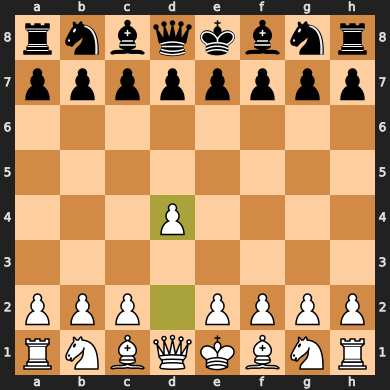



-b7b5




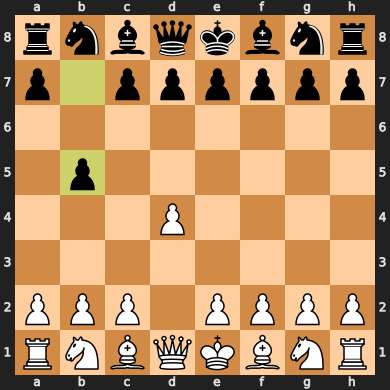



-c1e3




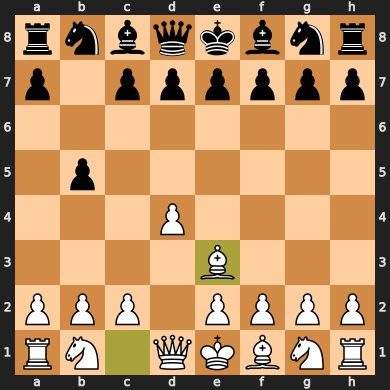



-h7h6




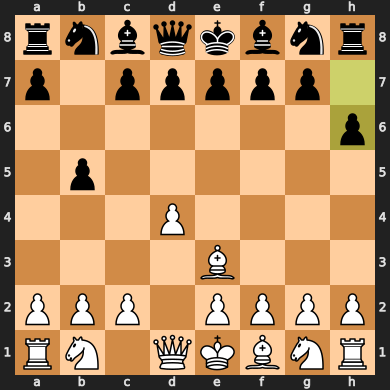



-g2g4




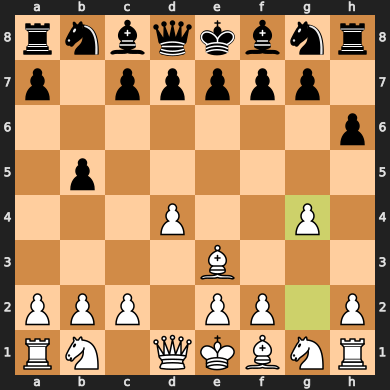



-g8f6


-b1c3


-b8c6


-g1f3


-e7e6


-d1d3


-f8d6


-d3b5


-c8b7


-b5b7


-c6d4


-f3d4


-e8e7


-f1g2


-c7c6


-d4c6


-e7f8


-c6d8


-a8d8


-e1d2


-f8e7


-b7a7


-e6e5


-a7a5


-d8b8


-h2h4


-b8b2


-a5a4


-h8c8


-h4h5


-c8b8


-a4c4


-b8h8


-a2a4


-h8b8


-a4a5


-b8h8


-a5a6


-h8b8


-a6a7


-b2c2


-d2c2


-b8a8


-g2a8


-e7f8


-a8f3


-e5e4


-a7a8q


-f8e7


-f3g2


-f6g4


-a8e4


-e7d8


-e4g4


-d8e7


-g4g7


-e7e8


-g7f7


-e8d8


-f7f6


-d8e8


-c4c8


-g1f3




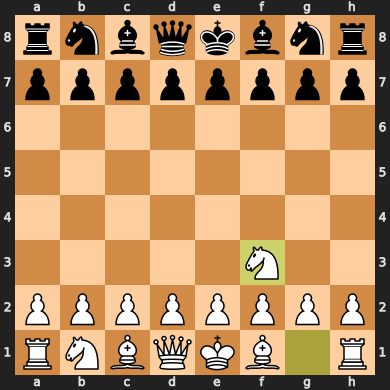



-d7d6




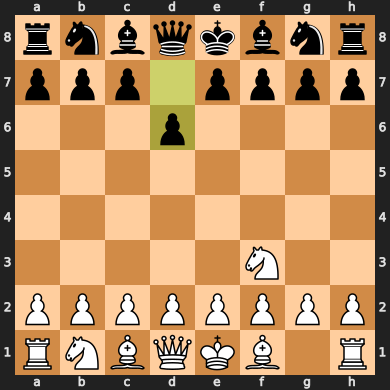



-b2b3




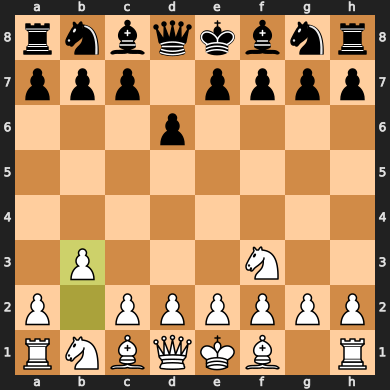



-c7c5




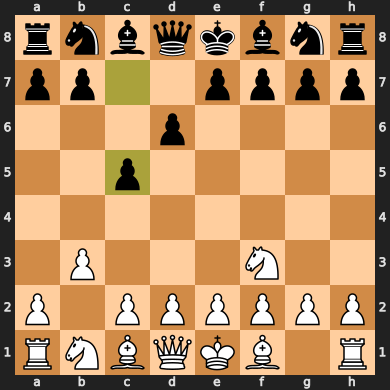



-h2h4




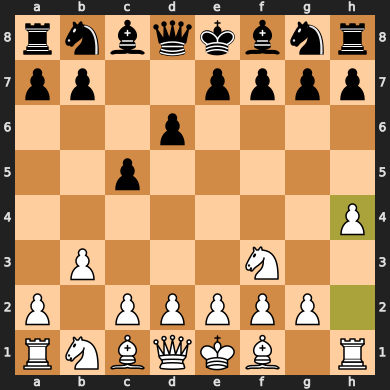



-g8f6


-b1c3


-b8c6


-e2e4


-c8e6


-d2d4


-d8a5


-f1c4


-a5c3


-e1e2


-e6c4


-b3c4


-f6e4


-c1f4


-e7e5


-d4e5


-d6e5


-d1d5


-c3c2


-e2e3


-e5f4


-e3f4


-g7g5


-h4g5


-f8d6


-f4e3


-c2f2


-e3e4


-f2e2


-e4f5


-e2c2


-f5g4


-c2g2


-g4f5


-g2c2


-f5g4


-c2g2


-g4f5


-g2c2


-f5g4


-c2g2


-g4f5


-g2c2


-f5g4


-c2g2


-g4f5


-g2c2


-f5g4


-h7h5


-g5h6


-c2g2


-g4h4


-h8h6


-d5h5


-g2g3




In [25]:
infrastructure = Infrastructure()

for i in range(0,200):
  state = ChessState('minmax', 2, 'minmax', 2)

  state.initialization()

  while not(state.final()):
    action = state.nextAction()
    infrastructure.main(state, action)
    state.result()

## **Predictor training**

In [11]:
predictor = Predictor()

Epoch 1/50
3000/3000 [==============================] - 20s 6ms/step - loss: 119067512.0000 - mae: 2085.7219 - mse: 119067512.0000 - val_loss: 116963160.0000 - val_mae: 1813.7155 - val_mse: 116963160.0000
Epoch 2/50
3000/3000 [==============================] - 18s 6ms/step - loss: 116489336.0000 - mae: 1941.0503 - mse: 116489336.0000 - val_loss: 117143272.0000 - val_mae: 2486.1367 - val_mse: 117143272.0000
Epoch 3/50
3000/3000 [==============================] - 17s 6ms/step - loss: 116048472.0000 - mae: 2128.4272 - mse: 116048472.0000 - val_loss: 116084136.0000 - val_mae: 2048.6204 - val_mse: 116084136.0000
Epoch 4/50
3000/3000 [==============================] - 18s 6ms/step - loss: 115721144.0000 - mae: 2174.5447 - mse: 115721144.0000 - val_loss: 115988056.0000 - val_mae: 2518.7256 - val_mse: 115988056.0000
Epoch 5/50
3000/3000 [==============================] - 18s 6ms/step - loss: 115600568.0000 - mae: 2210.3357 - mse: 115600568.0000 - val_loss: 115380216.0000 - val_mae: 2203.2573 -

## **Experiments on different players**

### **Predictive L MinMax1 vs Speed Up MinMaxL**

Start situation



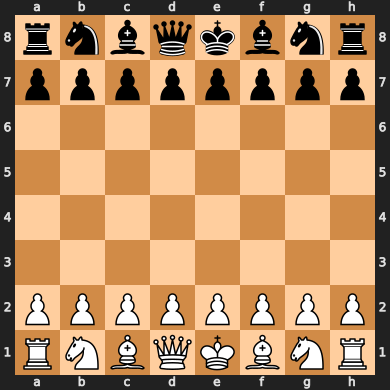



Sequence of moves:

1/1 [==============================] - 0s 18ms/step
-g1f3




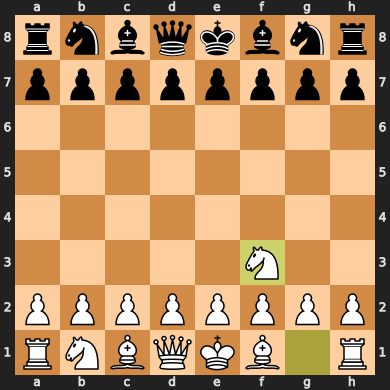



-g8f6




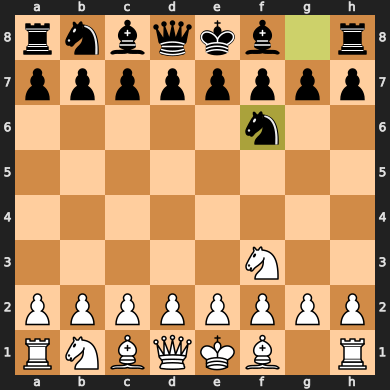



1/1 [==============================] - 0s 18ms/step
-b1c3




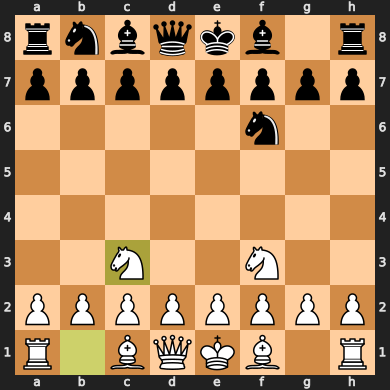



-b8c6




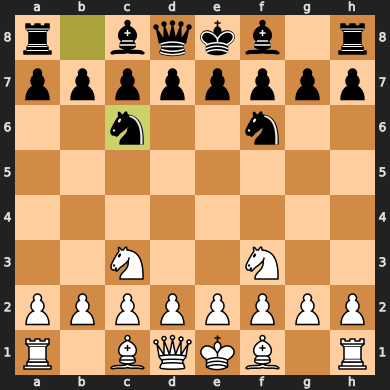



1/1 [==============================] - 0s 19ms/step
-d2d4




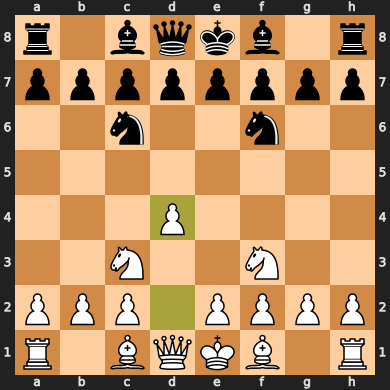



-d7d5




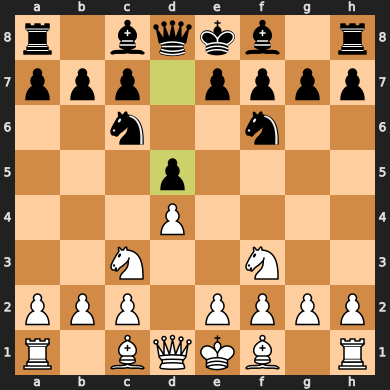



1/1 [==============================] - 0s 19ms/step
-e2e4




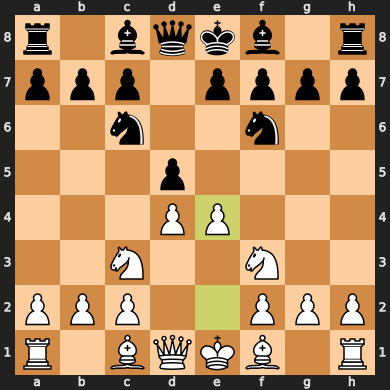



-d5e4




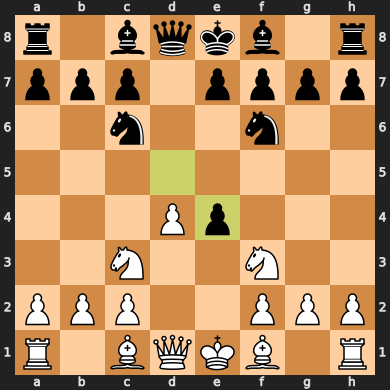



1/1 [==============================] - 0s 17ms/step
-c3e4




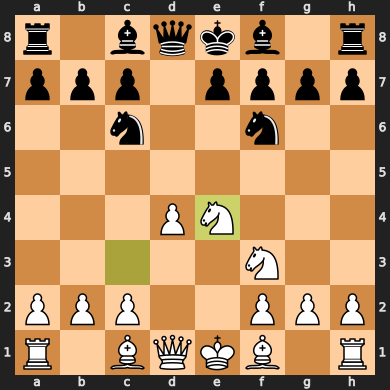



-f6e4




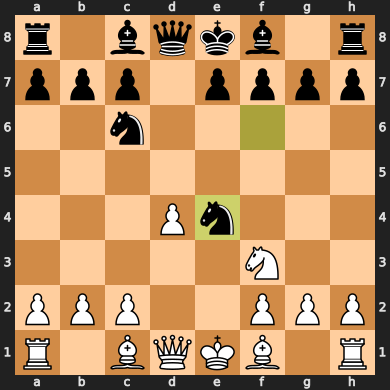



1/1 [==============================] - 0s 18ms/step
-c1f4




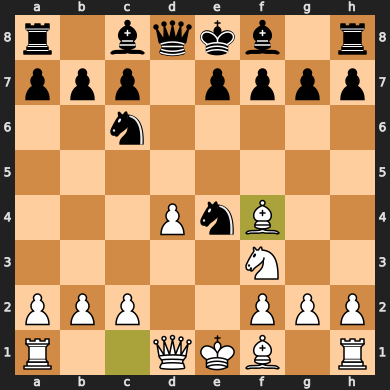



-d8d5




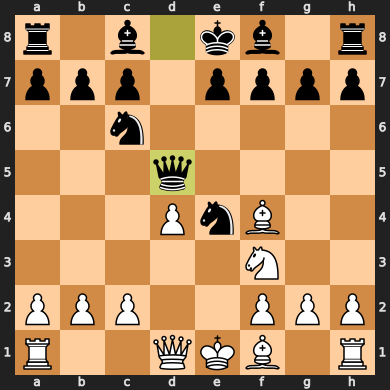



1/1 [==============================] - 0s 17ms/step
-f1c4




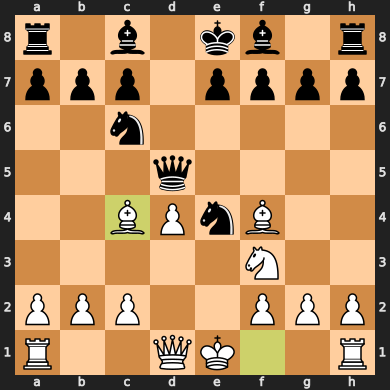



-d5c4




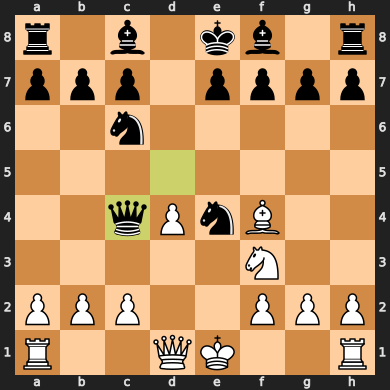



1/1 [==============================] - 0s 18ms/step
-d1d3




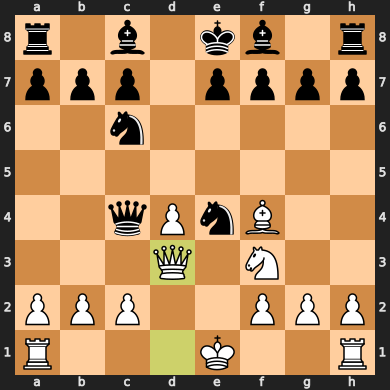



-c4d3




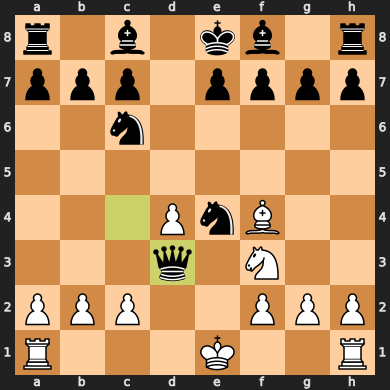



1/1 [==============================] - 0s 18ms/step
-c2d3




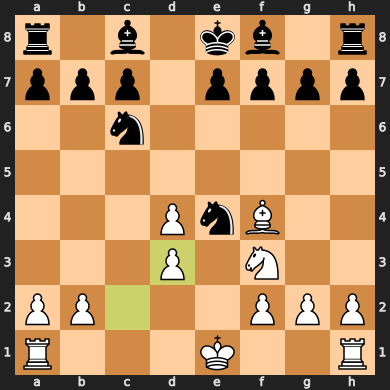



-e4f6




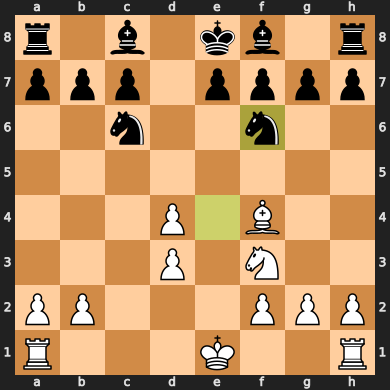



1/1 [==============================] - 0s 19ms/step
-e1g1




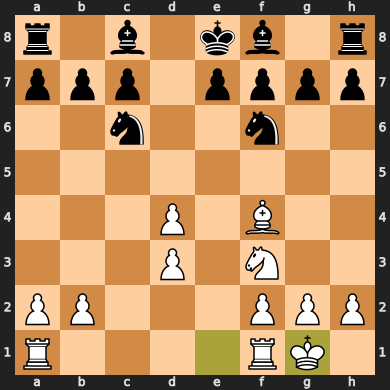



-c8e6




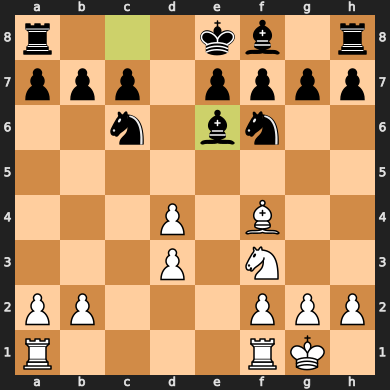



1/1 [==============================] - 0s 19ms/step
-f1e1




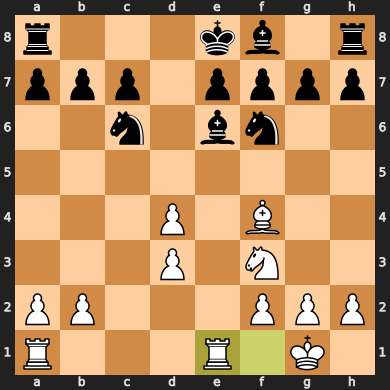



-e6f5




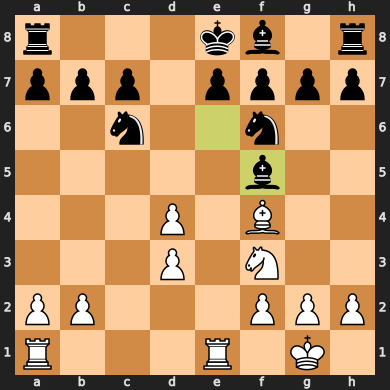



1/1 [==============================] - 0s 19ms/step
-f4c7




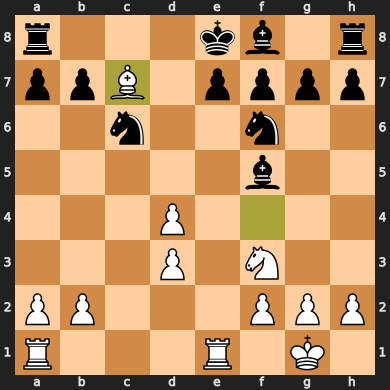



-f5d3




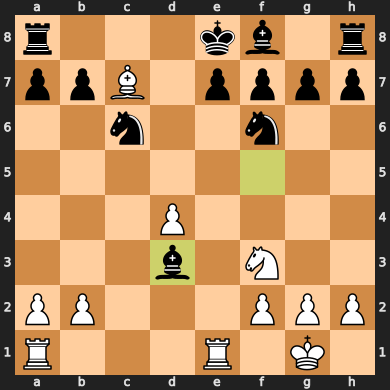



1/1 [==============================] - 0s 19ms/step
-c7f4




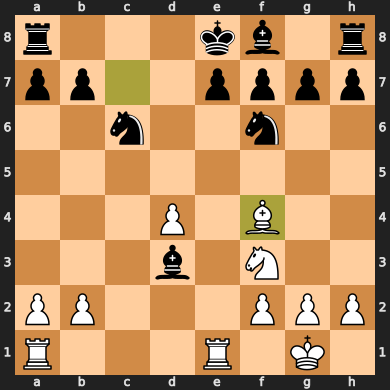



-e7e6




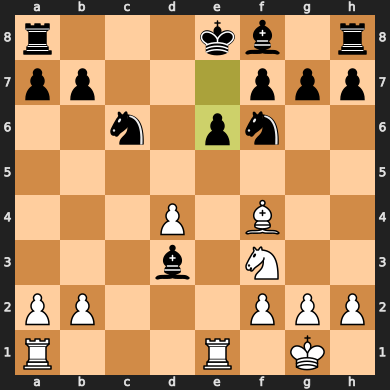



1/1 [==============================] - 0s 19ms/step
-e1e6




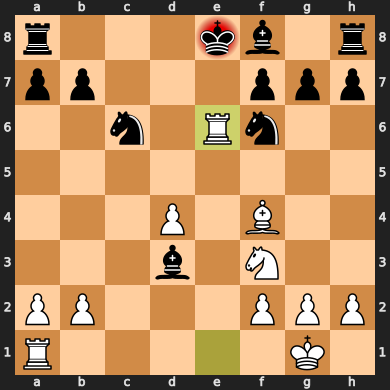



-f7e6




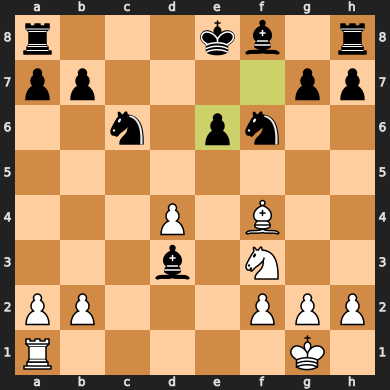



1/1 [==============================] - 0s 22ms/step
-a1e1




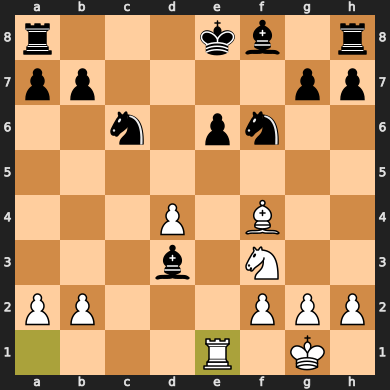



-f8b4




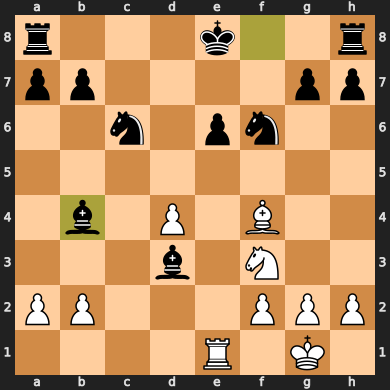



1/1 [==============================] - 0s 19ms/step
-e1e6




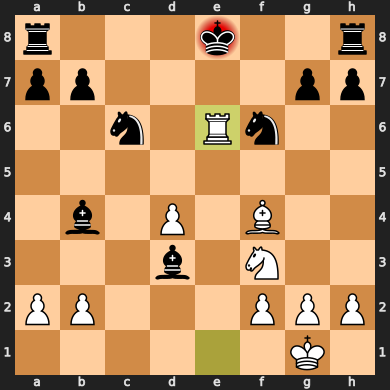



-e8f7




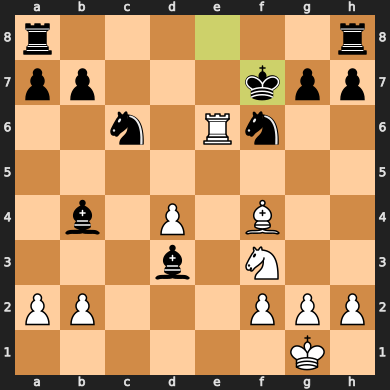



1/1 [==============================] - 0s 19ms/step
-e6c6




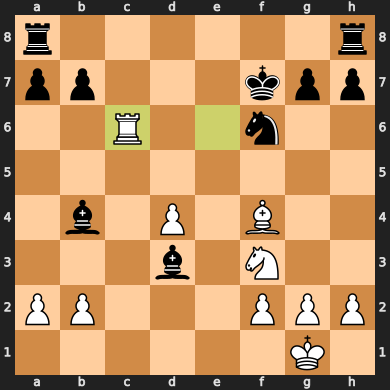



-b7c6




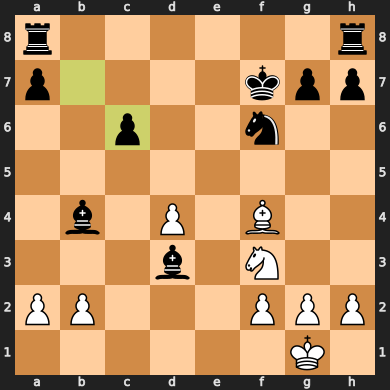



1/1 [==============================] - 0s 22ms/step
-f4d6




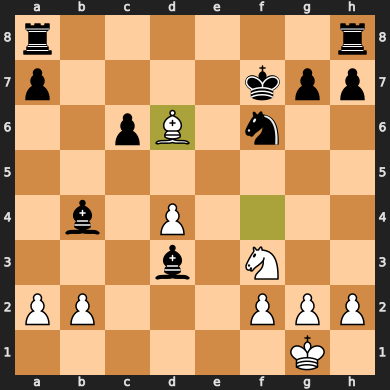



-b4d6




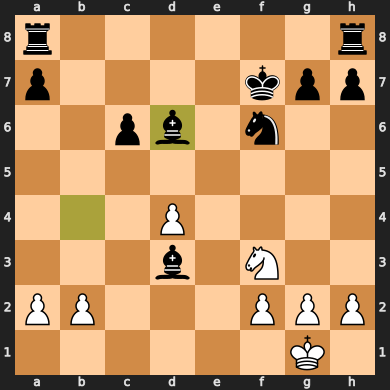



1/1 [==============================] - 0s 20ms/step
-f3e5




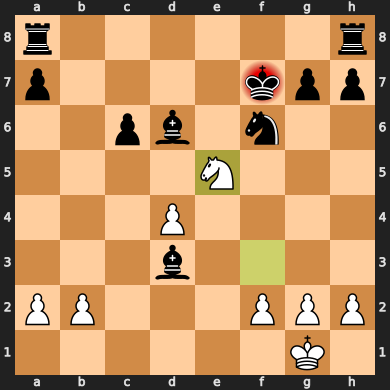



-d6e5




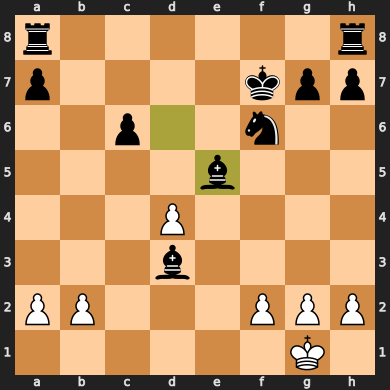



1/1 [==============================] - 0s 20ms/step
-d4e5




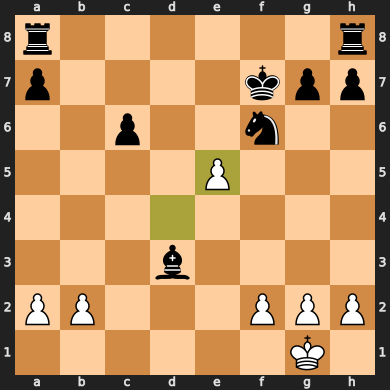



-f6d5




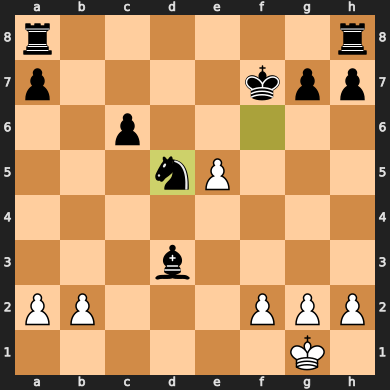



1/1 [==============================] - 0s 19ms/step
-e5e6




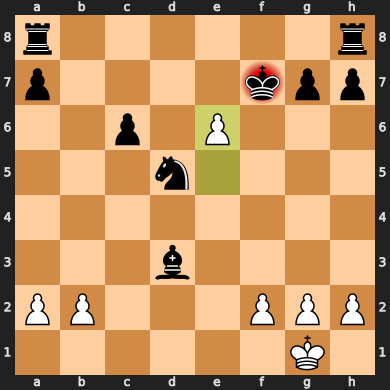



-f7e6




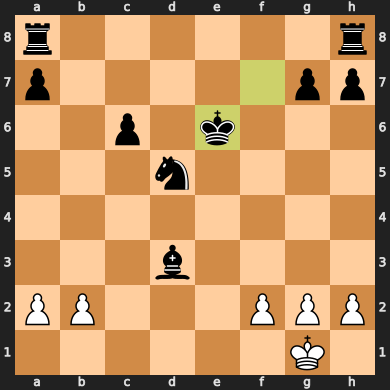



1/1 [==============================] - 0s 21ms/step
-h2h3




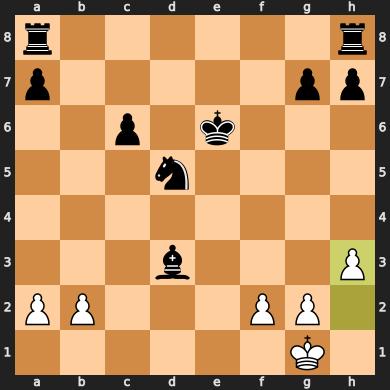



-a8b8




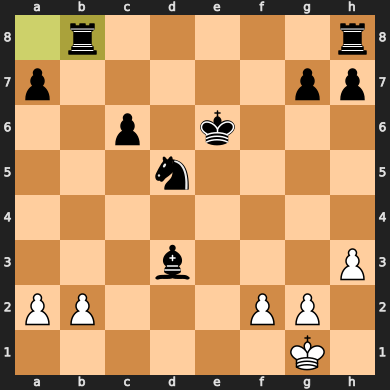



1/1 [==============================] - 0s 22ms/step
-b2b4




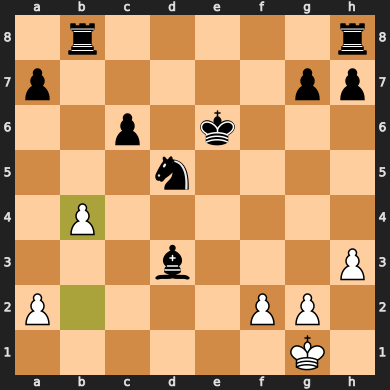



-b8b4




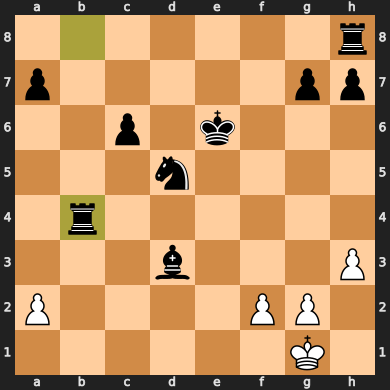



1/1 [==============================] - 0s 21ms/step
-f2f4




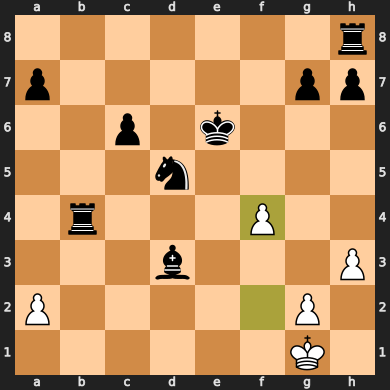



-b4f4




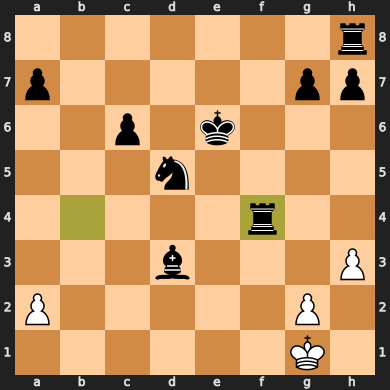



1/1 [==============================] - 0s 24ms/step
-g2g4




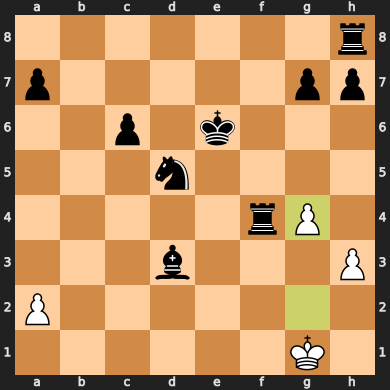



-h8b8




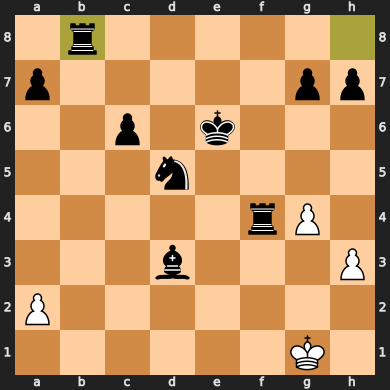



1/1 [==============================] - 0s 25ms/step
-g1g2




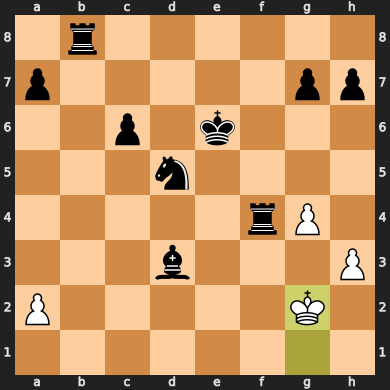



-e6e7




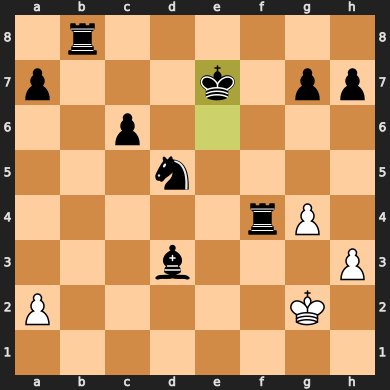



1/1 [==============================] - 0s 30ms/step
-g2g3




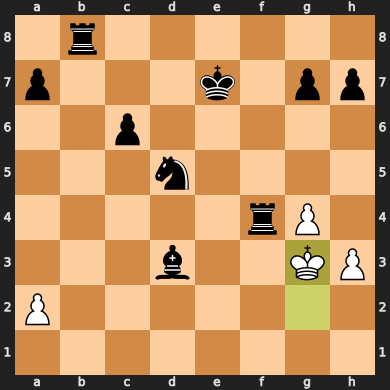



-b8b2




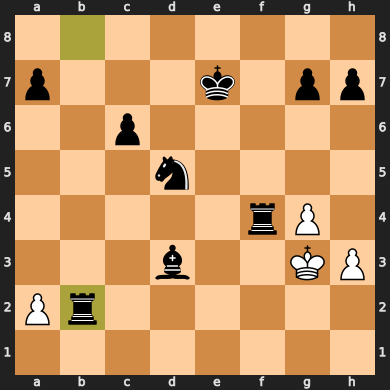



1/1 [==============================] - 0s 26ms/step
-h3h4




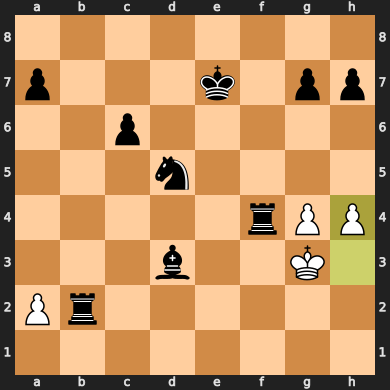



-b2a2




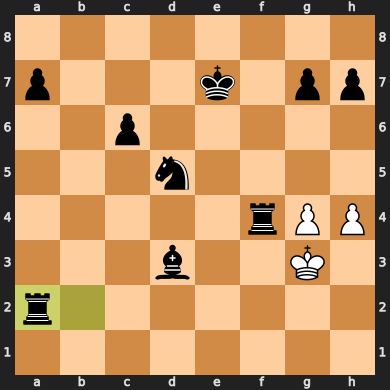



1/1 [==============================] - 0s 30ms/step
-h4h5




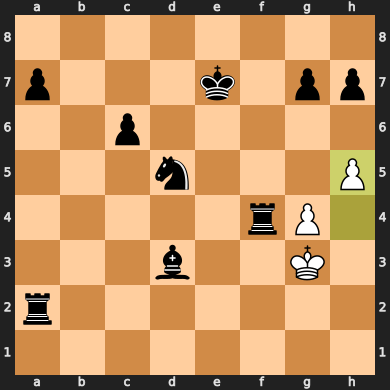



-a2b2




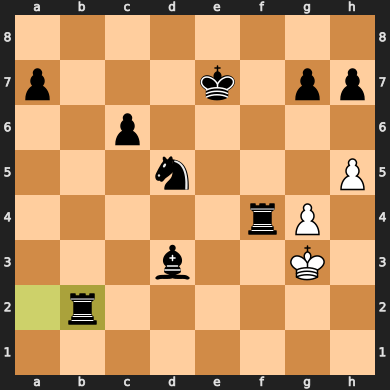



1/1 [==============================] - 0s 26ms/step
-h5h6




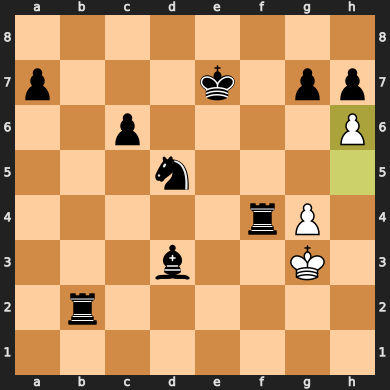



-g7h6




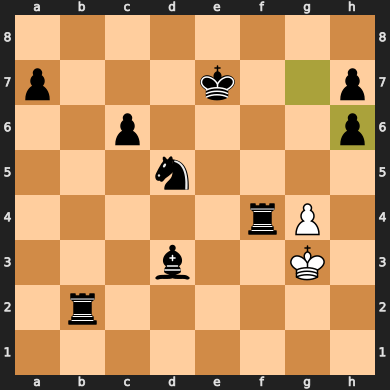



1/1 [==============================] - 0s 27ms/step
-g4g5




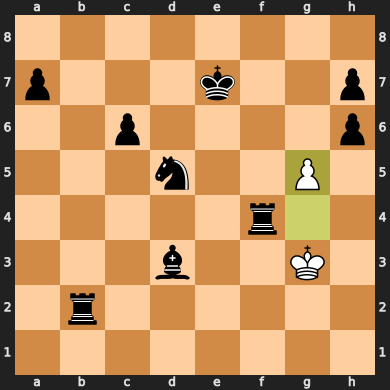



-h6g5




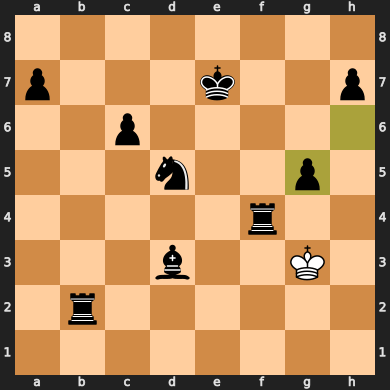



1/1 [==============================] - 0s 33ms/step
-g3h3




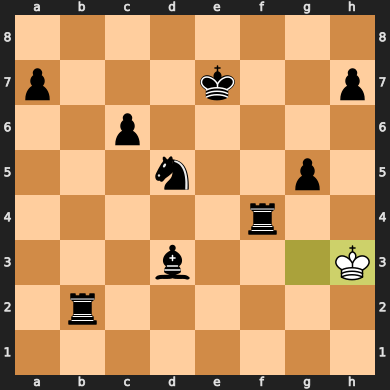



-c6c5




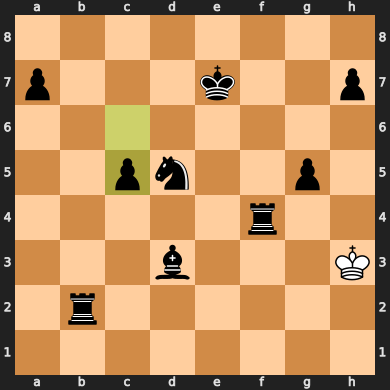



1/1 [==============================] - 0s 27ms/step
-h3g3




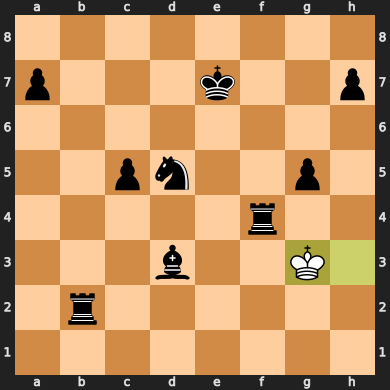



-g5g4




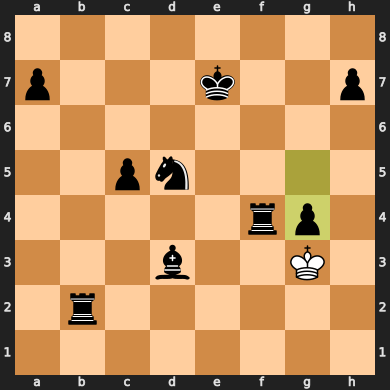



1/1 [==============================] - 0s 25ms/step
-g3h4




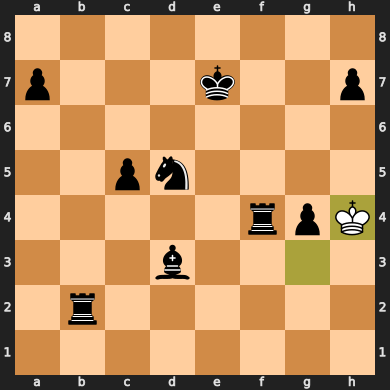



-e7d7




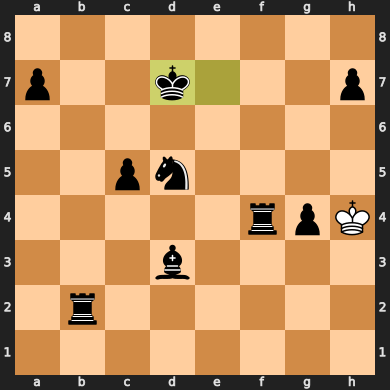



1/1 [==============================] - 0s 26ms/step
-h4g5




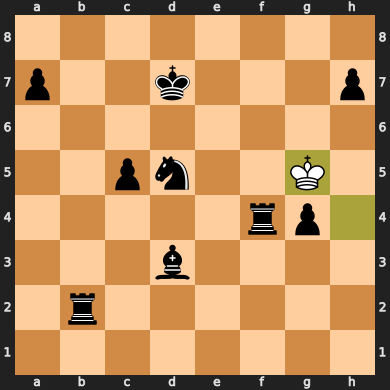



-g4g3




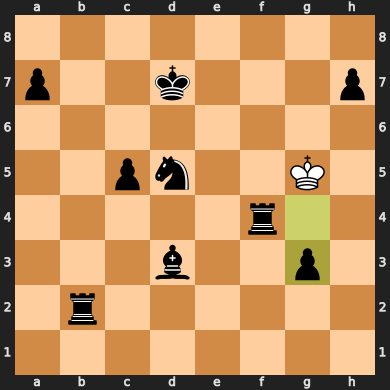



1/1 [==============================] - 0s 27ms/step
-g5h6




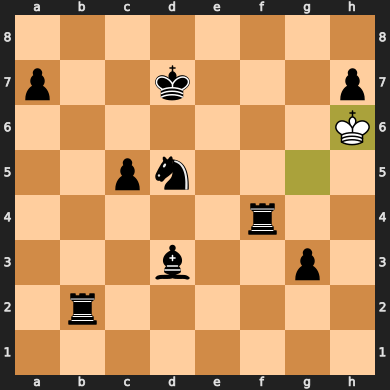



-g3g2




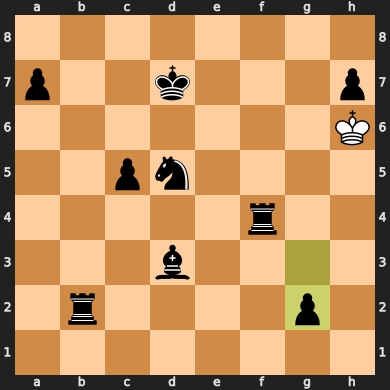



1/1 [==============================] - 0s 27ms/step
-h6g7




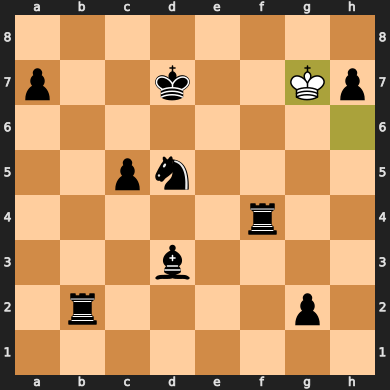



-g2g1q




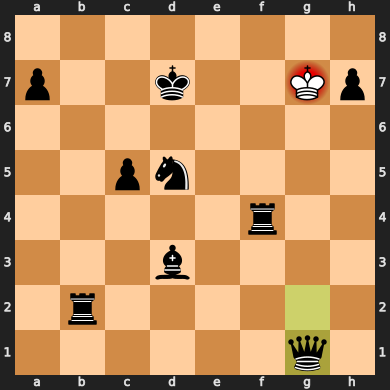



1/1 [==============================] - 0s 28ms/step
-g7h6




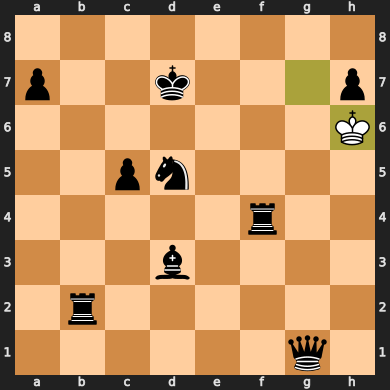



-f4h4




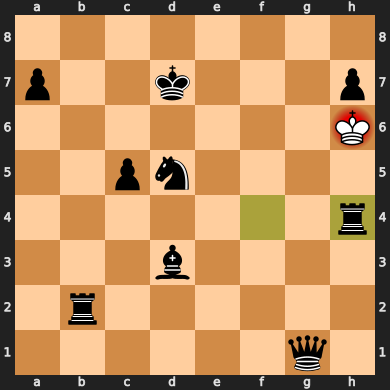



Final situation



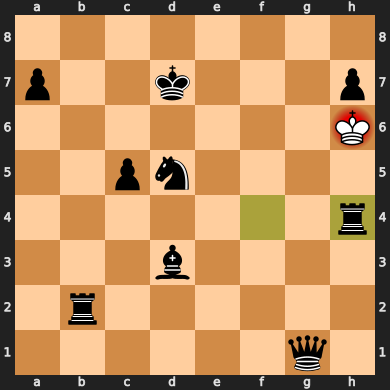



0-1
Cause of termination: Checkmate
# of moves: 76


In [14]:
infrastructure = Infrastructure()

state = ChessState('ai', 2, 'minmax', 2)

print('Start situation\n')
state.show()
print('Sequence of moves:\n')

while not(state.final()):
  action = state.nextAction()
  infrastructure.main(state, action)
  state.show()

print('Final situation\n')
state.show()
state.result()

Start situation



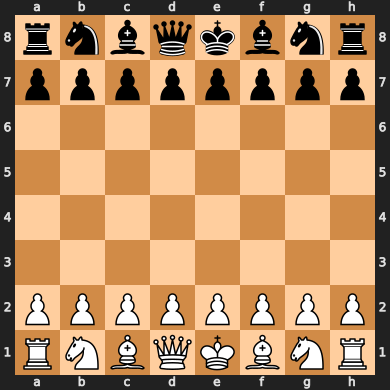



Sequence of moves:

-g1f3




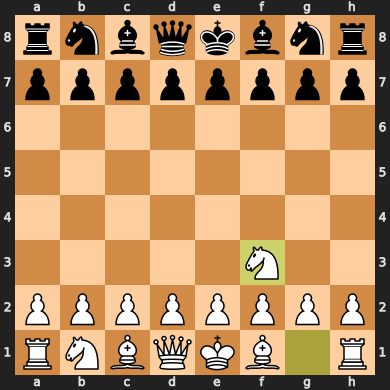



1/1 [==============================] - 0s 18ms/step
-h7h5




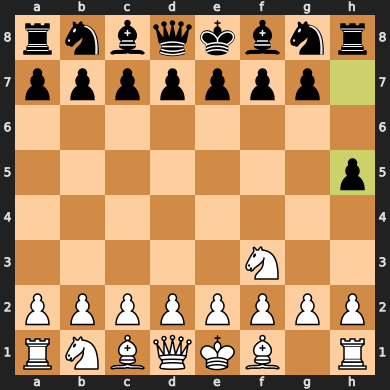



-b1c3




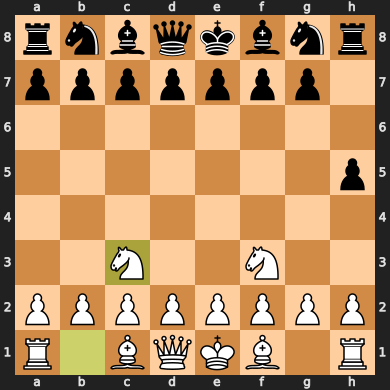



1/1 [==============================] - 0s 19ms/step
-g8f6




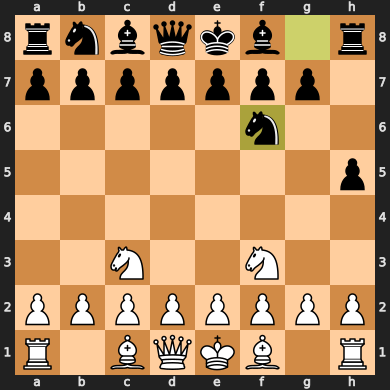



-d2d4




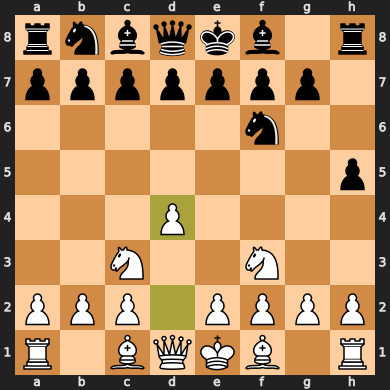



1/1 [==============================] - 0s 18ms/step
-b8c6




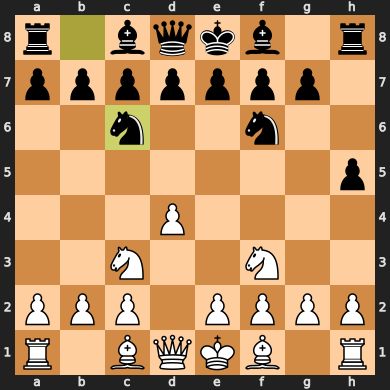



-e2e4




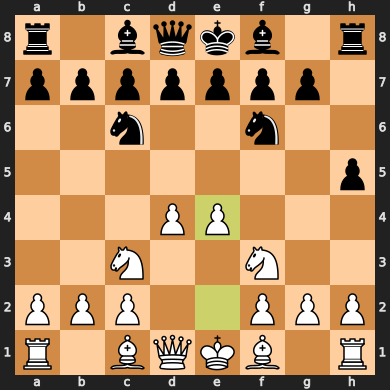



1/1 [==============================] - 0s 19ms/step
-d7d5




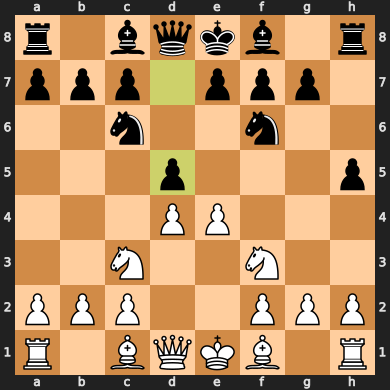



-c1f4




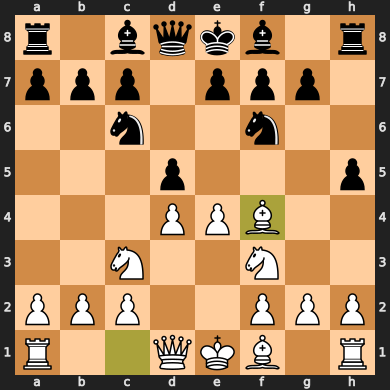



1/1 [==============================] - 0s 18ms/step
-d5e4




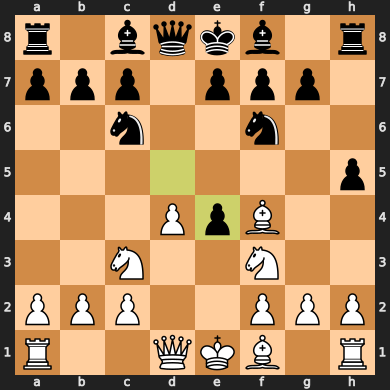



-f1c4




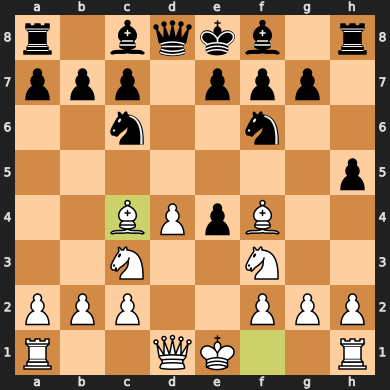



1/1 [==============================] - 0s 17ms/step
-c6d4




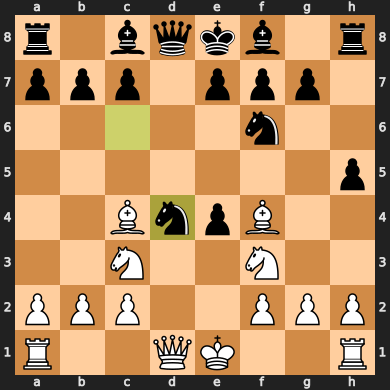



-f3d4




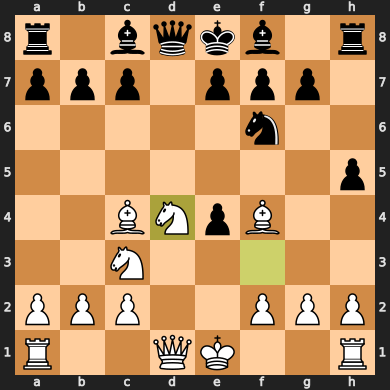



1/1 [==============================] - 0s 17ms/step
-d8d4




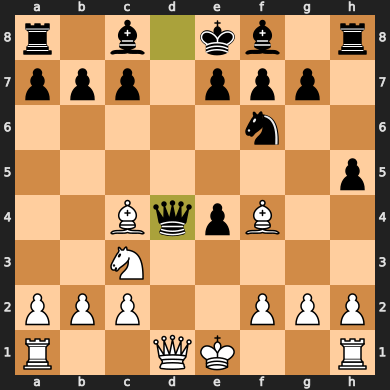



-d1d4




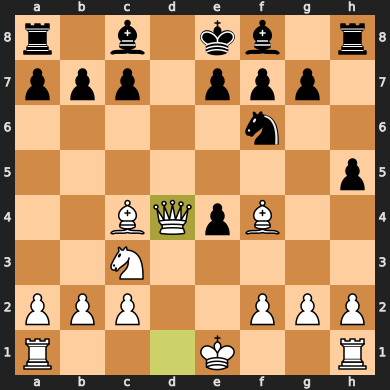



1/1 [==============================] - 0s 18ms/step
-f6g8




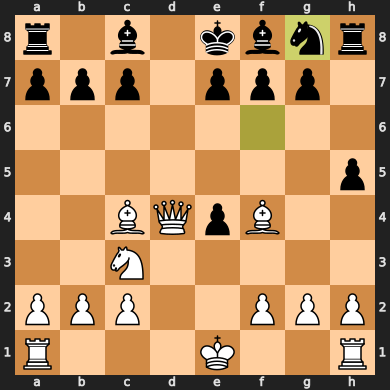



-c3e4




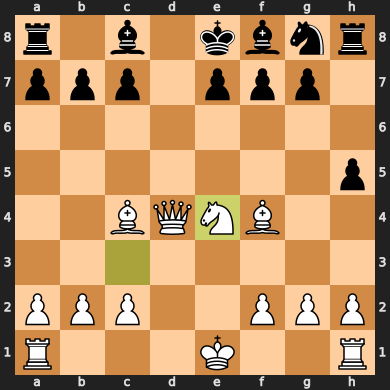



1/1 [==============================] - 0s 18ms/step
-f7f6




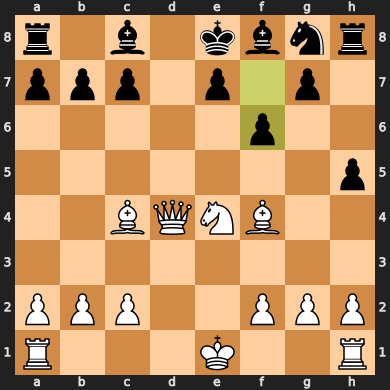



-e1e2




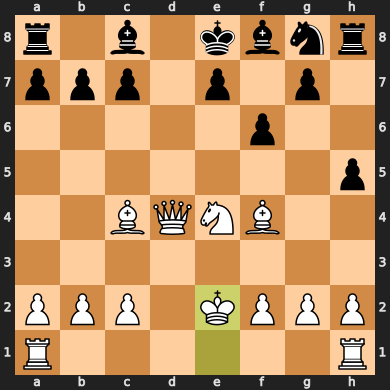



1/1 [==============================] - 0s 18ms/step
-b7b6




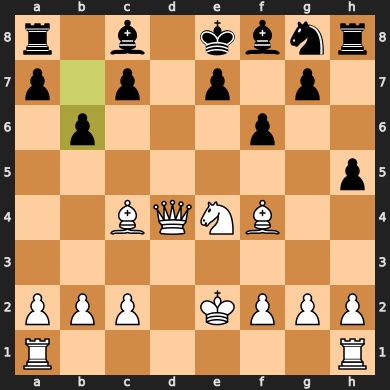



-c4b5




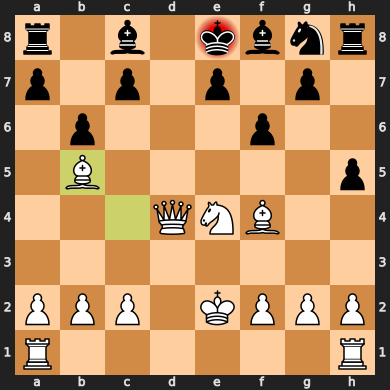



1/1 [==============================] - 0s 18ms/step
-c7c6




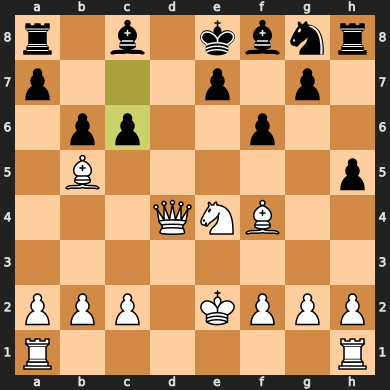



-b5c6




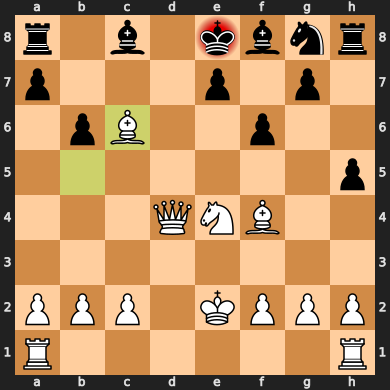



1/1 [==============================] - 0s 20ms/step
-e8f7




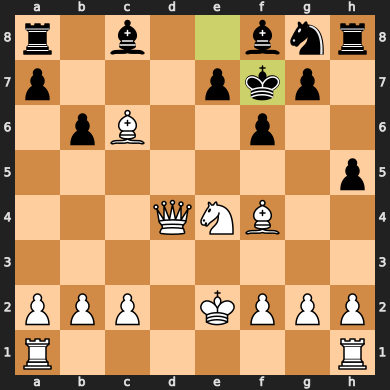



-c6a8




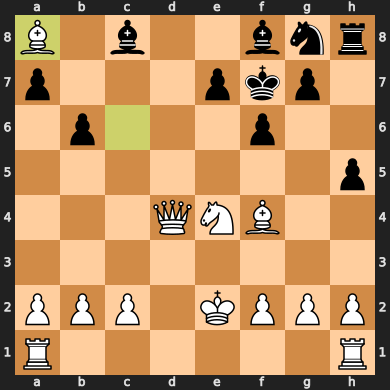



1/1 [==============================] - 0s 18ms/step
-f7g6




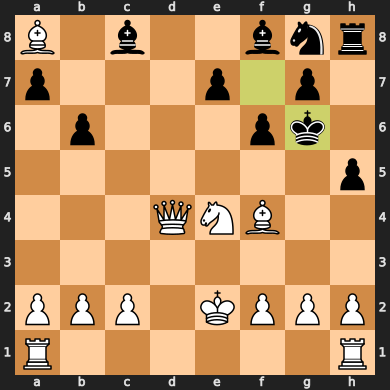



-a8c6




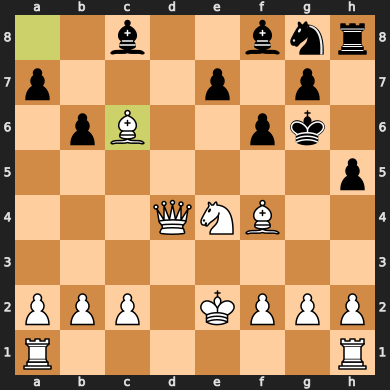



1/1 [==============================] - 0s 19ms/step
-g6f5




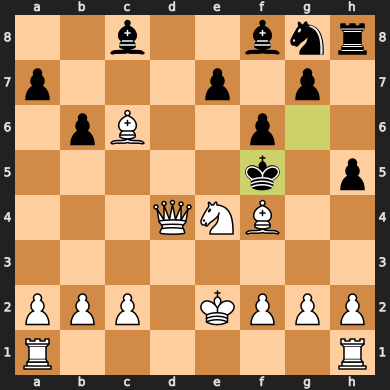



-e4g3




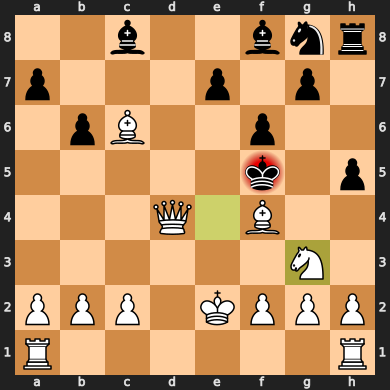



1/1 [==============================] - 0s 20ms/step
-f5g4




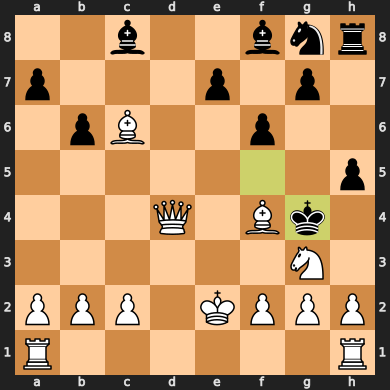



-f4h6




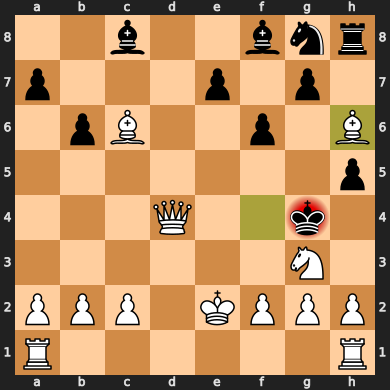



Final situation



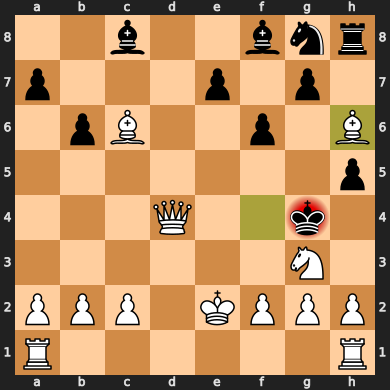



1-0
Cause of termination: Checkmate
# of moves: 31


In [15]:
infrastructure = Infrastructure()

state = ChessState('minmax', 2, 'ai', 2)

print('Start situation\n')
state.show()
print('Sequence of moves:\n')

while not(state.final()):
  action = state.nextAction()
  infrastructure.main(state, action)
  state.show()

print('Final situation\n')
state.show()
state.result()

### **Predictive L MinMax1 vs Speed Up MinMaxL/2**

Start situation



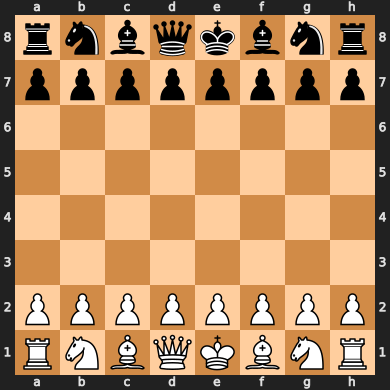



Sequence of moves:

1/1 [==============================] - 0s 18ms/step
-g1f3




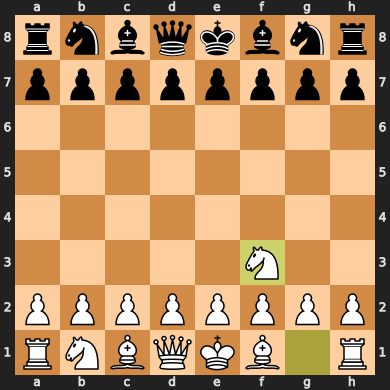



-g8f6




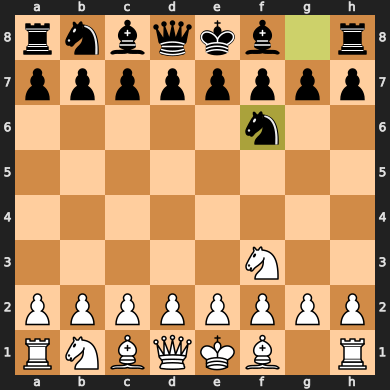



1/1 [==============================] - 0s 18ms/step
-b1c3




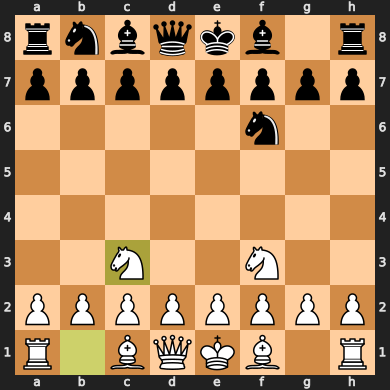



-b8c6




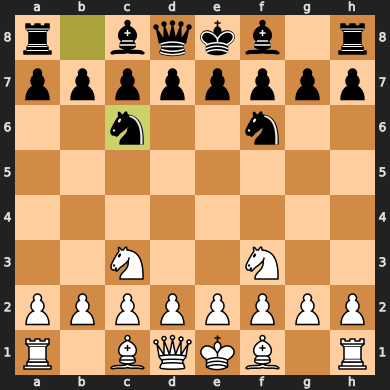



1/1 [==============================] - 0s 19ms/step
-d2d4




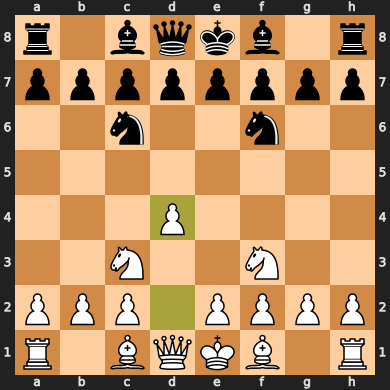



-d7d5




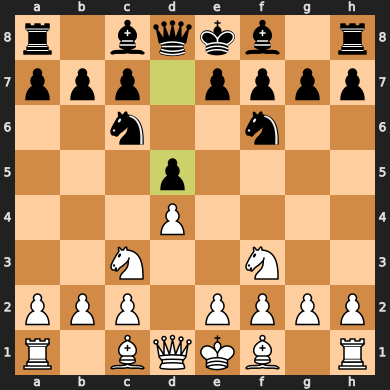



1/1 [==============================] - 0s 22ms/step
-e2e4




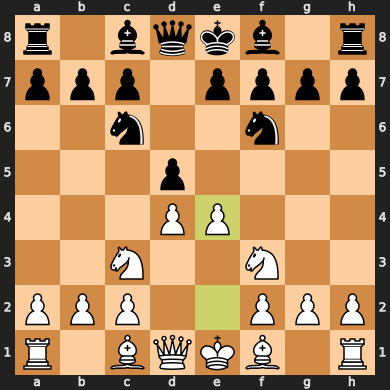



-e7e5




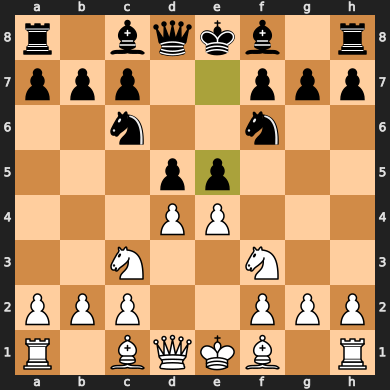



1/1 [==============================] - 0s 19ms/step
-f3e5




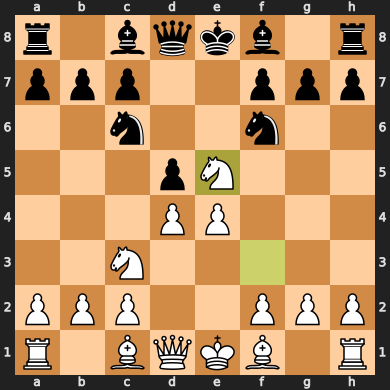



-c6e5




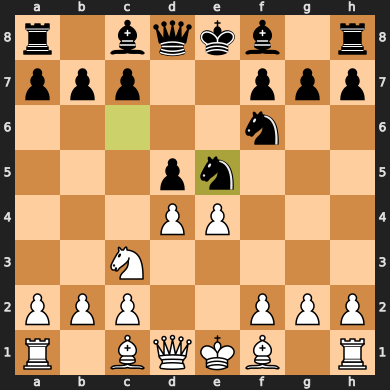



1/1 [==============================] - 0s 20ms/step
-d4e5




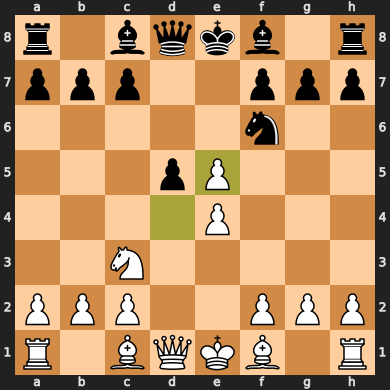



-f6e4




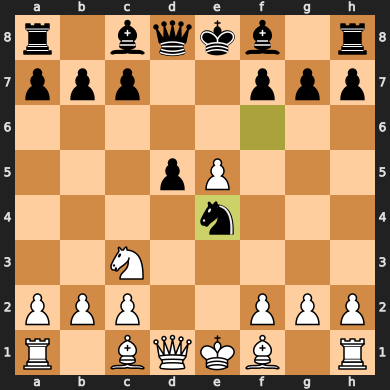



1/1 [==============================] - 0s 21ms/step
-c3e4




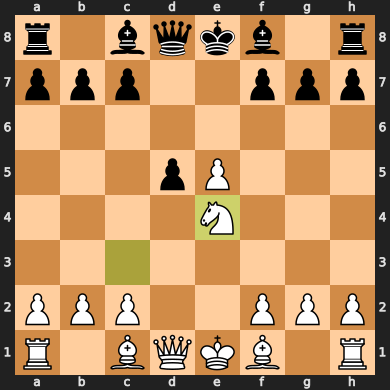



-d5e4




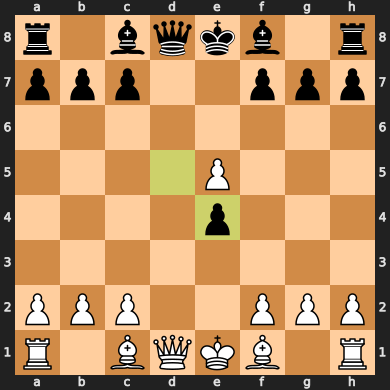



1/1 [==============================] - 0s 19ms/step
-d1d8




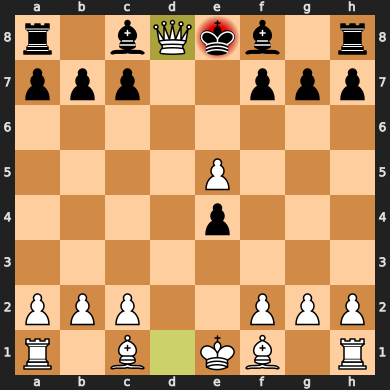



-e8d8




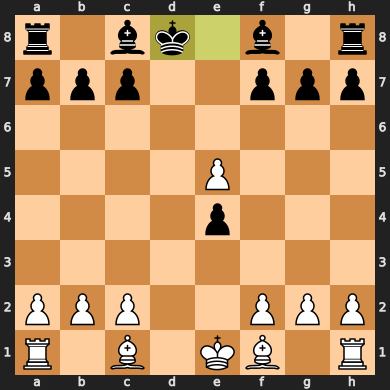



1/1 [==============================] - 0s 17ms/step
-c1e3




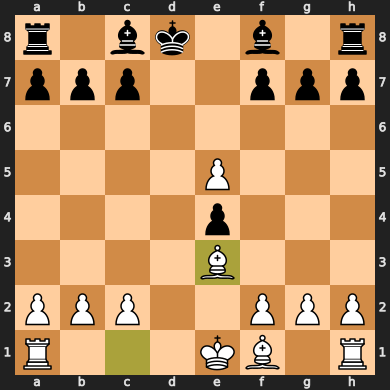



-f8c5




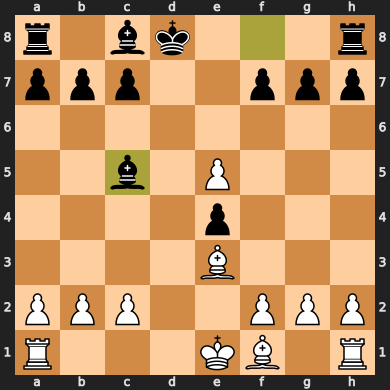



1/1 [==============================] - 0s 19ms/step
-e3c5




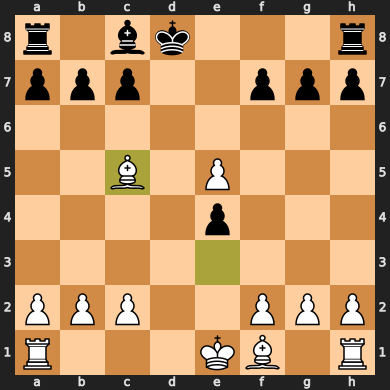



-c8e6




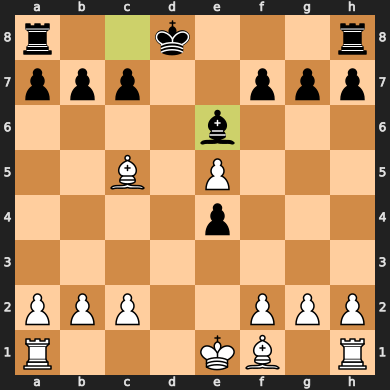



1/1 [==============================] - 0s 18ms/step
-f1c4




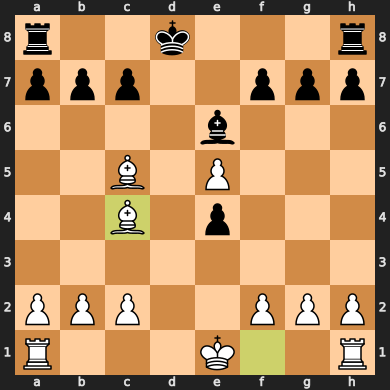



-e6c4




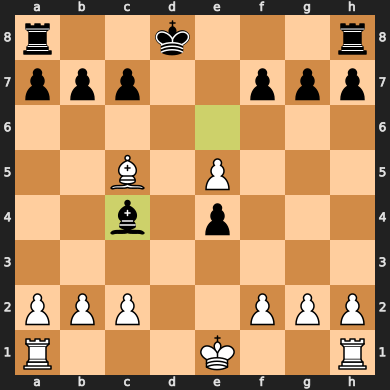



1/1 [==============================] - 0s 22ms/step
-e1c1




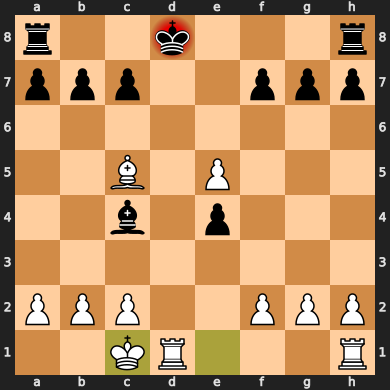



-c4d3




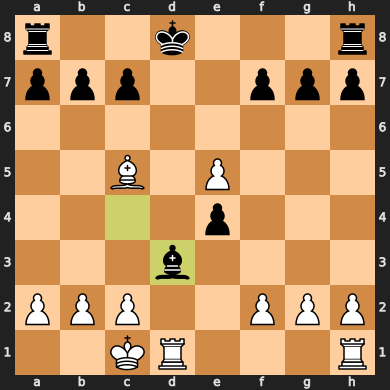



1/1 [==============================] - 0s 18ms/step
-d1d3




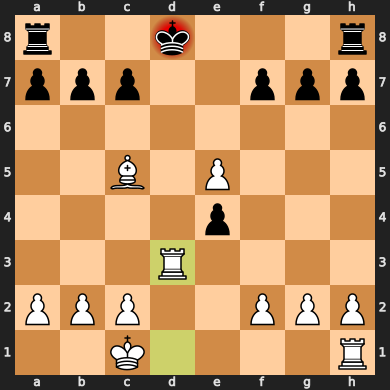



-e4d3




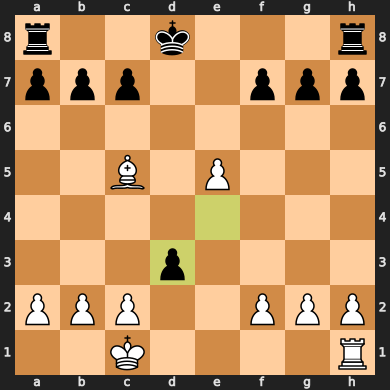



1/1 [==============================] - 0s 19ms/step
-c2d3




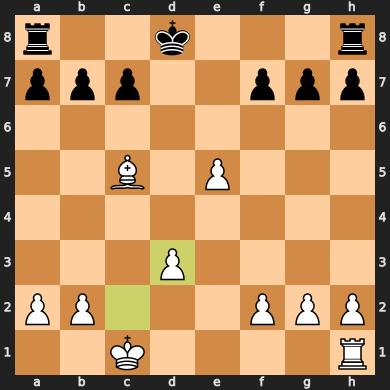



-d8d7




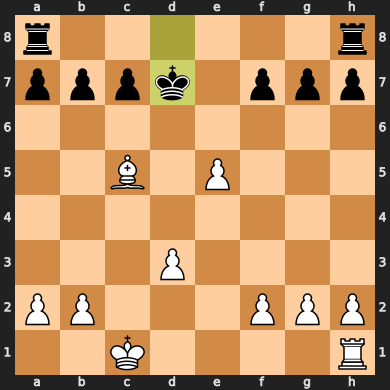



1/1 [==============================] - 0s 20ms/step
-c1b1




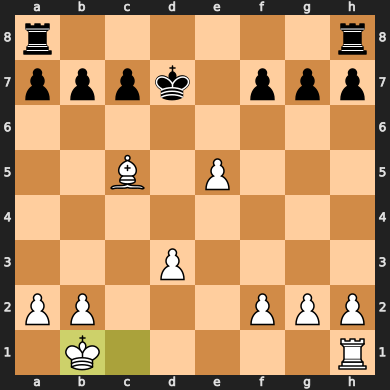



-h7h5




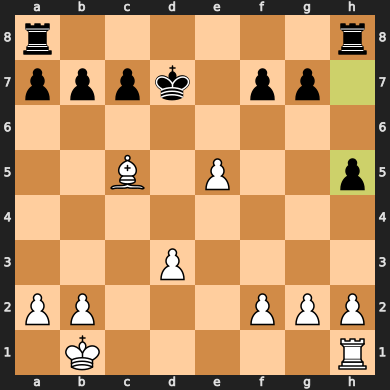



1/1 [==============================] - 0s 19ms/step
-d3d4




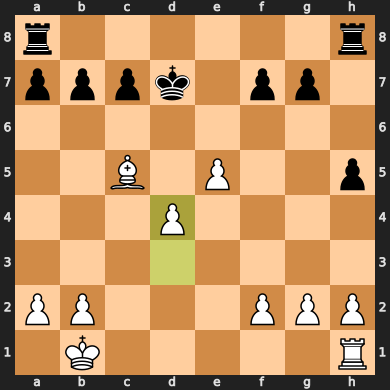



-h5h4




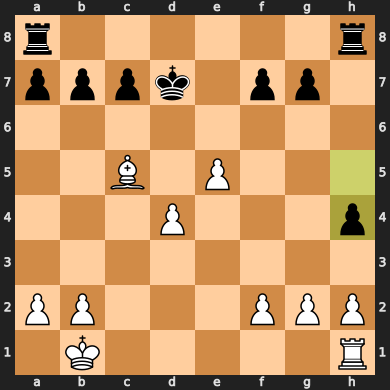



1/1 [==============================] - 0s 18ms/step
-h1e1




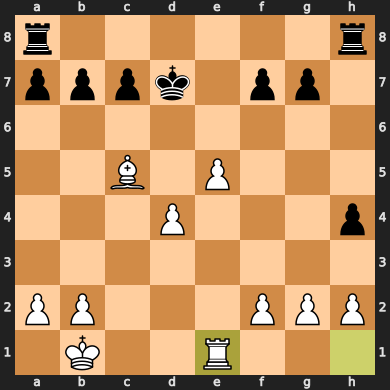



-h4h3




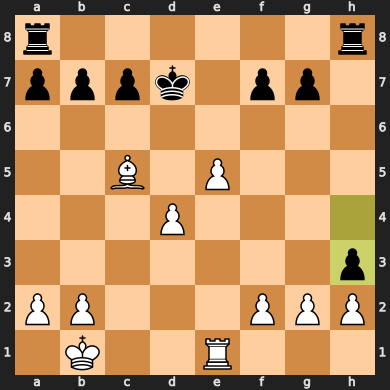



1/1 [==============================] - 0s 18ms/step
-g2h3




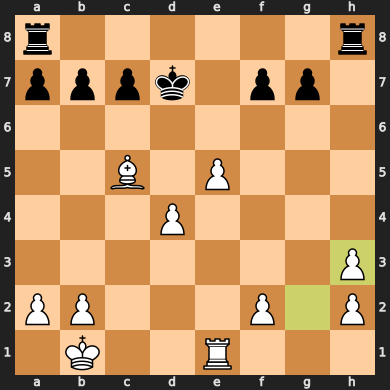



-h8h3




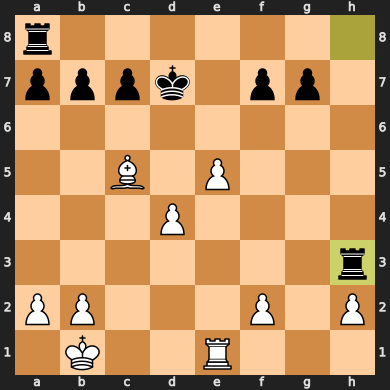



1/1 [==============================] - 0s 19ms/step
-d4d5




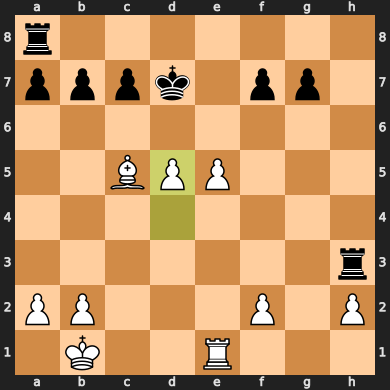



-a8h8




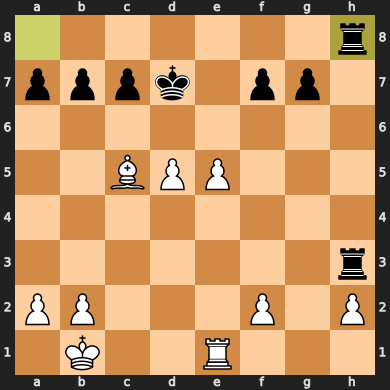



1/1 [==============================] - 0s 19ms/step
-c5e3




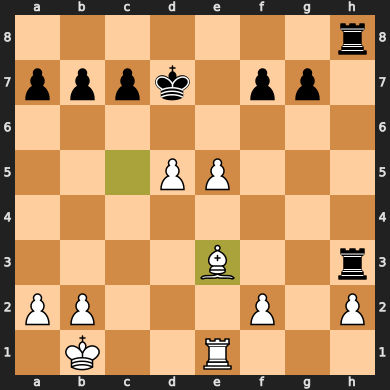



-h3e3




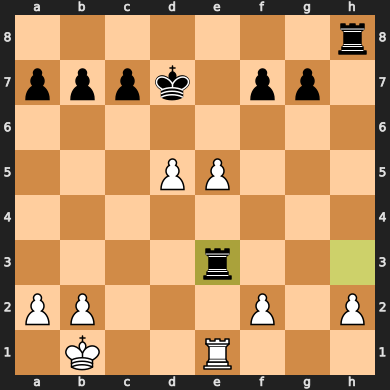



1/1 [==============================] - 0s 19ms/step
-e1e3




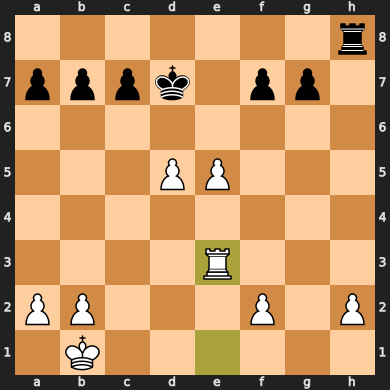



-h8h2




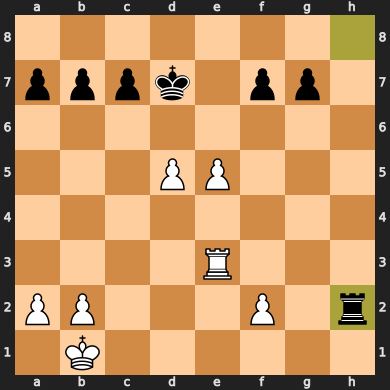



1/1 [==============================] - 0s 20ms/step
-e3h3




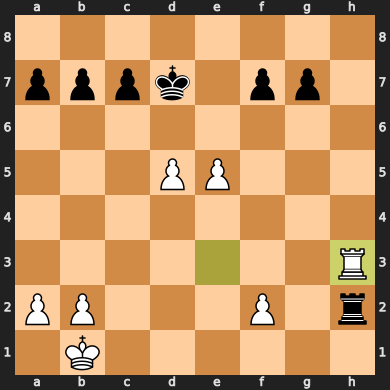



-h2h3




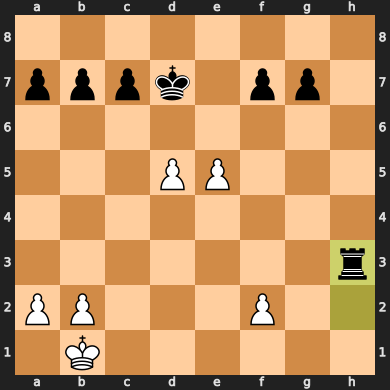



1/1 [==============================] - 0s 20ms/step
-e5e6




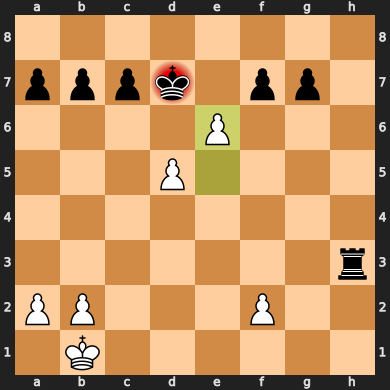



-f7e6




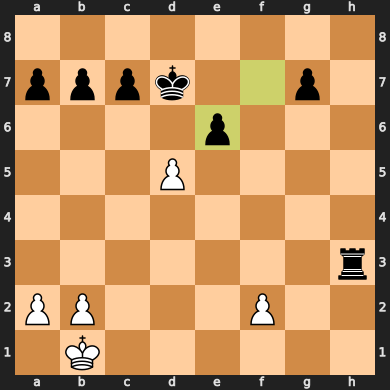



1/1 [==============================] - 0s 20ms/step
-d5e6




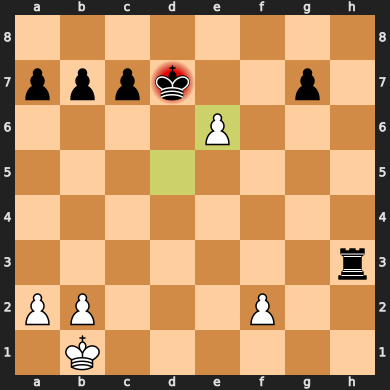



-d7e6




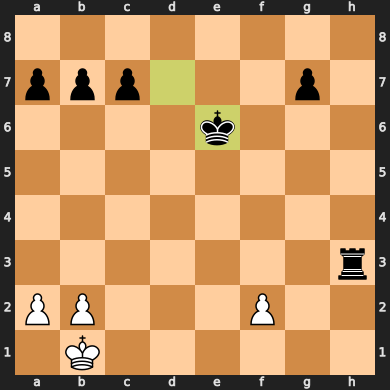



1/1 [==============================] - 0s 21ms/step
-a2a3




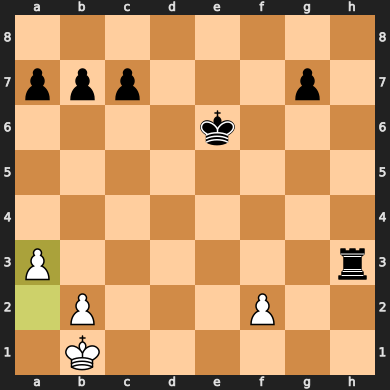



-h3a3




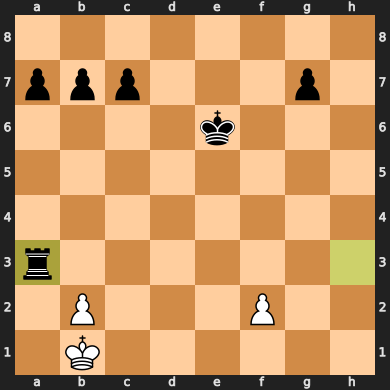



1/1 [==============================] - 0s 22ms/step
-b2a3




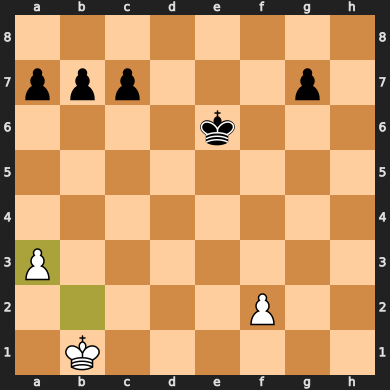



-e6f7




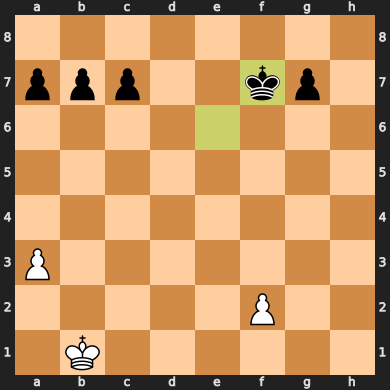



1/1 [==============================] - 0s 22ms/step
-b1b2




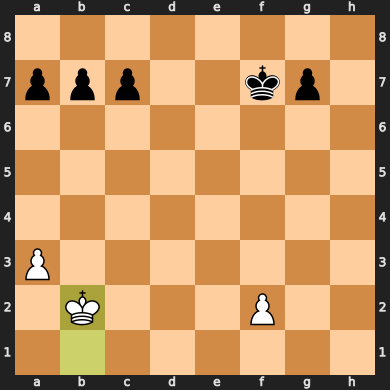



-f7g8




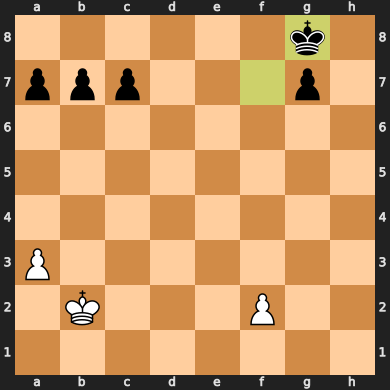



1/1 [==============================] - 0s 20ms/step
-b2b1




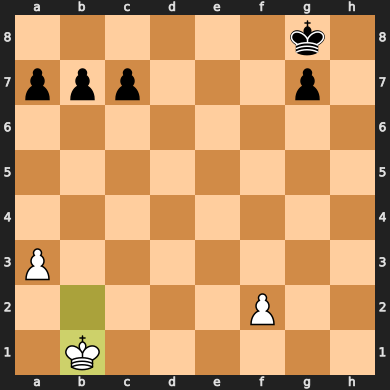



-a7a6




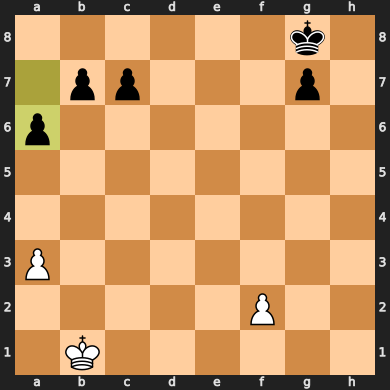



1/1 [==============================] - 0s 24ms/step
-b1b2




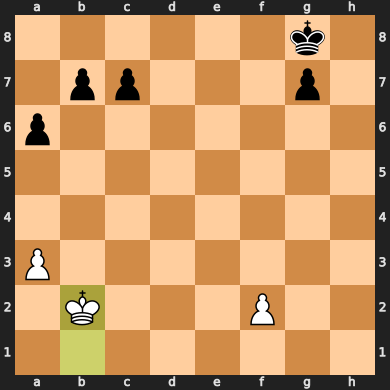



-a6a5




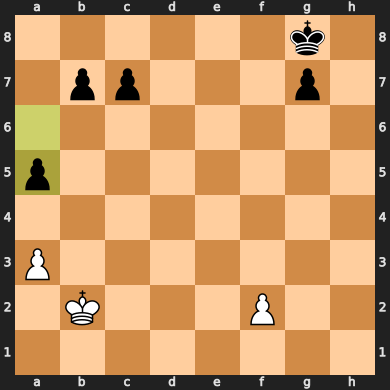



1/1 [==============================] - 0s 28ms/step
-b2b1




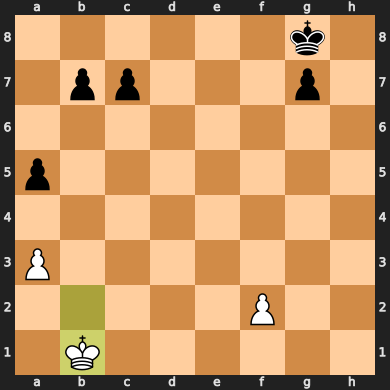



-a5a4




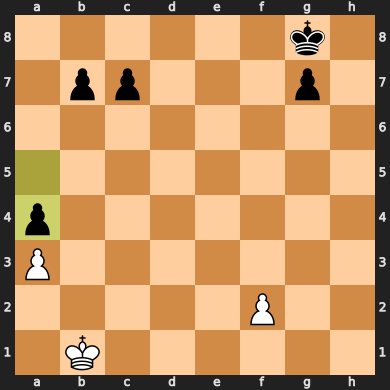



1/1 [==============================] - 0s 26ms/step
-b1b2




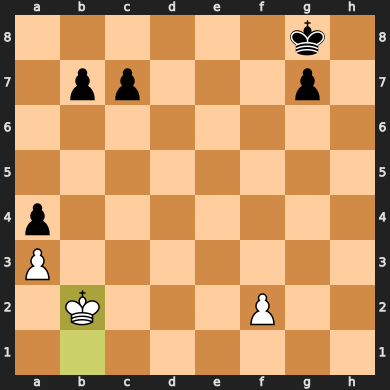



-g8h7




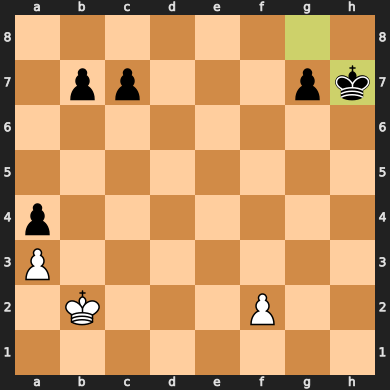



1/1 [==============================] - 0s 27ms/step
-b2b1




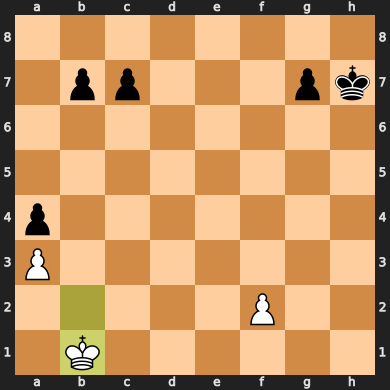



-h7g8




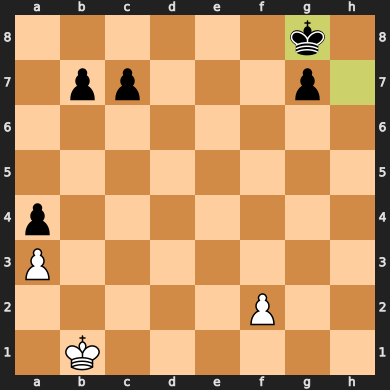



1/1 [==============================] - 0s 25ms/step
-b1b2




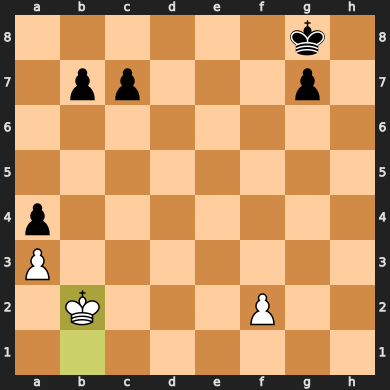



-g8h7




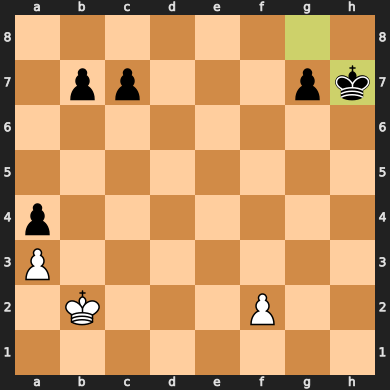



1/1 [==============================] - 0s 28ms/step
-b2b1




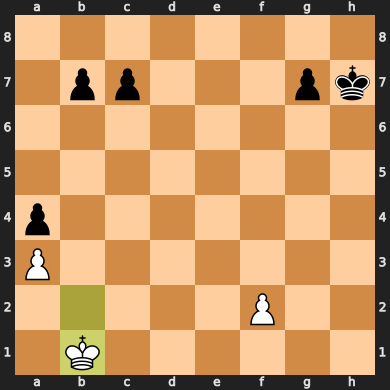



-h7g8




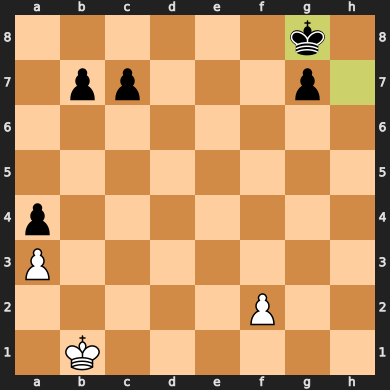



1/1 [==============================] - 0s 24ms/step
-b1b2




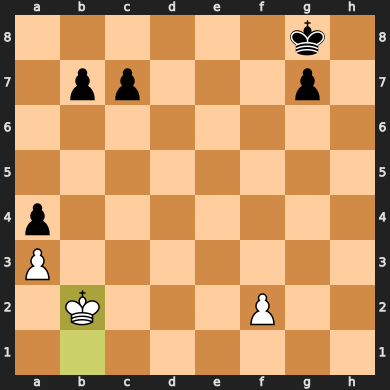



-g8h7




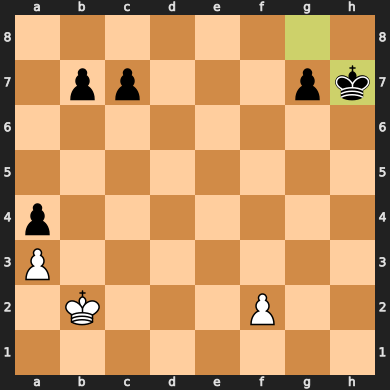



1/1 [==============================] - 0s 18ms/step
-b2b1




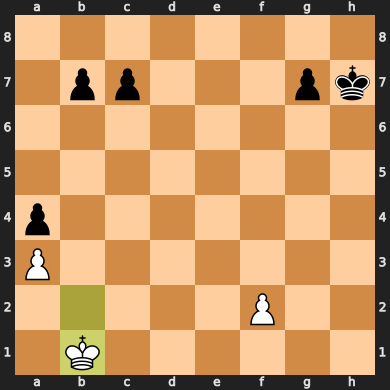



-h7g8




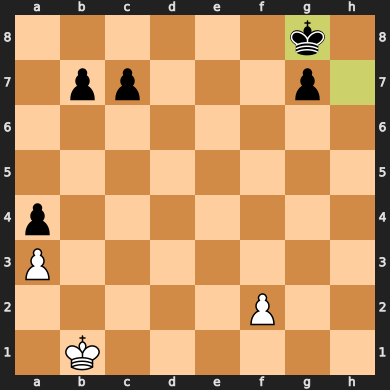



1/1 [==============================] - 0s 28ms/step
-b1b2




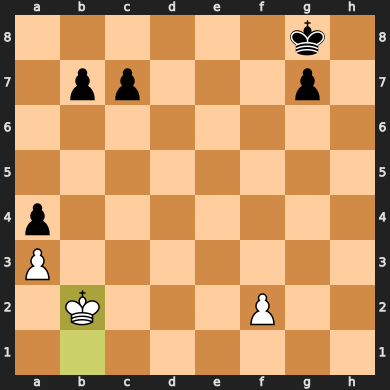



-g8h7




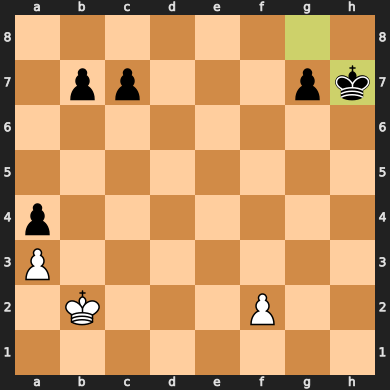



1/1 [==============================] - 0s 29ms/step
-b2b1




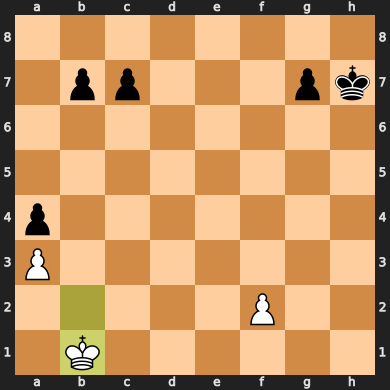



-h7g8




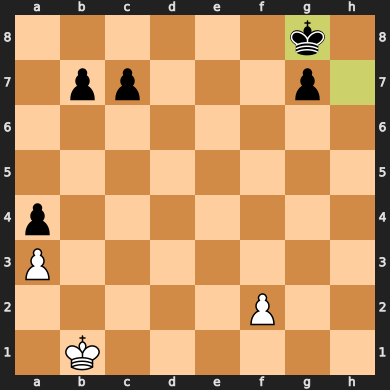



Final situation



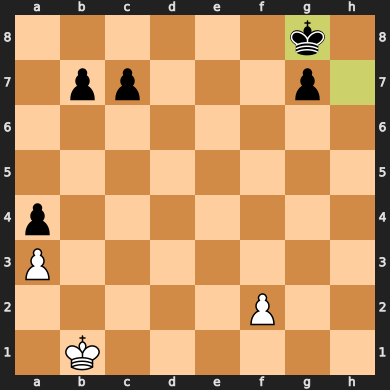



1/2-1/2
Cause of termination: Fivefold repetitions
# of moves: 76


In [16]:
infrastructure = Infrastructure()

state = ChessState('ai', 2, 'minmax', 1)

print('Start situation\n')
state.show()
print('Sequence of moves:\n')

while not(state.final()):
  action = state.nextAction()
  infrastructure.main(state, action)
  state.show()

print('Final situation\n')
state.show()
state.result()

Start situation



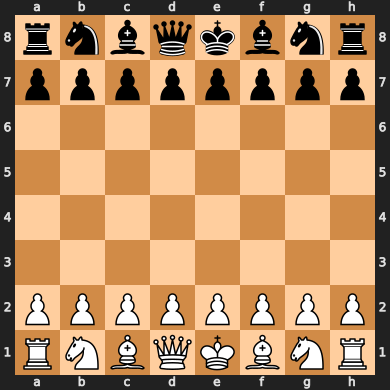



Sequence of moves:

-g1f3




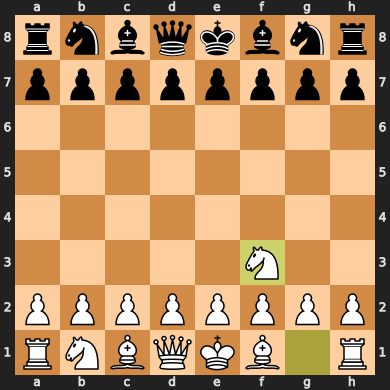



1/1 [==============================] - 0s 19ms/step
-h7h5




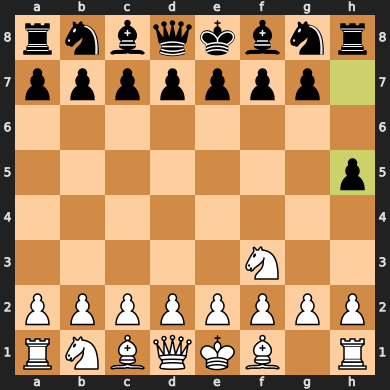



-b1c3




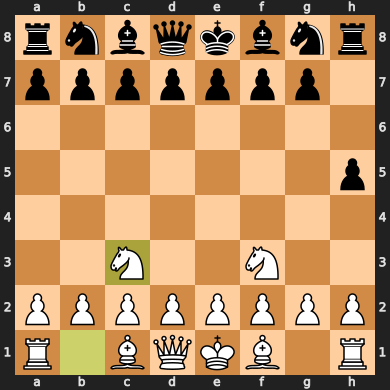



1/1 [==============================] - 0s 19ms/step
-g8f6




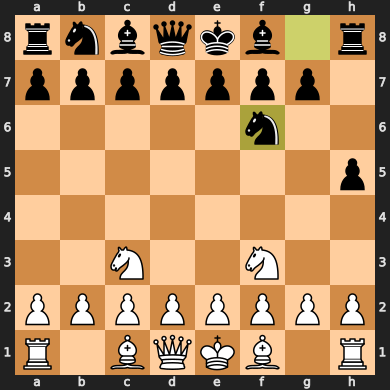



-d2d4




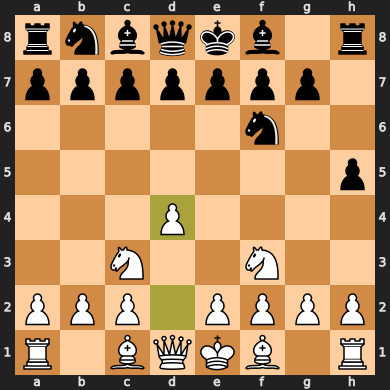



1/1 [==============================] - 0s 25ms/step
-b8c6




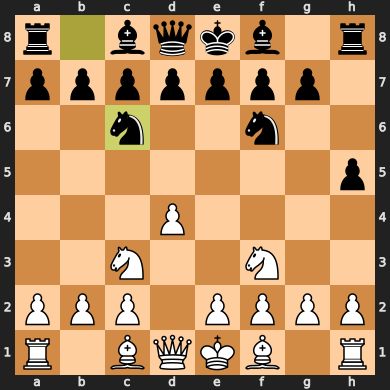



-e2e4




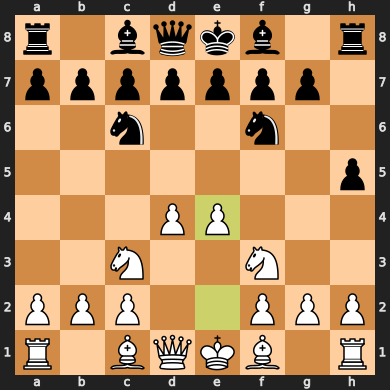



1/1 [==============================] - 0s 19ms/step
-d7d5




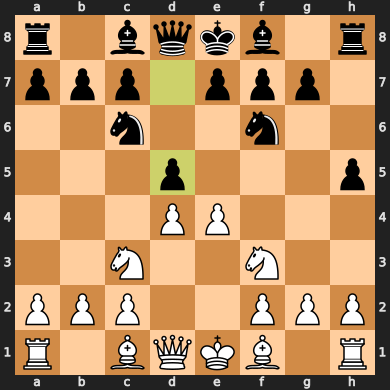



-c3d5




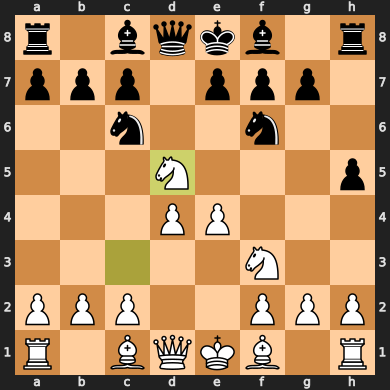



1/1 [==============================] - 0s 20ms/step
-d8d6




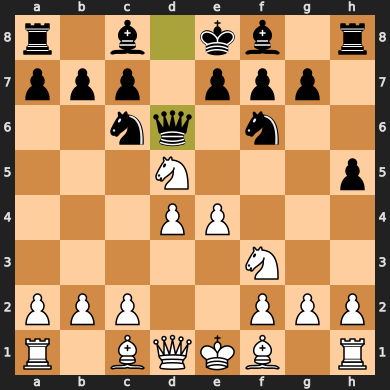



-d5f6




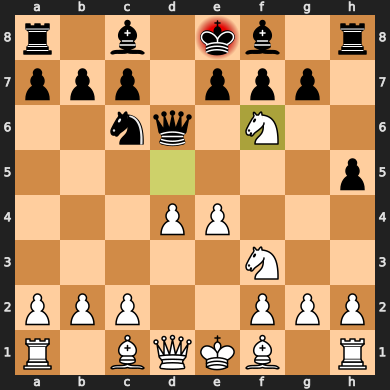



1/1 [==============================] - 0s 24ms/step
-d6f6




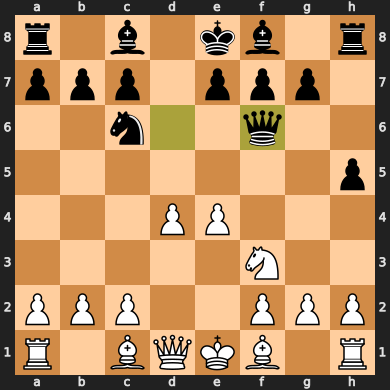



-c1f4




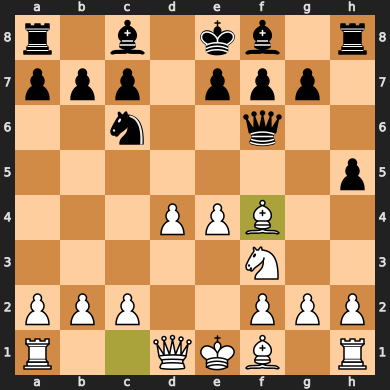



1/1 [==============================] - 0s 20ms/step
-c6d4




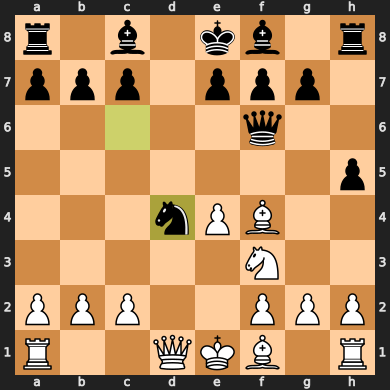



-d1d4




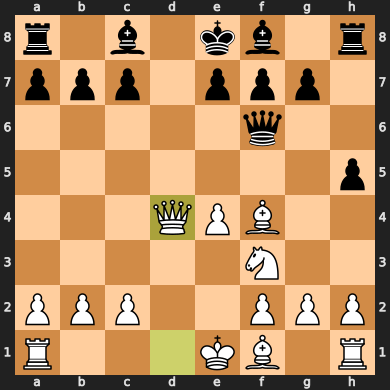



1/1 [==============================] - 0s 21ms/step
-f6f4




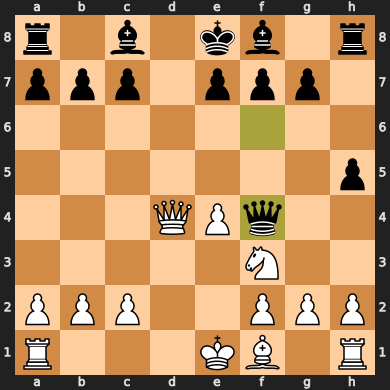



-f1b5




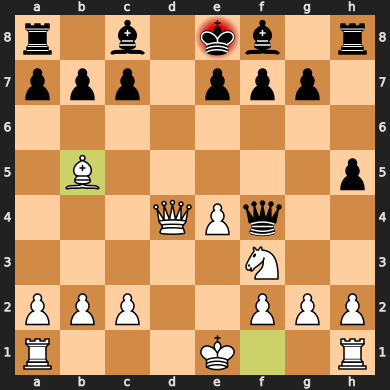



1/1 [==============================] - 0s 20ms/step
-c8d7




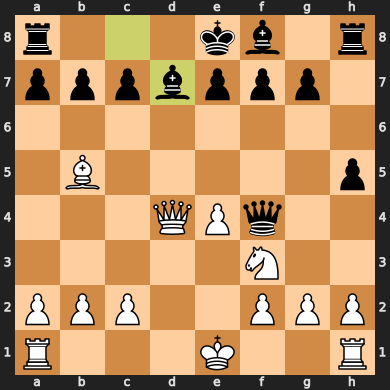



-d4d7




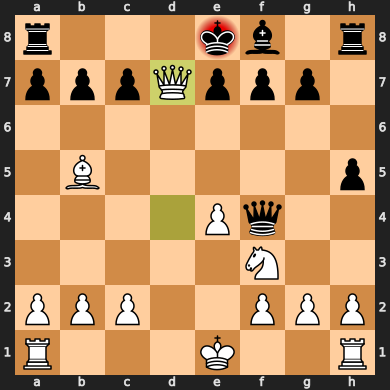



Final situation



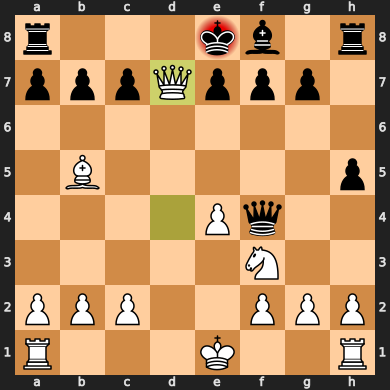



1-0
Cause of termination: Checkmate
# of moves: 19


In [17]:
infrastructure = Infrastructure()

state = ChessState('minmax', 1, 'ai', 2)

print('Start situation\n')
state.show()
print('Sequence of moves:\n')

while not(state.final()):
  action = state.nextAction()
  infrastructure.main(state, action)
  state.show()

print('Final situation\n')
state.show()
state.result()

### **Predictive L MinMaxL vs Speed Up MinMaxL**

Start situation



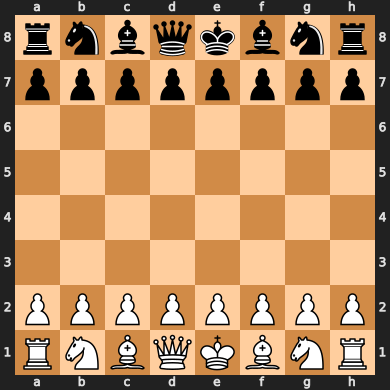



Sequence of moves:

1/1 [==============================] - 0s 21ms/step
-g1f3




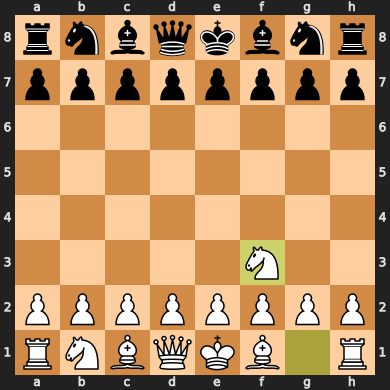



-g8f6




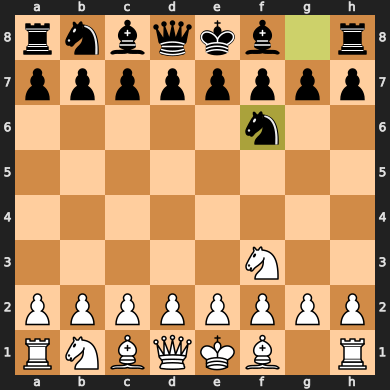



1/1 [==============================] - 0s 18ms/step
-b1c3




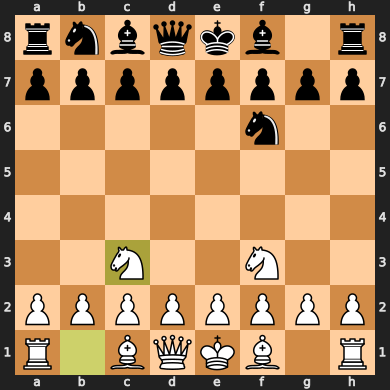



-b8c6




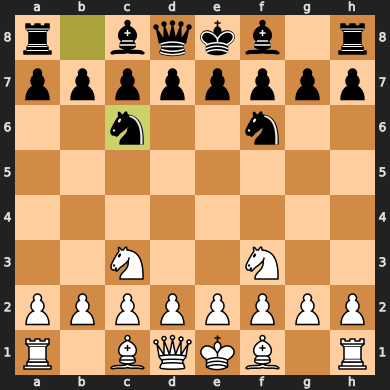



1/1 [==============================] - 0s 30ms/step
-e2e4




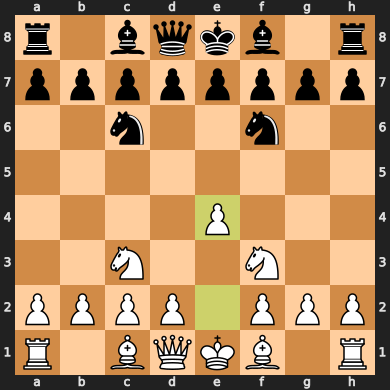



-d7d5




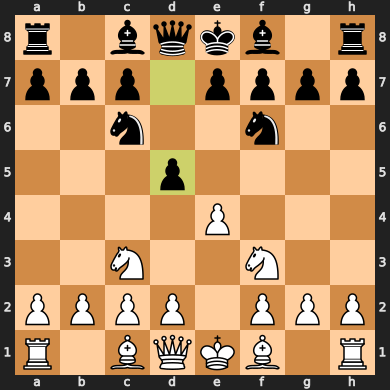



1/1 [==============================] - 0s 28ms/step
-d2d4




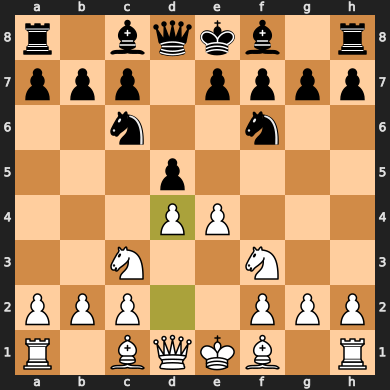



-d5e4




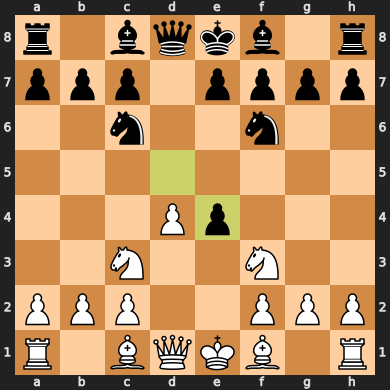



1/1 [==============================] - 0s 27ms/step
-c3e4




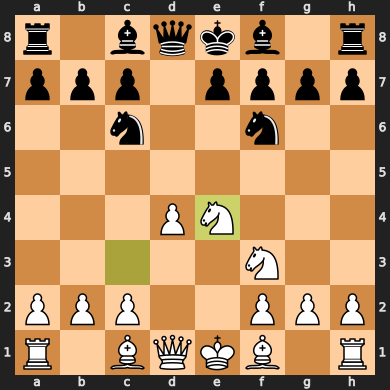



-f6e4




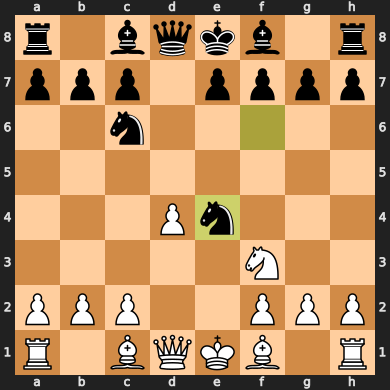



1/1 [==============================] - 0s 18ms/step
-h1g1




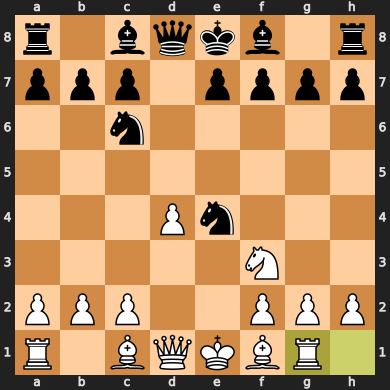



-d8d5




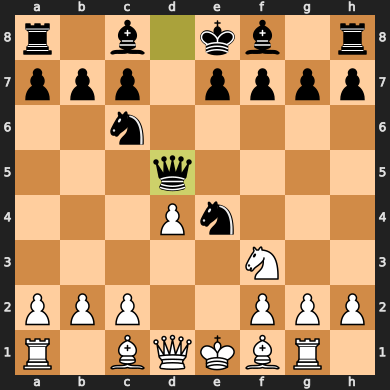



1/1 [==============================] - 0s 18ms/step
-d1d3




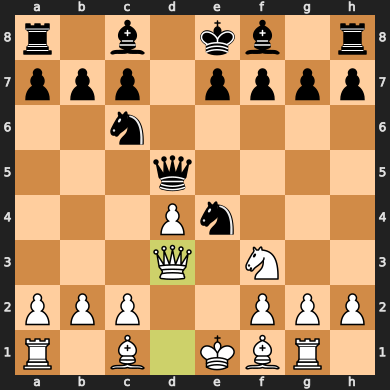



-d5a5




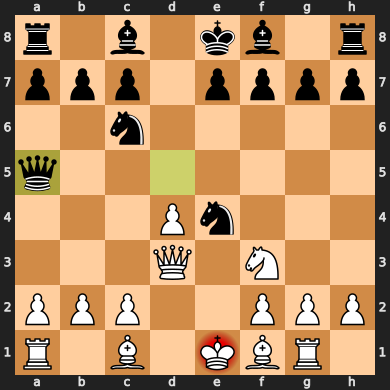



1/1 [==============================] - 0s 20ms/step
-e1e2




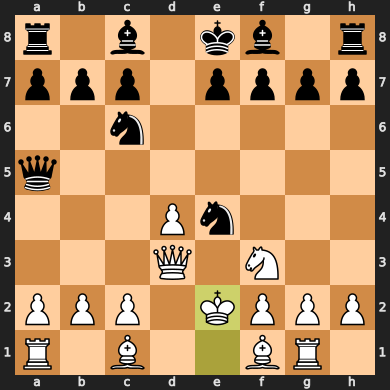



-e4d6




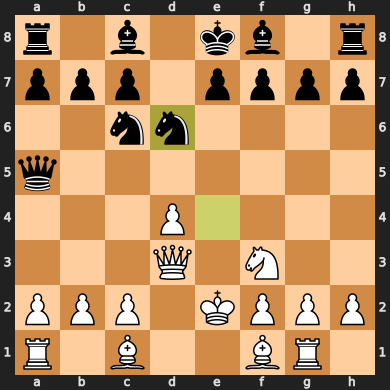



1/1 [==============================] - 0s 25ms/step
-b2b4




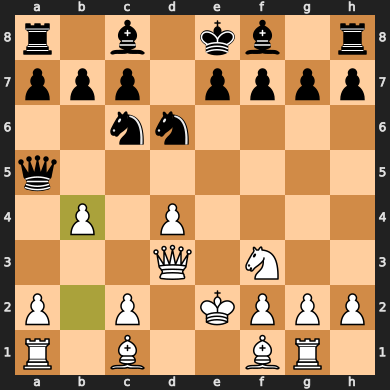



-a5b4




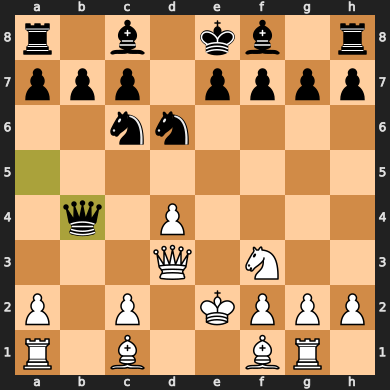



1/1 [==============================] - 0s 20ms/step
-h2h4




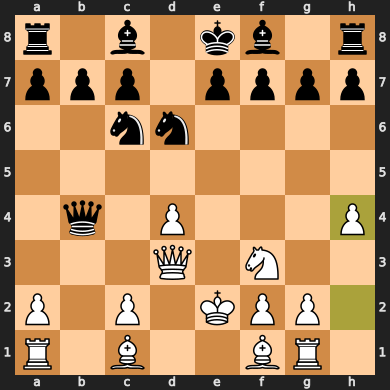



-c8e6




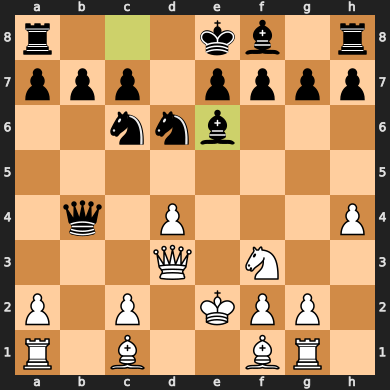



1/1 [==============================] - 0s 21ms/step
-c1e3




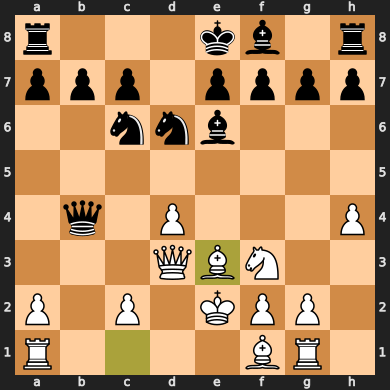



-e8d7




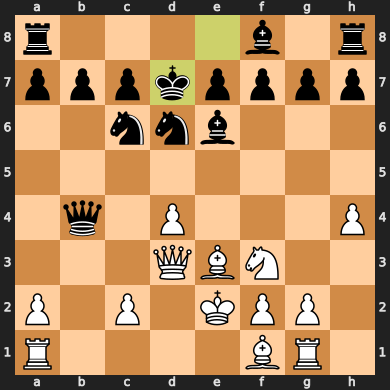



1/1 [==============================] - 0s 32ms/step
-f3e5




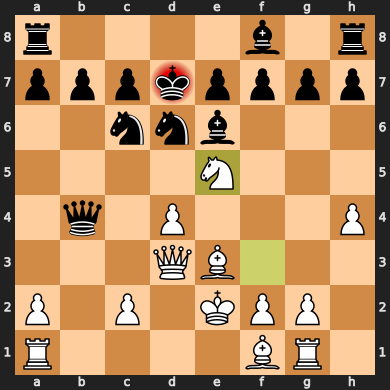



-c6e5




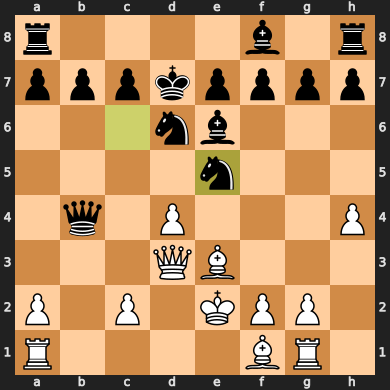



1/1 [==============================] - 0s 22ms/step
-d4e5




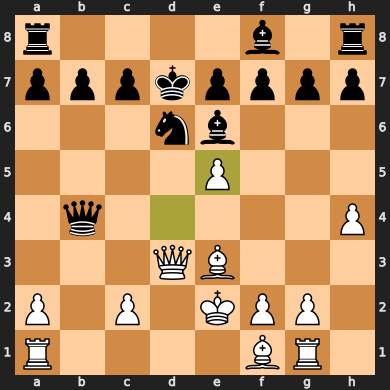



-b4g4




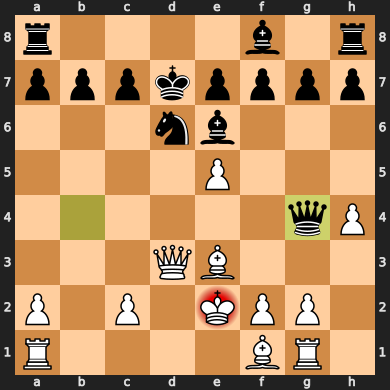



1/1 [==============================] - 0s 18ms/step
-f2f3




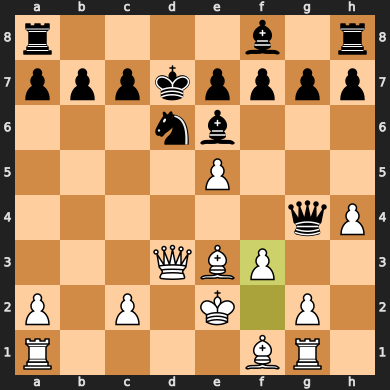



-g4h4




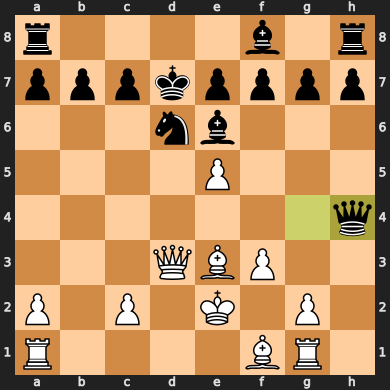



1/1 [==============================] - 0s 26ms/step
-e5d6




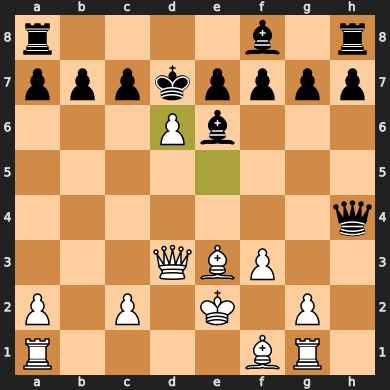



-e7d6




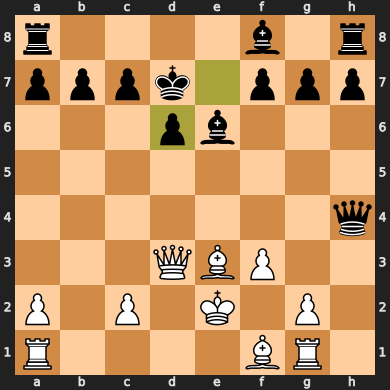



1/1 [==============================] - 0s 21ms/step
-d3b5




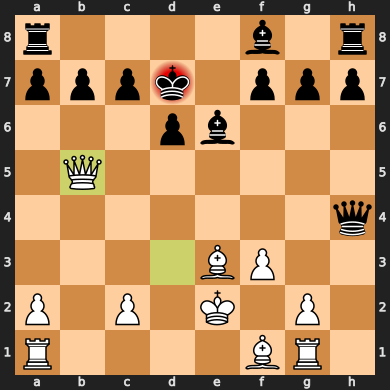



-d7e7




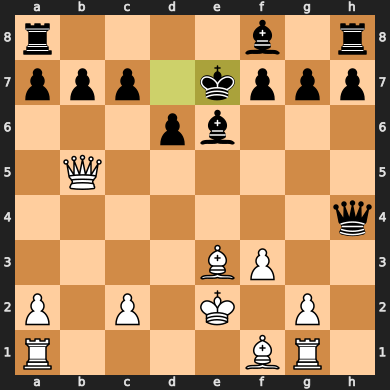



1/1 [==============================] - 0s 19ms/step
-g2g4




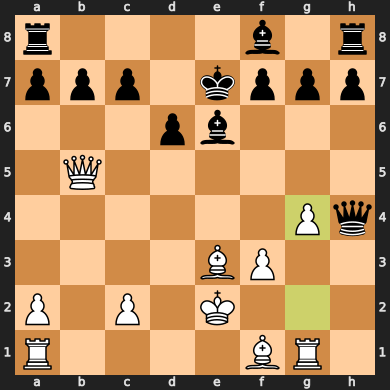



-h4f6




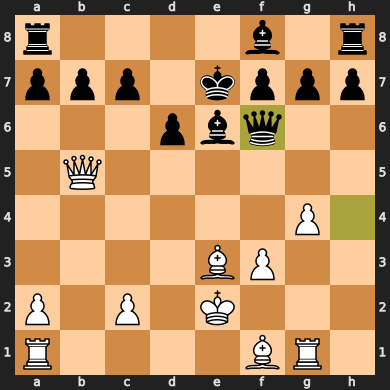



1/1 [==============================] - 0s 24ms/step
-f1g2




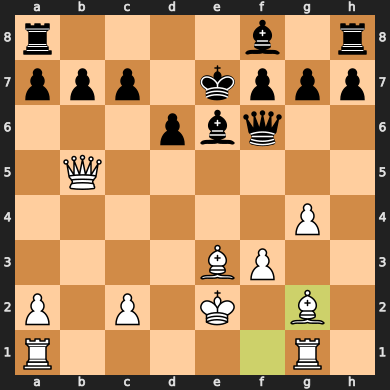



-f6c3




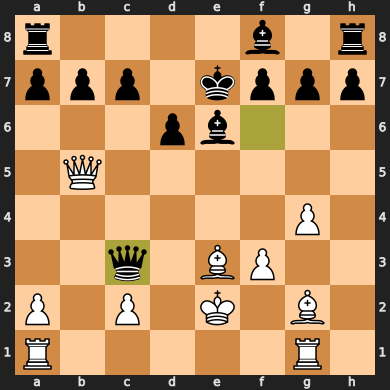



1/1 [==============================] - 0s 27ms/step
-g1h1




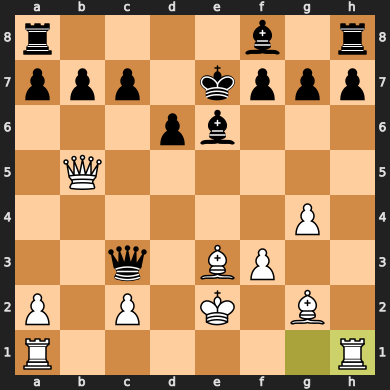



-c3c2




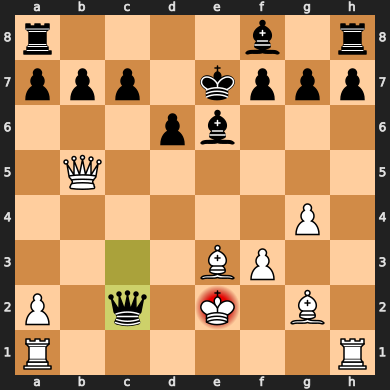



1/1 [==============================] - 0s 24ms/step
-e3d2




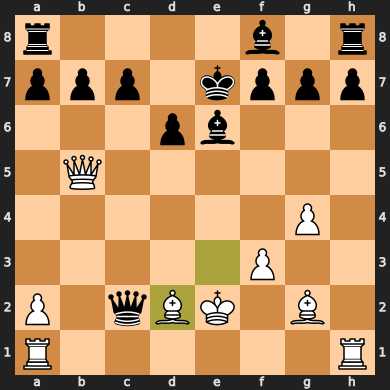



-h7h6




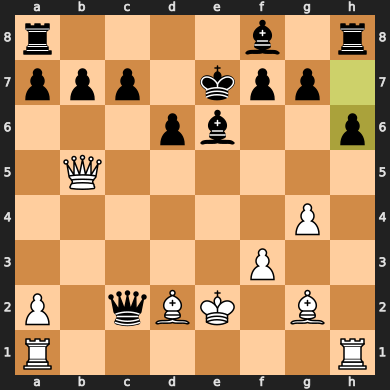



1/1 [==============================] - 0s 27ms/step
-f3f4




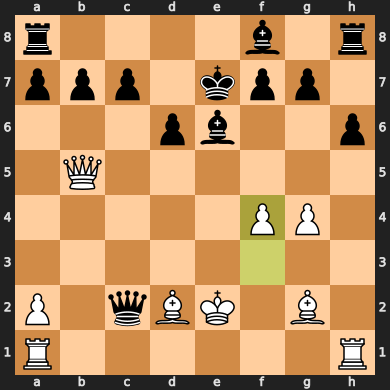



-e6g4




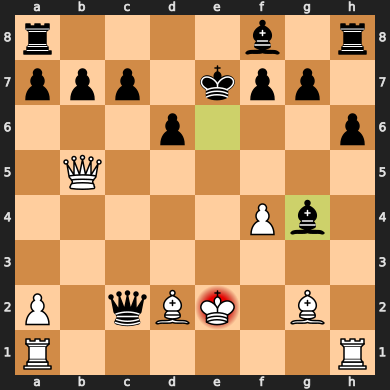



1/1 [==============================] - 0s 32ms/step
-e2f2




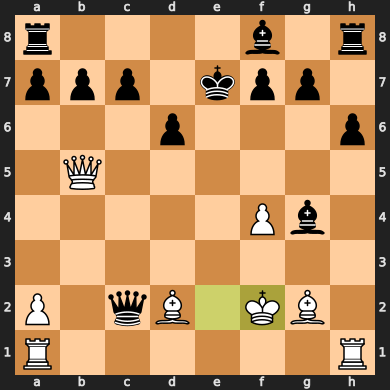



-c2d2




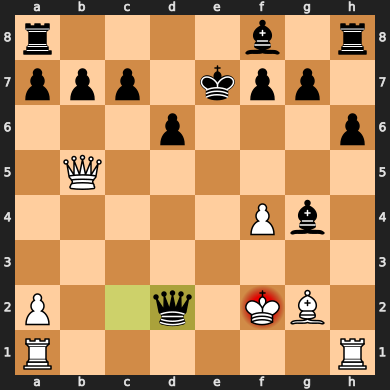



1/1 [==============================] - 0s 22ms/step
-f2g3




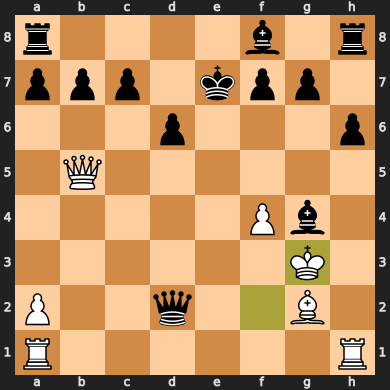



-g4e6




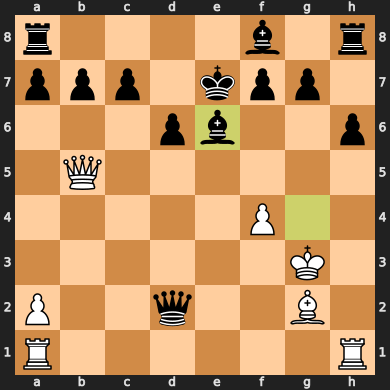



1/1 [==============================] - 0s 25ms/step
-g2e4




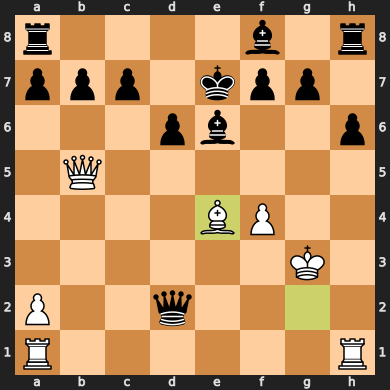



-d2c3




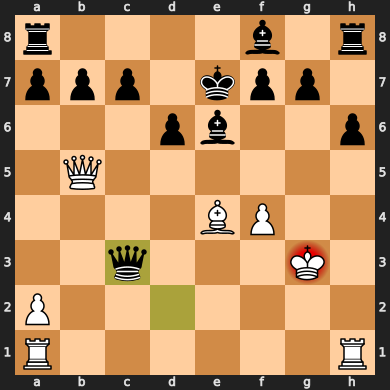



1/1 [==============================] - 0s 31ms/step
-e4f3




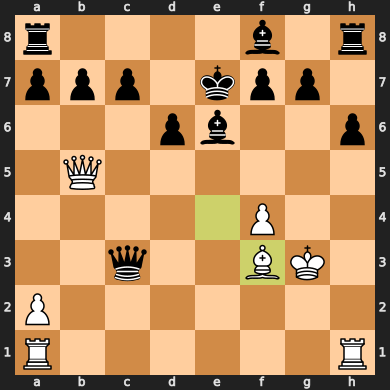



-a8d8




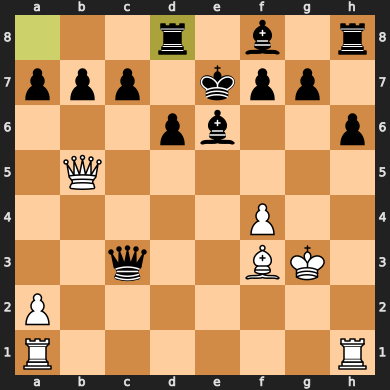



1/1 [==============================] - 0s 25ms/step
-a1b1




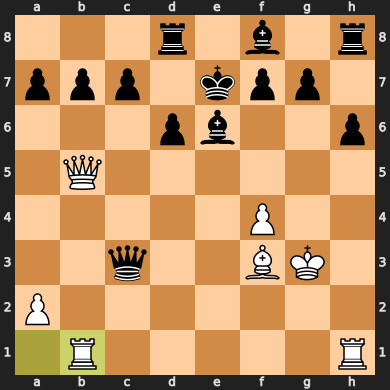



-c3d4




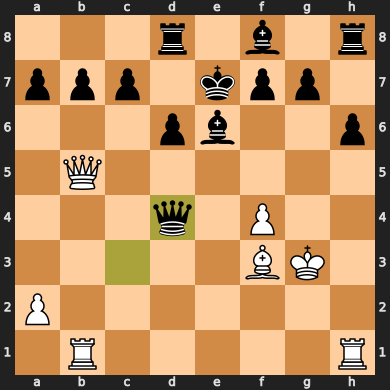



1/1 [==============================] - 0s 28ms/step
-b1c1




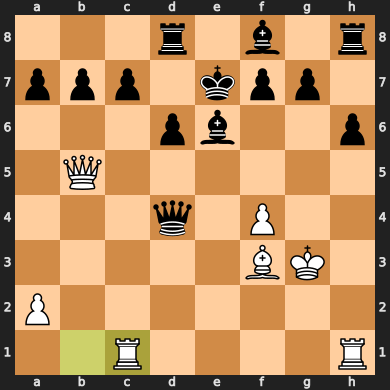



-d6d5




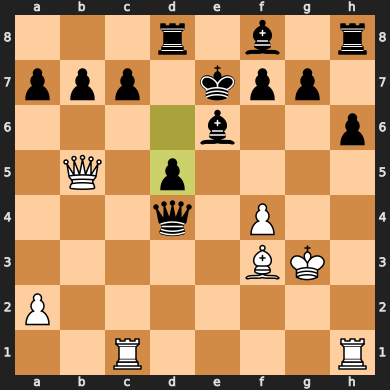



1/1 [==============================] - 0s 26ms/step
-c1c7




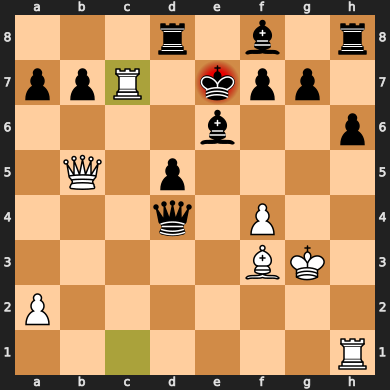



-e7f6




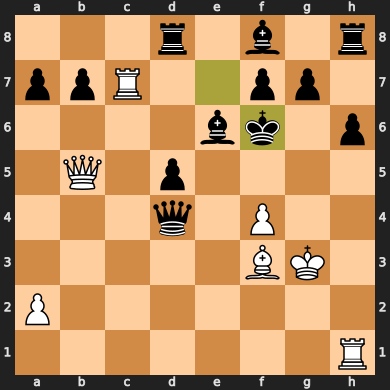



1/1 [==============================] - 0s 26ms/step
-c7c2




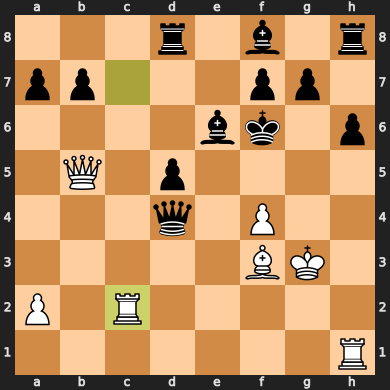



-f8d6




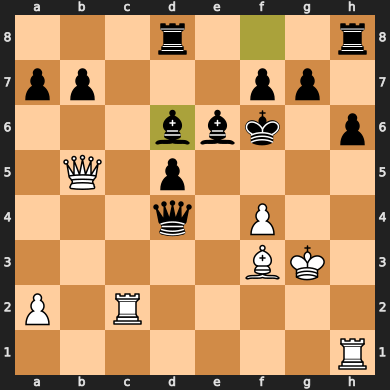



1/1 [==============================] - 0s 34ms/step
-a2a4




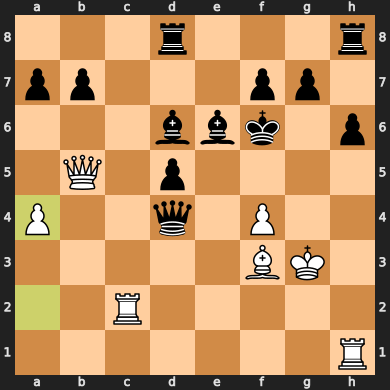



-d6f4




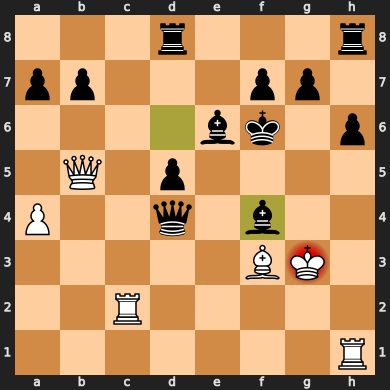



1/1 [==============================] - 0s 29ms/step
-g3g2




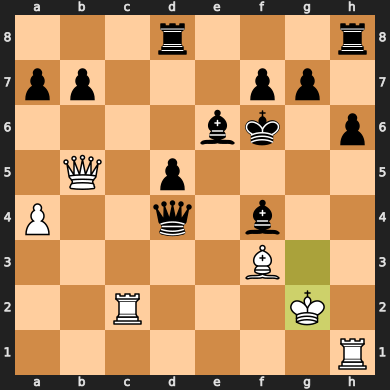



-f6e7




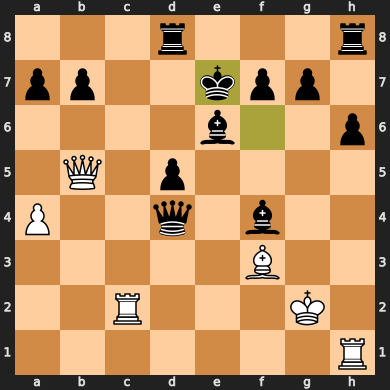



1/1 [==============================] - 0s 27ms/step
-b5b7




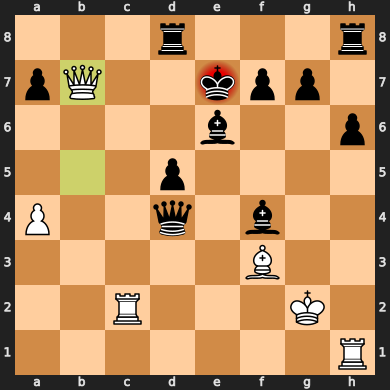



-e7f6




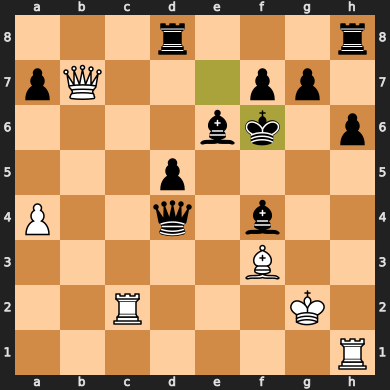



1/1 [==============================] - 0s 25ms/step
-f3d5




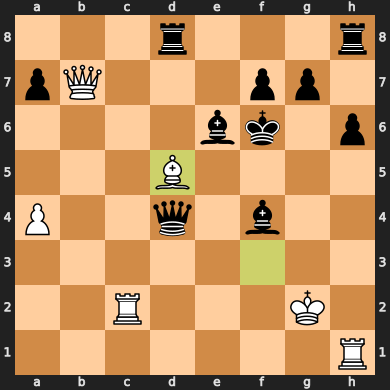



-e6f5




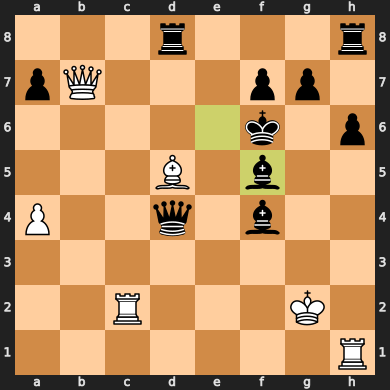



1/1 [==============================] - 0s 25ms/step
-b7f7




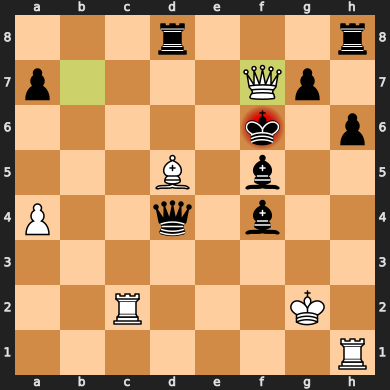



-f6g5




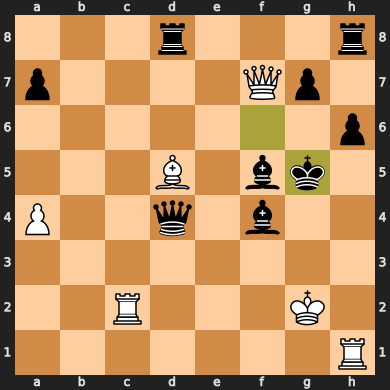



1/1 [==============================] - 0s 28ms/step
-f7h5




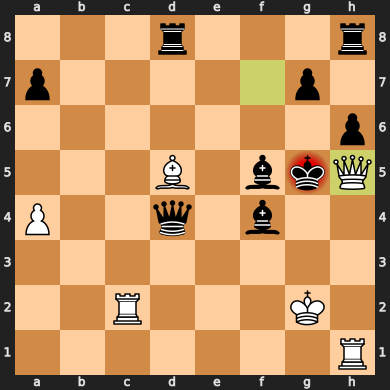



-g5f6




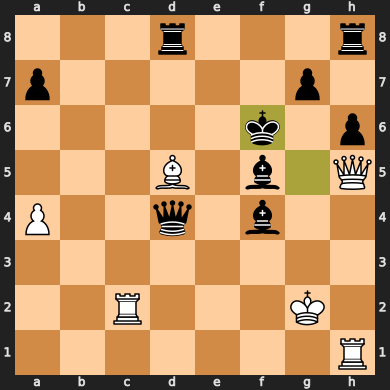



1/1 [==============================] - 0s 26ms/step
-h5h4




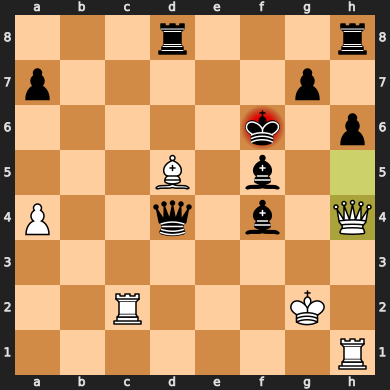



-g7g5




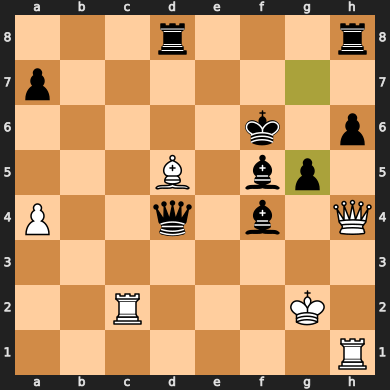



1/1 [==============================] - 0s 50ms/step
-c2c6




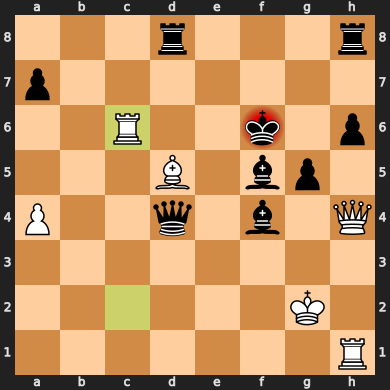



-f6g7




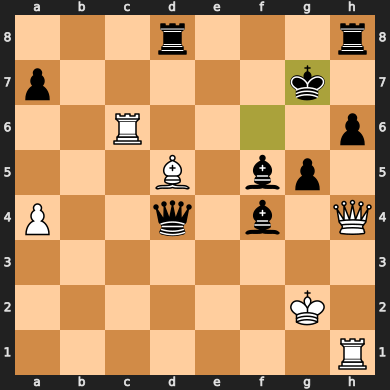



1/1 [==============================] - 0s 44ms/step
-c6c7




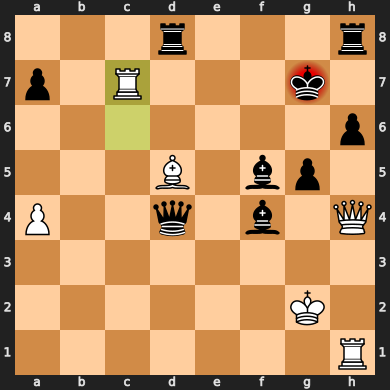



-d8d7




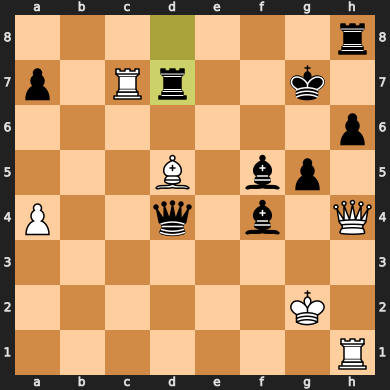



1/1 [==============================] - 0s 25ms/step
-c7d7




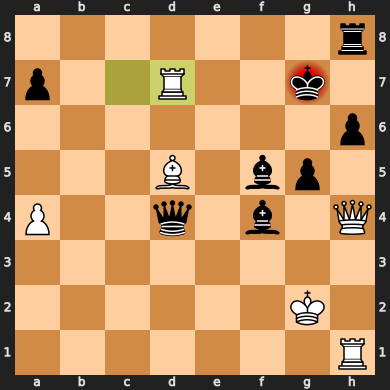



-f5d7




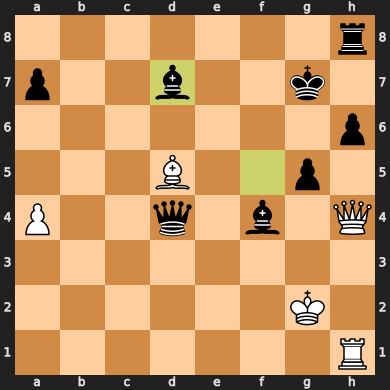



1/1 [==============================] - 0s 42ms/step
-h4e1




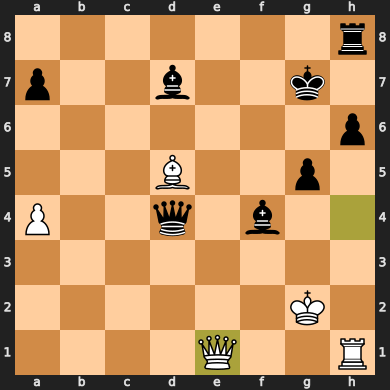



-d4d5




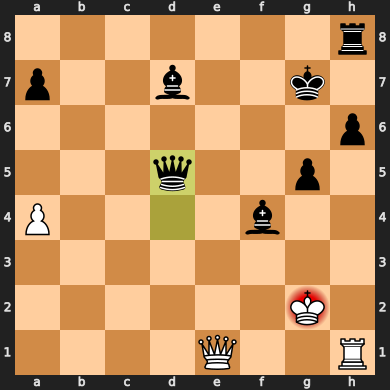



1/1 [==============================] - 0s 27ms/step
-g2f2




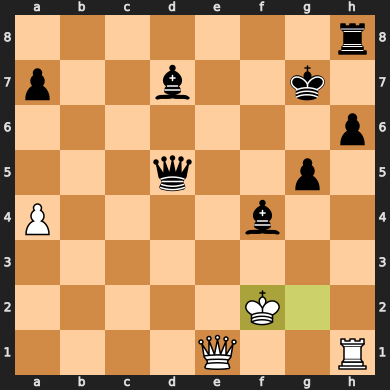



-h8c8




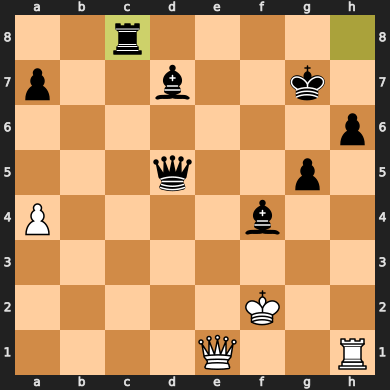



1/1 [==============================] - 0s 26ms/step
-e1e7




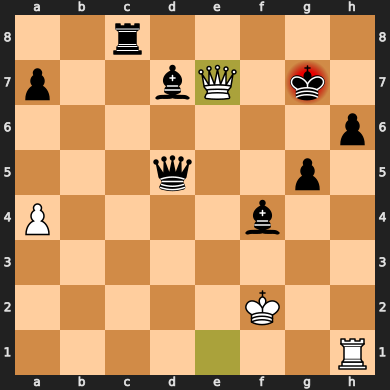



-g7g8




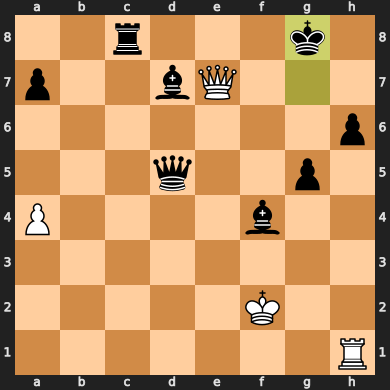



1/1 [==============================] - 0s 34ms/step
-h1h6




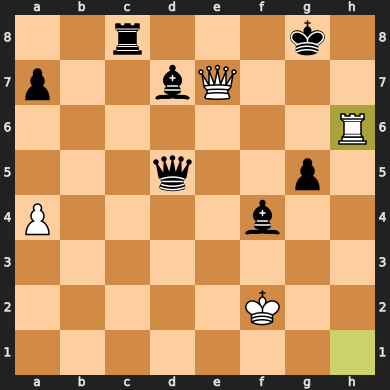



-c8c2




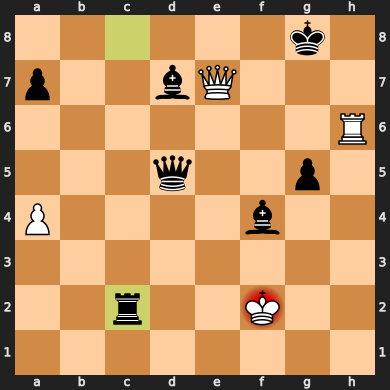



1/1 [==============================] - 0s 33ms/step
-f2f1




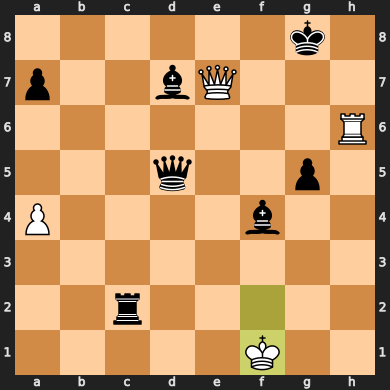



-c2c1




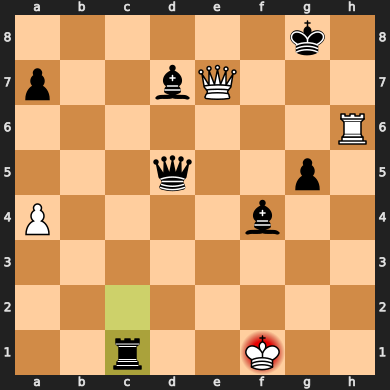



1/1 [==============================] - 0s 26ms/step
-f1e2




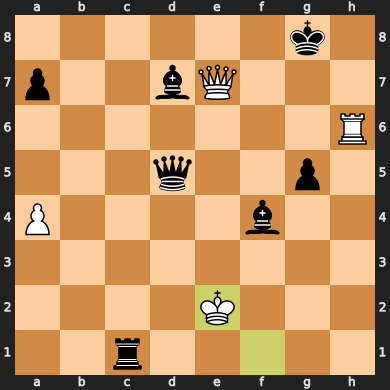



-c1c2




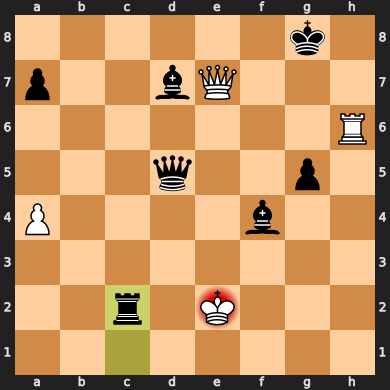



1/1 [==============================] - 0s 27ms/step
-e2f1




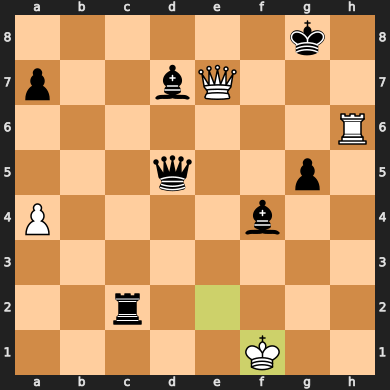



-c2c1




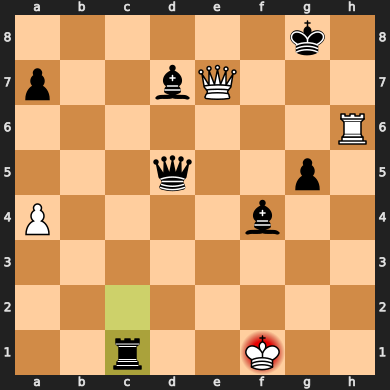



1/1 [==============================] - 0s 58ms/step
-f1e2




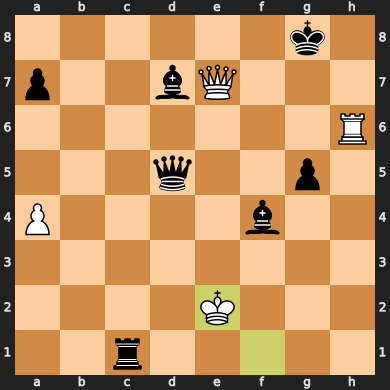



-c1c2




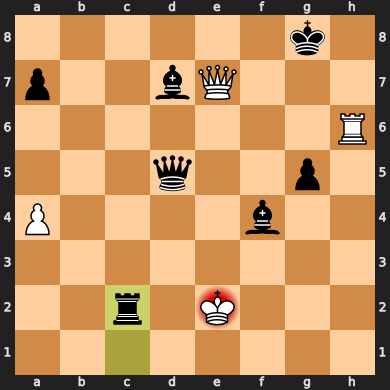



1/1 [==============================] - 0s 30ms/step
-e2f1




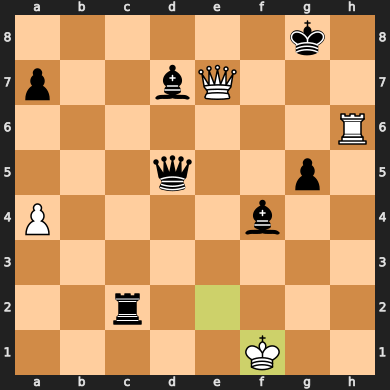



-c2c1




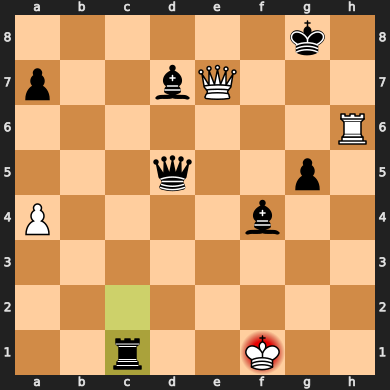



1/1 [==============================] - 0s 25ms/step
-f1e2




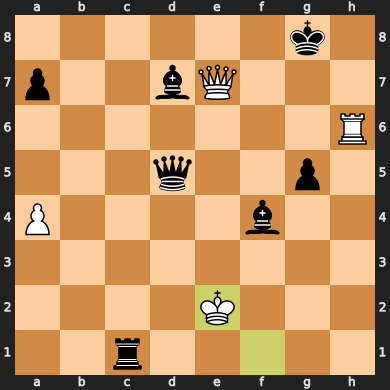



-c1c2




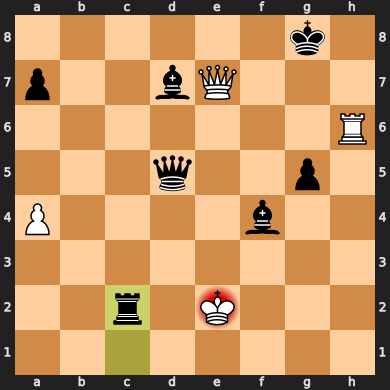



1/1 [==============================] - 0s 25ms/step
-e2f1




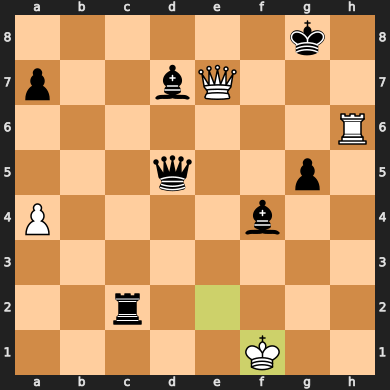



-c2c1




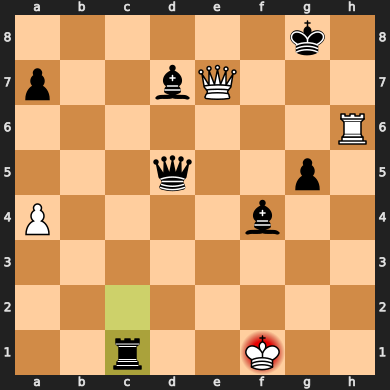



1/1 [==============================] - 0s 29ms/step
-f1e2




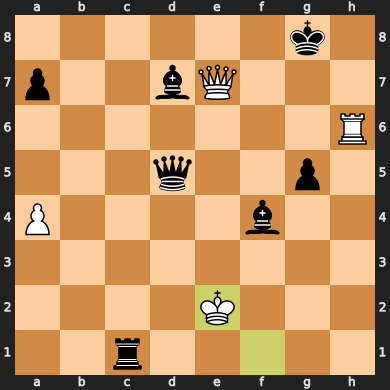



-c1c2




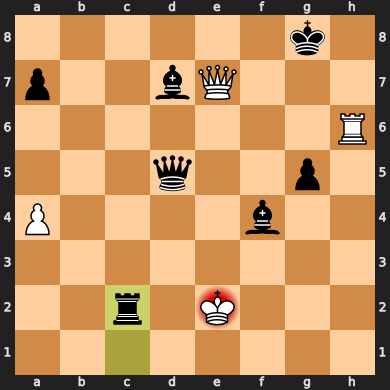



1/1 [==============================] - 0s 24ms/step
-e2e1




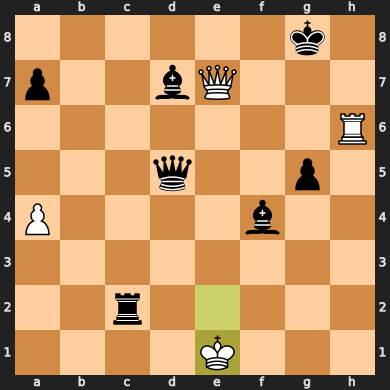



-f4g3




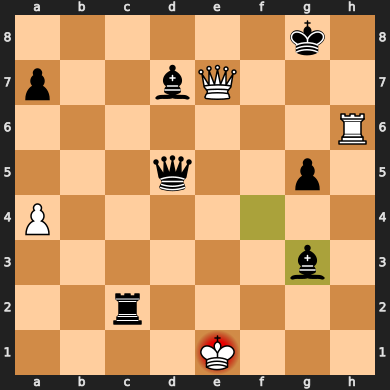



1/1 [==============================] - 0s 28ms/step
-e1f1




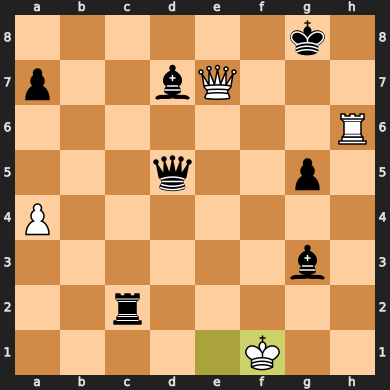



-d5g2




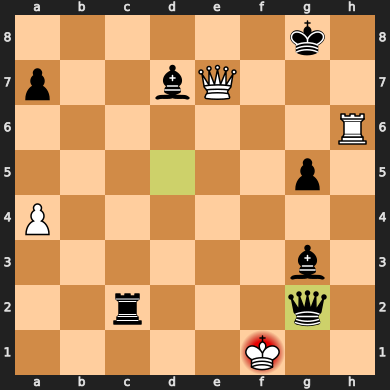



Final situation



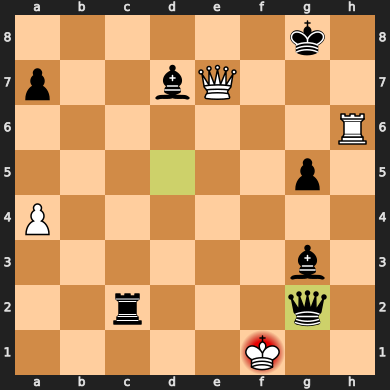



0-1
Cause of termination: Checkmate
# of moves: 106


In [26]:
infrastructure = Infrastructure()

state = ChessState('advancedAi', 2, 'minmax', 2)

print('Start situation\n')
state.show()
print('Sequence of moves:\n')

while not(state.final()):
  action = state.nextAction()
  infrastructure.main(state, action)
  state.show()

print('Final situation\n')
state.show()
state.result()

### **Predictive L MinMaxL vs Speed up MinMaxL/2**

Start situation



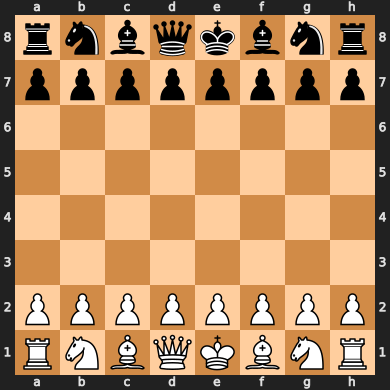



Sequence of moves:

1/1 [==============================] - 0s 19ms/step
-g1f3




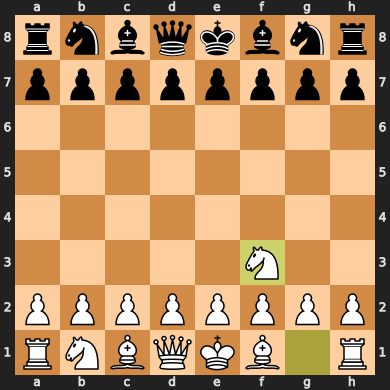



-g8f6




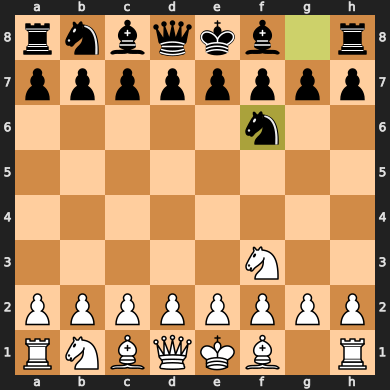



1/1 [==============================] - 0s 18ms/step
-b1c3




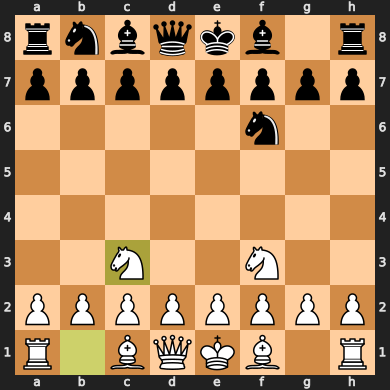



-b8c6




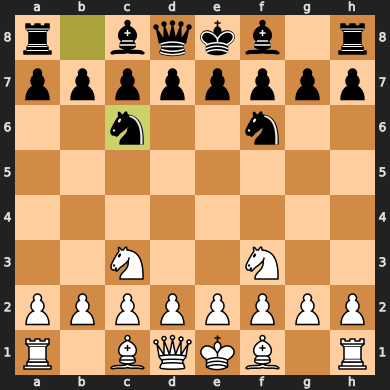



1/1 [==============================] - 0s 24ms/step
-e2e4




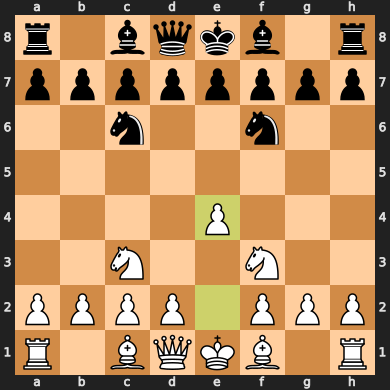



-d7d5




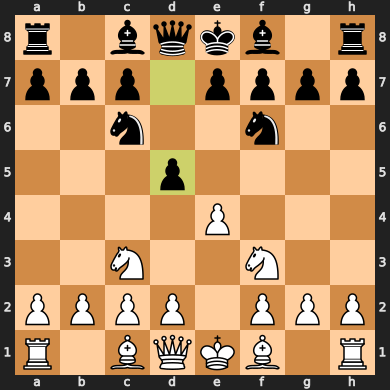



1/1 [==============================] - 0s 17ms/step
-d2d4




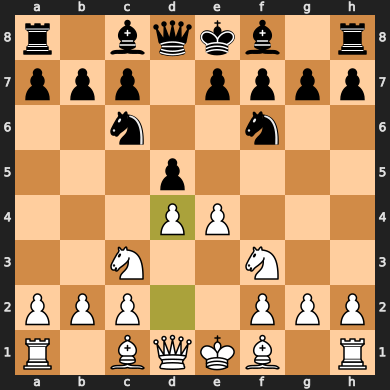



-e7e5




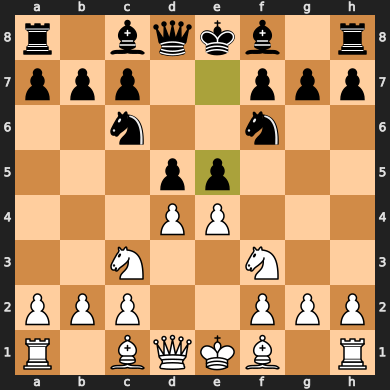



1/1 [==============================] - 0s 18ms/step
-d4e5




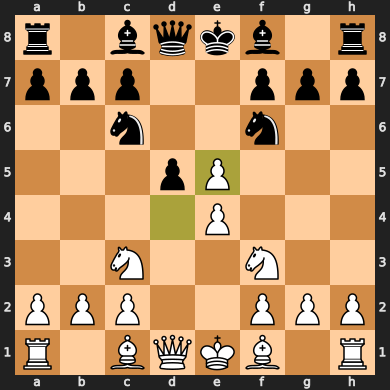



-f6e4




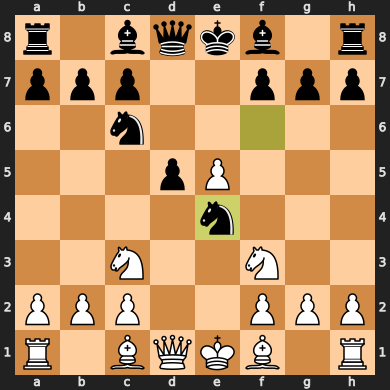



1/1 [==============================] - 0s 17ms/step
-c3e4




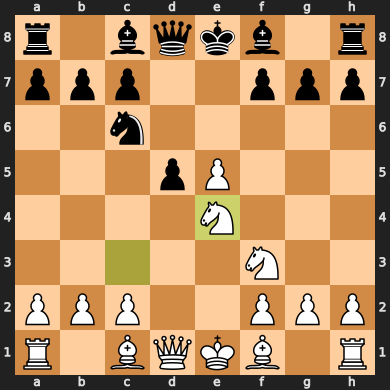



-d5e4




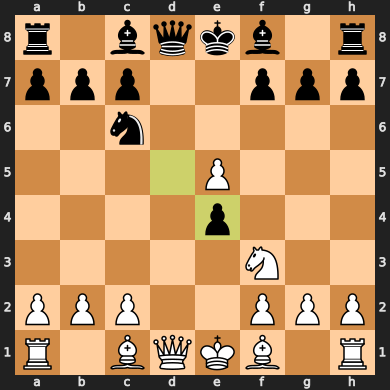



1/1 [==============================] - 0s 17ms/step
-d1d8




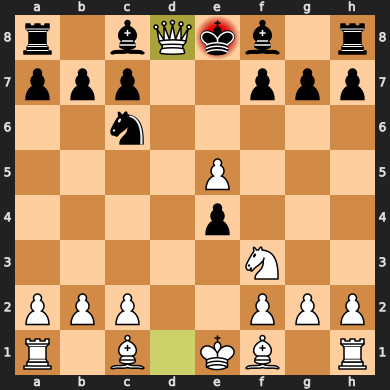



-e8d8




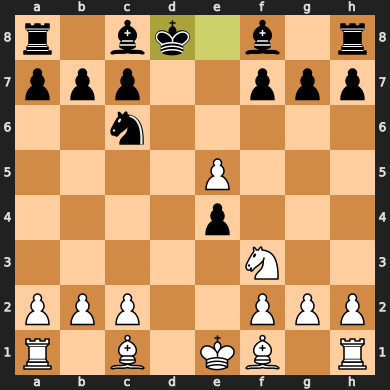



1/1 [==============================] - 0s 19ms/step
-c1g5




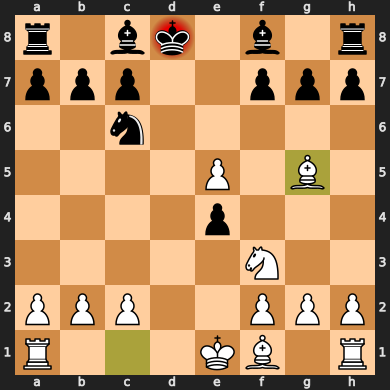



-f8e7




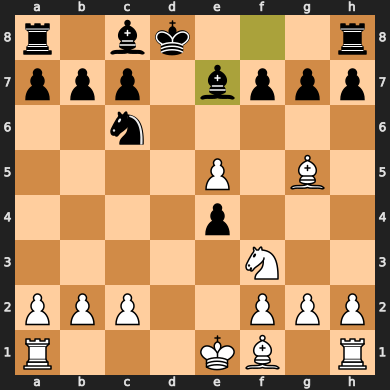



1/1 [==============================] - 0s 17ms/step
-e1c1




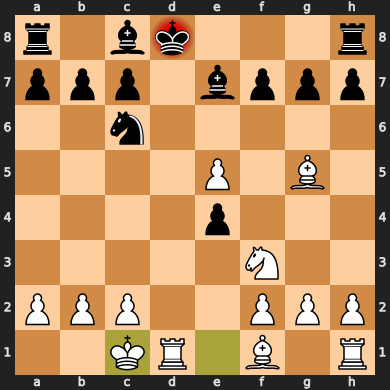



-c6d4




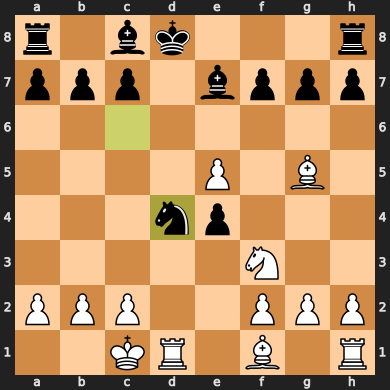



1/1 [==============================] - 0s 19ms/step
-d1d4




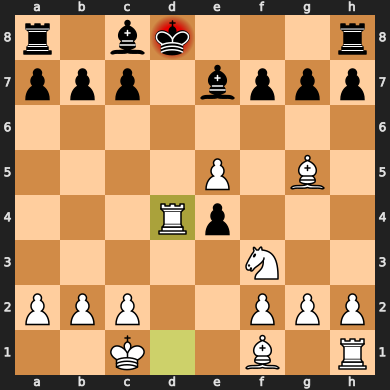



-c8d7




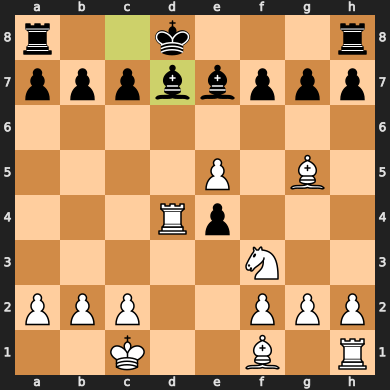



1/1 [==============================] - 0s 17ms/step
-g5e7




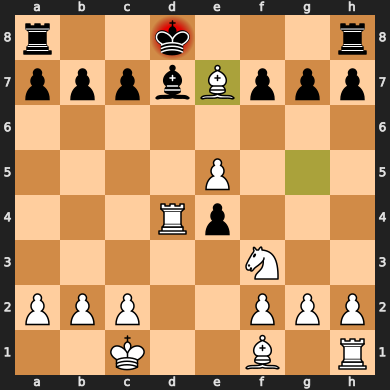



-d8e7




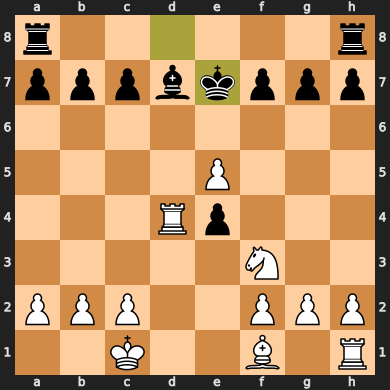



1/1 [==============================] - 0s 17ms/step
-d4e4




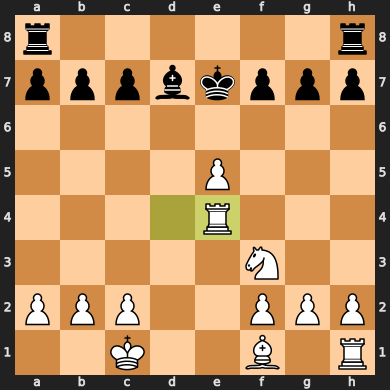



-d7e6




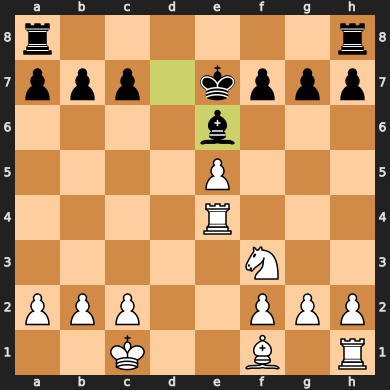



1/1 [==============================] - 0s 18ms/step
-f1d3




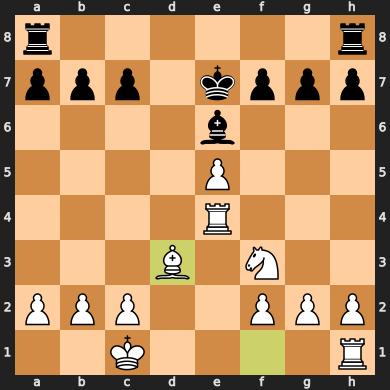



-a8d8




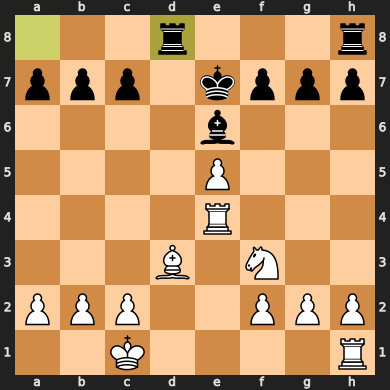



1/1 [==============================] - 0s 18ms/step
-d3b5




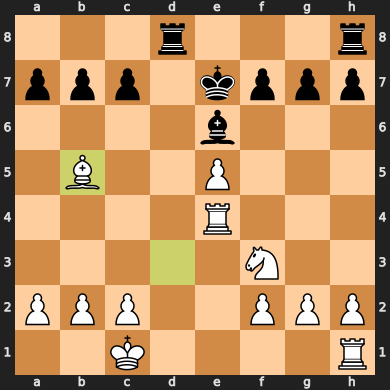



-e6c4




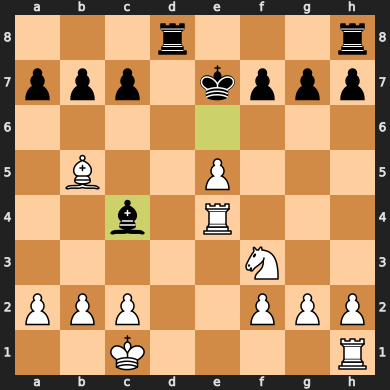



1/1 [==============================] - 0s 22ms/step
-b5c4




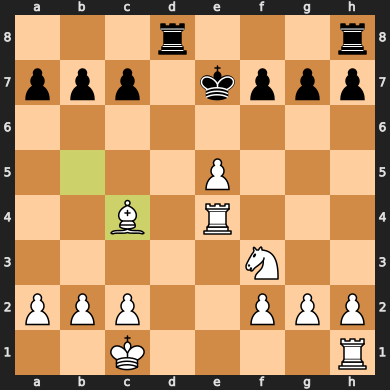



-d8d6




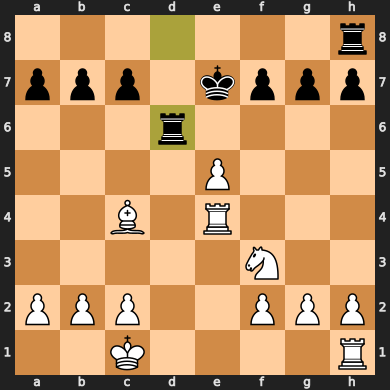



1/1 [==============================] - 0s 23ms/step
-e5d6




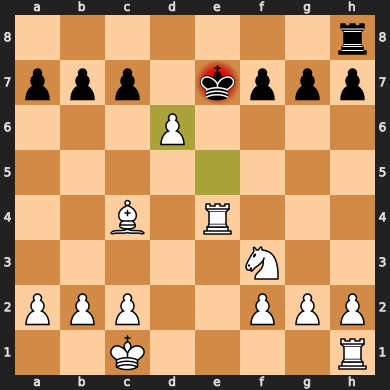



-e7d6




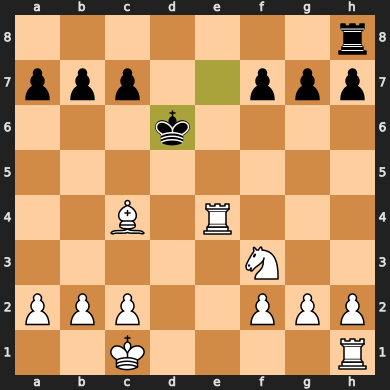



1/1 [==============================] - 0s 20ms/step
-h1d1




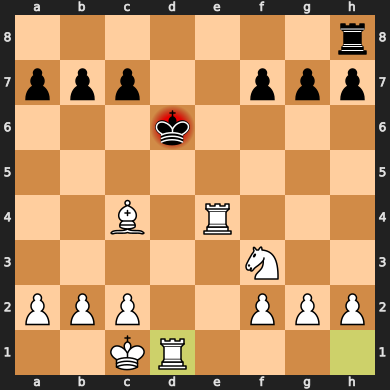



-d6c6




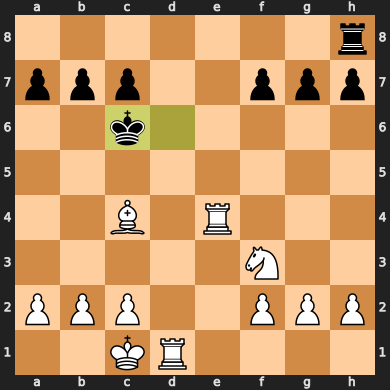



1/1 [==============================] - 0s 22ms/step
-c2c3




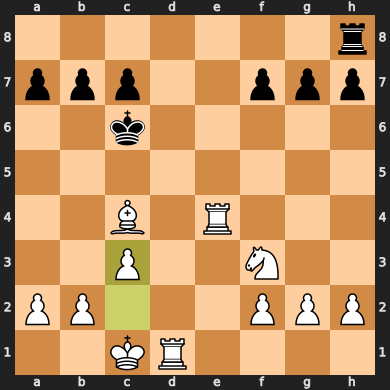



-h8d8




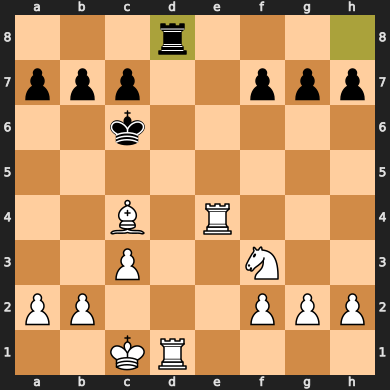



1/1 [==============================] - 0s 17ms/step
-d1d8




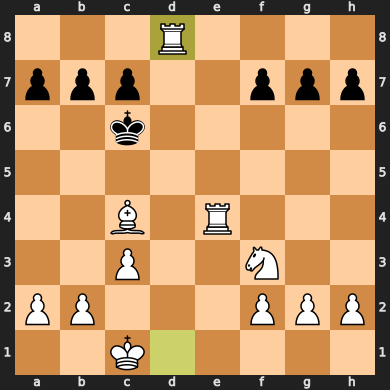



-c6b6




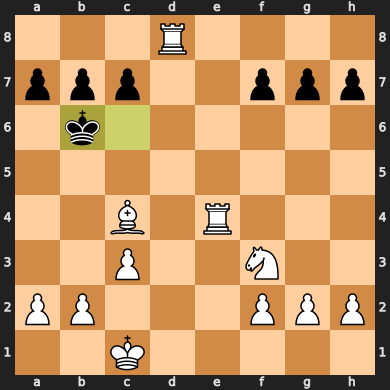



1/1 [==============================] - 0s 25ms/step
-f3g1




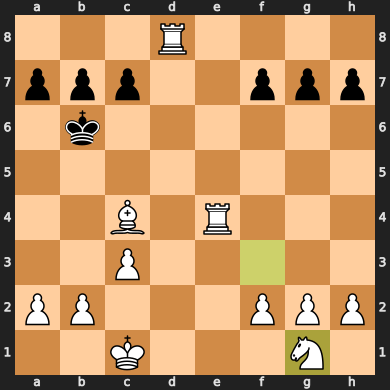



-b6c6




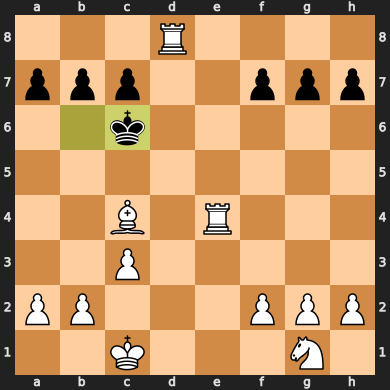



1/1 [==============================] - 0s 24ms/step
-c4f7




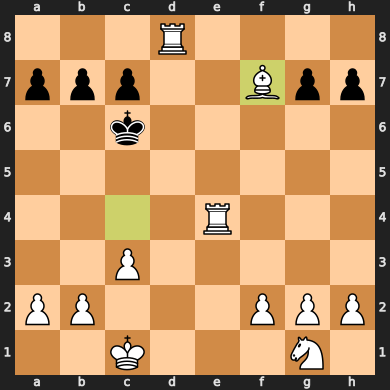



-c6b6




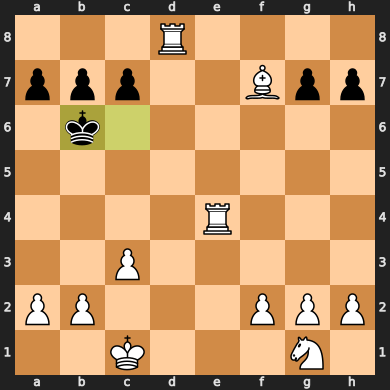



1/1 [==============================] - 0s 24ms/step
-c1c2




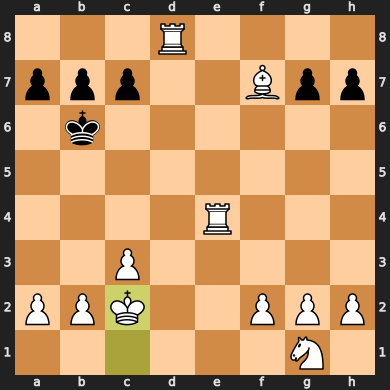



-b6c6




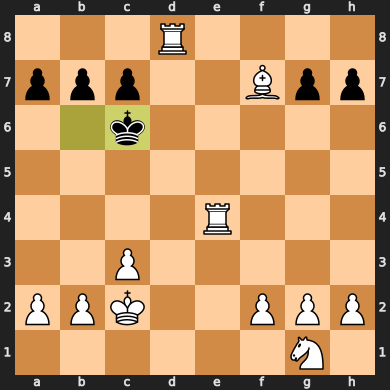



1/1 [==============================] - 0s 18ms/step
-e4e5




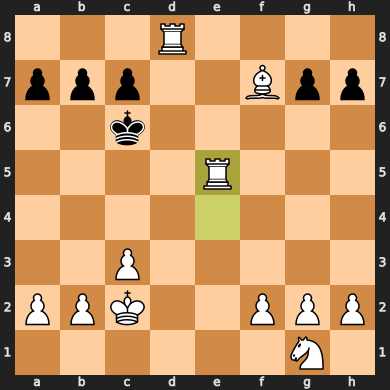



-c6b6




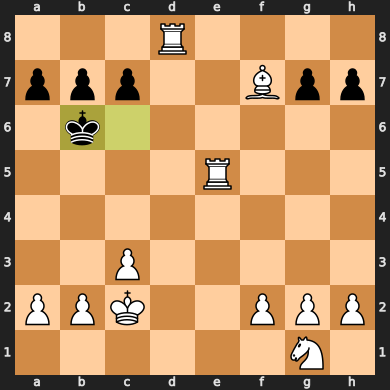



1/1 [==============================] - 0s 21ms/step
-f7c4




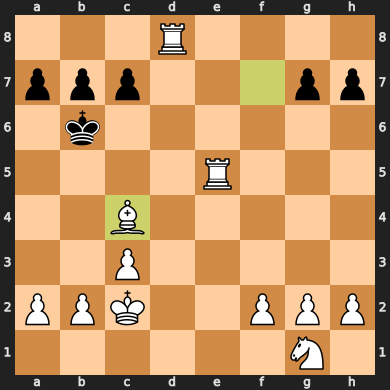



-c7c5




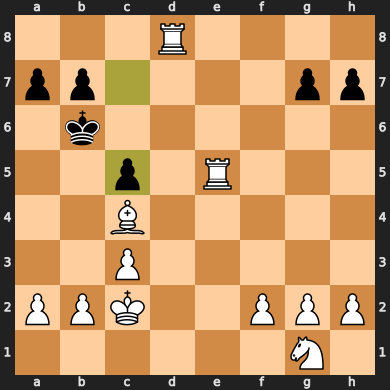



1/1 [==============================] - 0s 23ms/step
-d8d6




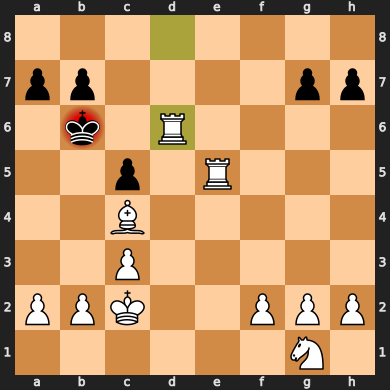



-b6c7




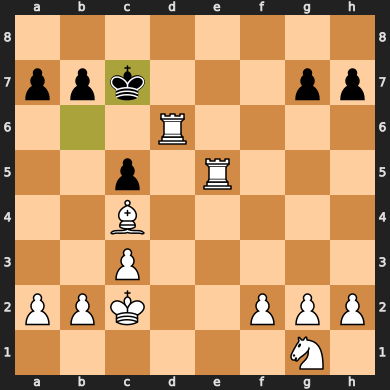



1/1 [==============================] - 0s 23ms/step
-d6d1




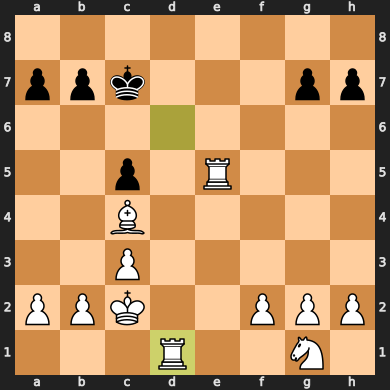



-c7b8




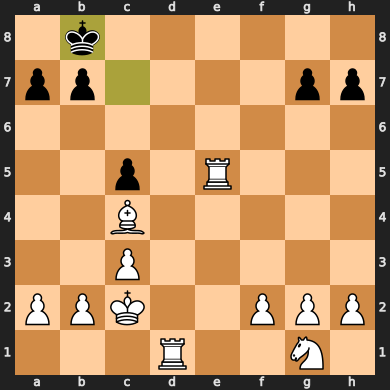



1/1 [==============================] - 0s 25ms/step
-e5e8




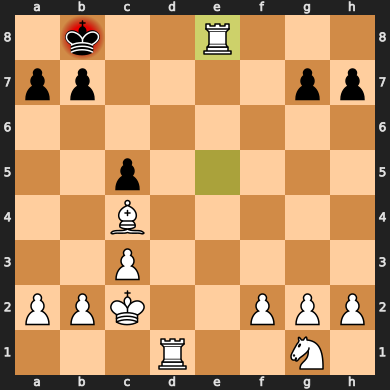



-b8c7




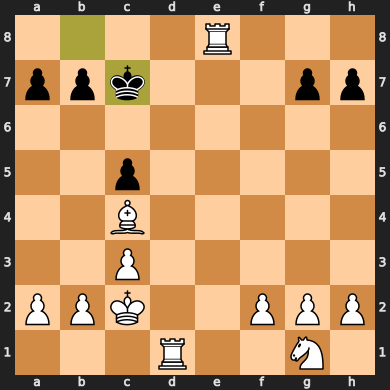



1/1 [==============================] - 0s 22ms/step
-h2h4




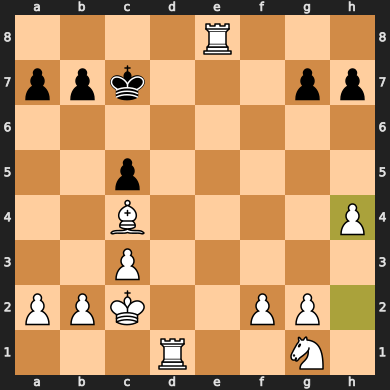



-h7h6




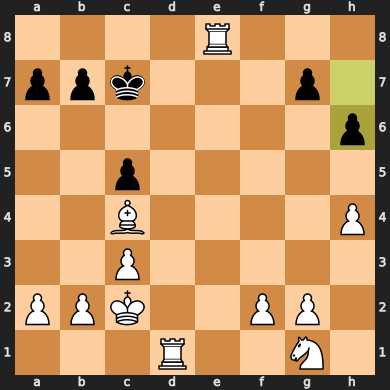



1/1 [==============================] - 0s 25ms/step
-e8d8




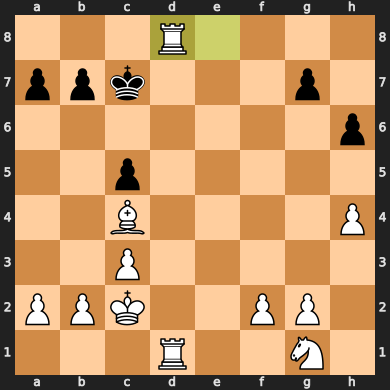



-a7a6




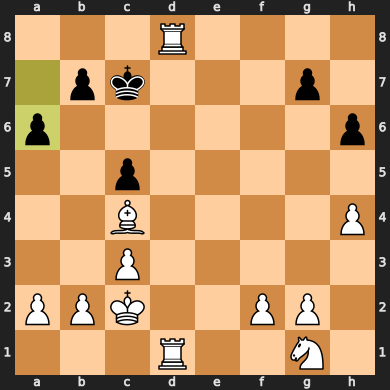



1/1 [==============================] - 0s 23ms/step
-d8e8




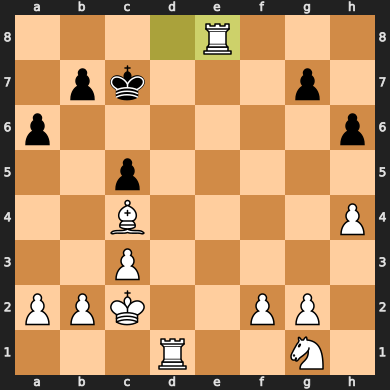



-b7b5




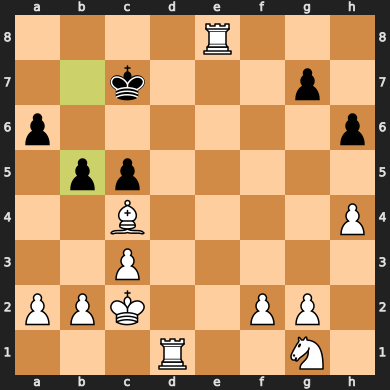



1/1 [==============================] - 0s 24ms/step
-c4d5




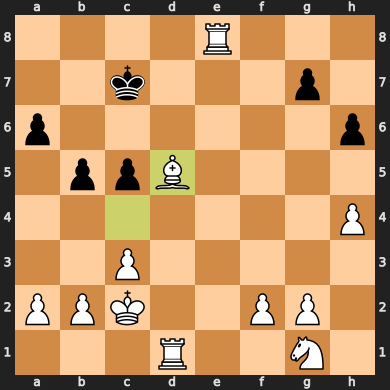



-c5c4




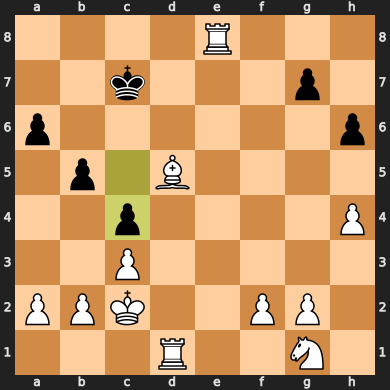



1/1 [==============================] - 0s 25ms/step
-d5f3




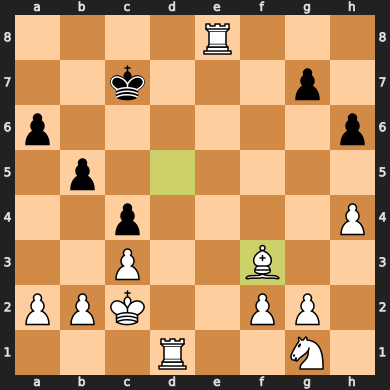



-b5b4




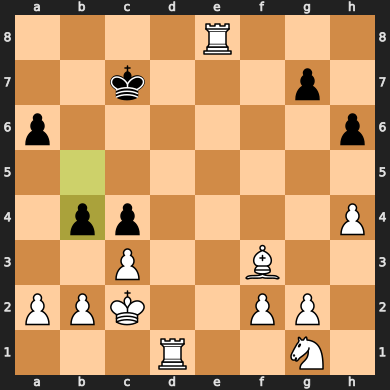



1/1 [==============================] - 0s 23ms/step
-g1h3




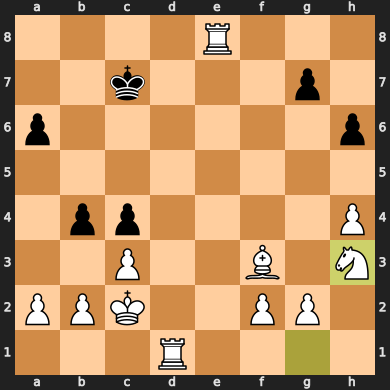



-b4c3




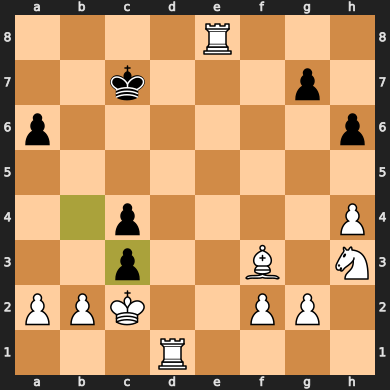



1/1 [==============================] - 0s 36ms/step
-c2c3




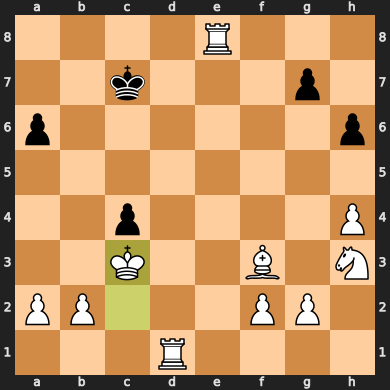



-h6h5




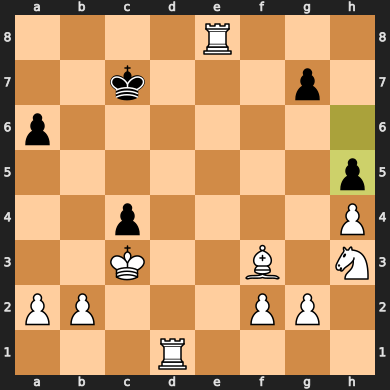



1/1 [==============================] - 0s 24ms/step
-g2g3




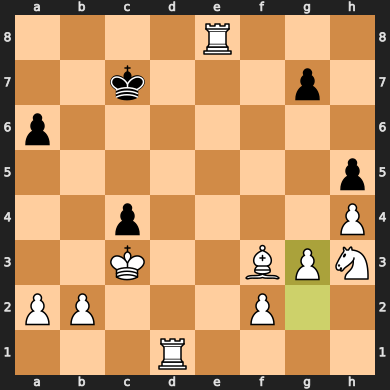



-a6a5




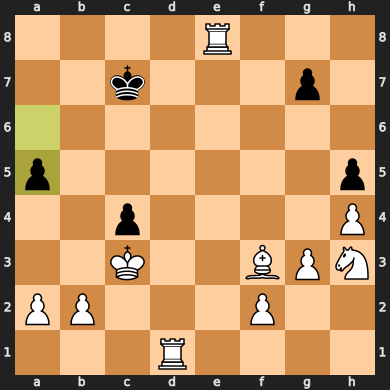



1/1 [==============================] - 0s 23ms/step
-c3c4




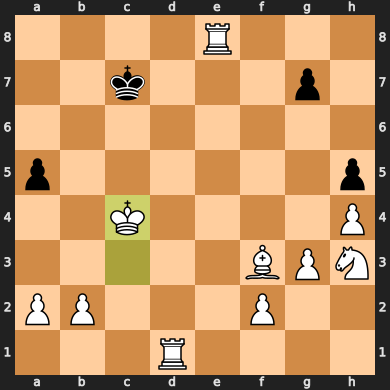



-a5a4




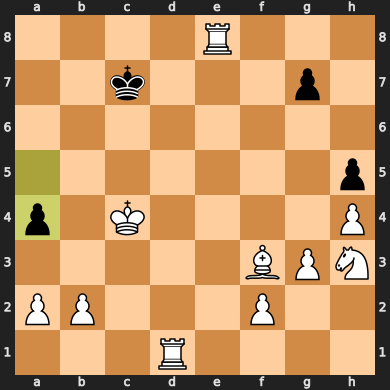



1/1 [==============================] - 0s 25ms/step
-a2a3




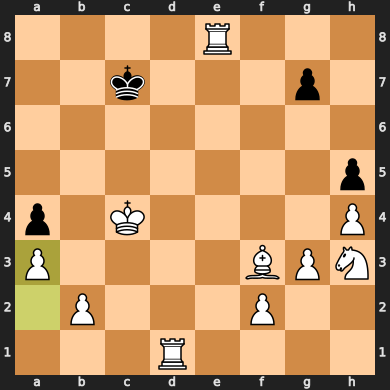



-g7g5




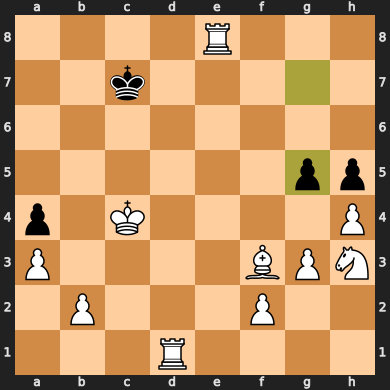



1/1 [==============================] - 0s 24ms/step
-h4g5




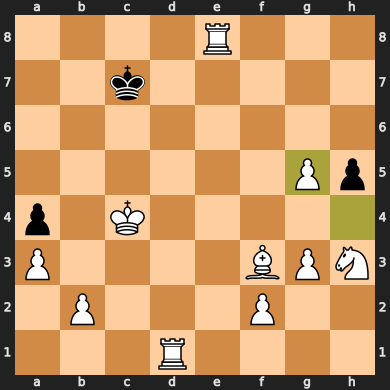



-h5h4




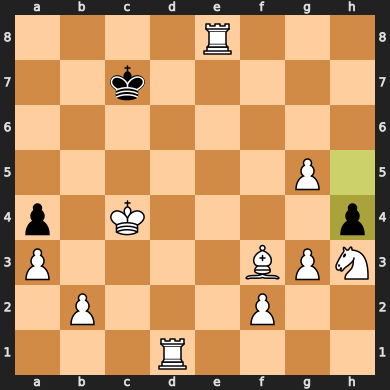



1/1 [==============================] - 0s 24ms/step
-e8d8




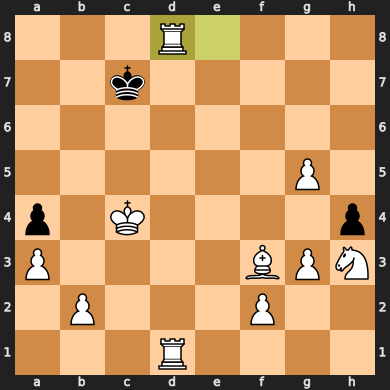



-h4g3




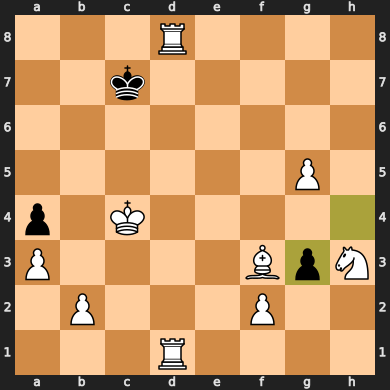



1/1 [==============================] - 0s 39ms/step
-f2g3




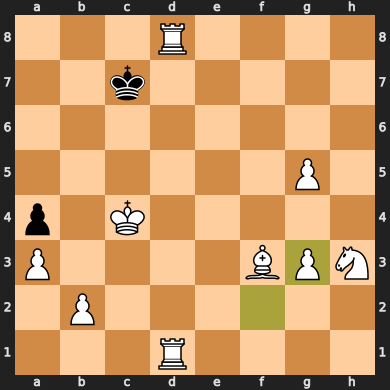



-c7b6




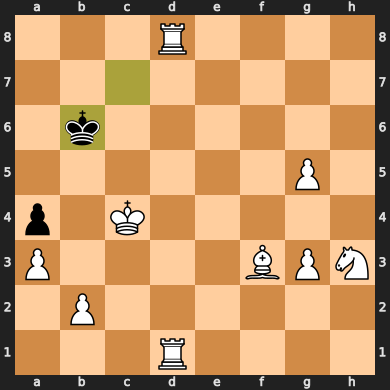



1/1 [==============================] - 0s 24ms/step
-f3e4




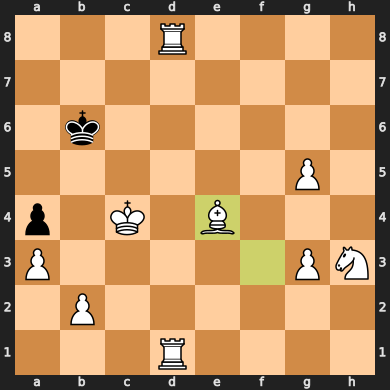



-b6a7




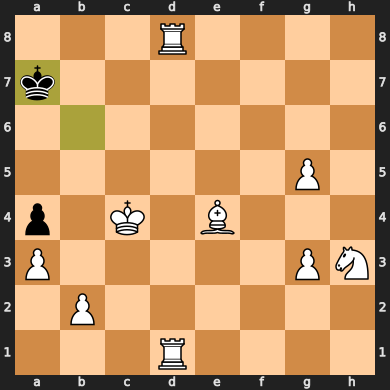



1/1 [==============================] - 0s 24ms/step
-c4c5




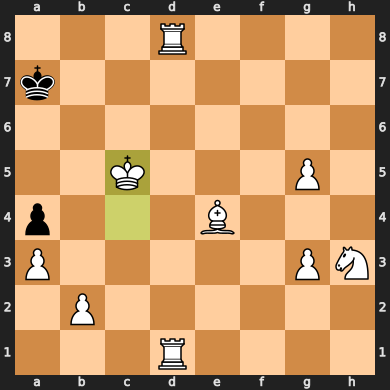



-a7a6




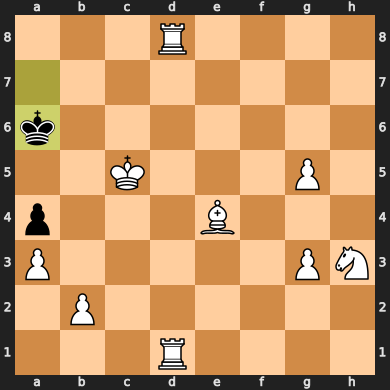



1/1 [==============================] - 0s 24ms/step
-d8a8




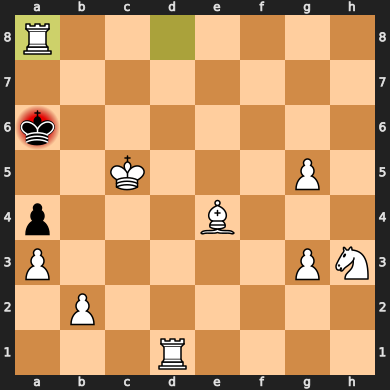



Final situation



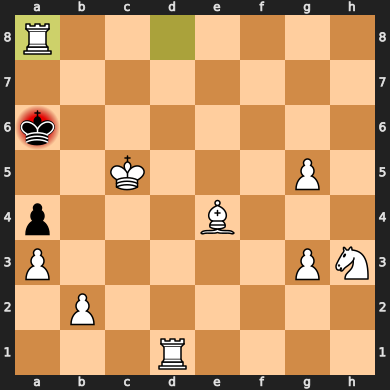



1-0
Cause of termination: Checkmate
# of moves: 85


In [24]:
infrastructure = Infrastructure()

state = ChessState('advancedAi', 2, 'minmax', 1)

print('Start situation\n')
state.show()
print('Sequence of moves:\n')

while not(state.final()):
  action = state.nextAction()
  infrastructure.main(state, action)
  state.show()

print('Final situation\n')
state.show()
state.result()